<div class="alert alert-block alert-info">

# Predict Hotel Booking Cancellations
    
</div>

- Beatriz Sousa, number: 20220674
- David Castro, number: 20220688
- Miguel Cruz, number: 20221391

**GOALS**: Predict Customer Churn <br>
`INPUT VARIABLES`: numerical and categorical <br>
`OUTPUT VARIABLE`: numeric (binary classification) <br>

Some code was adapted from our projects for Data Mining, Machine Learning, and Business Cases Curricular Units.

https://www.kaggle.com/datasets/jessemostipak/hotel-booking-demand?resource=download

<a id = "toc"></a>

1. [Data Understanding](#data-understanding)
2. [Data Preparation](#data-preparation)
3. [Modelling](#modelling)
4. [Evaluation and Testing](#evaluation)

In [1]:
# !pip install pandas==1.5.2

In [2]:
# !pip install numpy==1.23.5

In [3]:
# !pip install matplotlib==3.6.2

In [4]:
# !pip install seaborn==0.12.2

In [5]:
# !pip install missingno==0.4.2

In [6]:
# !pip install scikit-learn==1.2.1

In [7]:
# !pip install graphviz==0.20.1

In [8]:
# !pip install pydotplus==2.0.2

In [9]:
# !pip install scipy==1.10.0

In [10]:
# !pip install plotly==5.13.1

In [11]:
# general setup

import pandas as pd
import numpy as np

import os

from datetime import datetime
import datetime
import time

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.collections import PolyCollection
import plotly.express as px

import missingno as msno

from scipy.stats import chi2_contingency, kendalltau

from math import ceil

from sklearn.base import clone
from sklearn.linear_model import LassoCV, Ridge, ElasticNet, LogisticRegression, RidgeClassifier
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, OneHotEncoder, OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold, RepeatedKFold, RepeatedStratifiedKFold, LearningCurveDisplay, learning_curve, cross_validate
from sklearn.feature_selection import RFE, mutual_info_classif, f_classif, SelectKBest, SequentialFeatureSelector
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report, roc_curve, auc, precision_recall_curve
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, StackingClassifier, ExtraTreesClassifier

import warnings
warnings.filterwarnings("ignore")

from boruta import BorutaPy

<a id = "data-understanding"></a>
    
## 1. Data Understanding

<a id = "understanding-index"></a>

- [1.1. Import the datasets](#import-datasets)
- [1.2. Copy the datasets](#copy-datasets)
- [1.3. Formatting tables](#format-tables)
- [1.4. Incoherences](#incoherences)

[Back to TOC](#toc)

<a id = "import-datasets"></a>

### 1.1. Import the datasets

[Back to Data Understanding](#understanding-index)

In [12]:
# path to database

my_path = os.path.join("..", "data", "01_raw", "hotel_bookings.csv")

In [13]:
df = pd.read_csv(my_path)
df

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,...,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,...,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,...,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,...,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07


**Data Dictionary**:

- `adr`: Average Daily Rate, which measures the average rental revenue earned for an occupied room per day.
- `adults`: Number of adults.
- `agent`: ID of the travel agency that made the booking.
- `arrival_date_day_of_month`: Day of the month of the arrival date.
- `arrival_date_month`: Month of arrival date with 12 categories: “January” to “December”.
- `arrival_date_week_number`: Week number of the arrival date.
- `arrival_date_year`: Year of the arrival date.
- `assigned_room_type`: Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons.
- `babies`: Number of babies.
- `booking_changes`: Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation.
- `children`: Number of children. 
- `company`: ID of the company/entity that made the booking or is responsible for paying the booking. ID is presented instead of designation for anonymity reasons.
- `country`: Country of origin. Categories are represented in the ISO 3155-3:2013 format.
- `customer_type`: Type of booking, assuming one of four categories:
    - Contract: when the booking has an allotment or other type of contract associated to it;
    - Group: when the booking is associated to a group;
    - Transient: when the booking is not part of a group or contract, and is not associated to other transient booking;
    - Transient-party: when the booking is transient, but is associated to at least other transient booking.
- `days_in_waiting_list`: Number of days the booking was in the waiting list before it was confirmed to the customer.
- `deposit_type`: Indication if the customer made a deposit to guarantee the booking. This variable can assume three categories:
    - No Deposit: no deposit was made;
    - Non Refund: a deposit was made in the value of the total stay cost;
    - Refundable: a deposit was made with a value under the total cost of the stay.
- `distribution_channel`: Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”.
- `hotel`: The hotel to which the reservation refers to (H1 = Resort Hotel or H2 = City Hotel)
- `is_canceled`: Value indicating if the booking was canceled (1) or not (0) - **Target**
- `is_repeated_guest`: Value indicating if the booking name was from a repeated guest (1) or not (0).
- `lead_time`: Number of days that elapsed between the entering date of the booking into the PMS and the arrival date.
- `market_segment`: Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”.
- `meal`: Type of meal booked. Categories are presented in standard hospitality meal packages:
    - Undefined/SC: no meal package;
    - BB: Bed & Breakfast;
    - HB: Half board (breakfast and one other meal- usually dinner);
    - FB: Full board (breakfast, lunch and dinner).
- `previous_bookings_not_canceled`: Number of previous bookings not cancelled by the customer prior to the current booking.
- `previous_cancellations`: Number of previous bookings that were cancelled by the customer prior to the current booking.
- `required_car_parking_spaces`: Number of car parking spaces required by the customer.
- `reservation_status`: Reservation last status, assuming one of three categories:
    - Canceled: booking was canceled by the customer;
    - Check-Out: customer has checked in but already departed;
    - No-Show: customer did not check-in and did inform the hotel of the reason why.
- `reservation_status_date`: Date at which the last status was set. This variable can be used in conjunction with the *reservationStatus* to understand when was the booking canceled or when did the customer checked-out of the hotel.
- `reserved_room_type`: Code of room type reserved. Code is presented instead of designation for anonymity reasons.
- `stays_in_weekend_nights`: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel.
- `stays_in_week_nights`: Number of weeknights (Monday to Friday) the guest stayed or booked to stay at the hotel.
- `total_of_special_requests`: Number of special requests made by the customer (e.g. twin bed or high floor).

We are only interested in keeping the analysis for the Resort Hotel, therefore the observations regarding the City Hotel will be deleted. Also, the hotel column will be dropped, since we will have the same values for the observations kept.

In [14]:
df = df[df['hotel'] == 'Resort Hotel']
df.drop(columns = 'hotel', inplace = True)

df.head()

,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,0,342,2015,July,27,1,0,0,2,0.0,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,0,737,2015,July,27,1,0,0,2,0.0,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,0,7,2015,July,27,1,0,1,1,0.0,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,0,13,2015,July,27,1,0,1,1,0.0,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,0,14,2015,July,27,1,0,2,2,0.0,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


The data for this project can be enriched with data from other sources that can help explain cancellations in Hotels. Holidays can be a factor affecting cancellations in hotels, as during holidays there is usually a higher demand for hotel rooms, making prices higher. This can lead to customers being more sensitive to the quality of their experience. Also, holidays can affect the availability of hotel rooms.

So, a new variable `number_holidays` is going to be created, representing how many holidays were present on the dates of the reservation. Data was extracted from this website: https://www.timeanddate.com/holidays/portugal/2015

In [15]:
# defining the list of holidays in lisbon
# source: https://www.timeanddate.com/holidays/portugal/2015

holidays = [pd.to_datetime('2015-01-01'), pd.to_datetime('2016-01-01'), pd.to_datetime('2017-01-01'),
            pd.to_datetime('2015-02-17'), pd.to_datetime('2016-02-09'), pd.to_datetime('2017-02-28'),
            pd.to_datetime('2015-04-03'), pd.to_datetime('2016-03-25'), pd.to_datetime('2017-04-14'),
            pd.to_datetime('2015-04-05'), pd.to_datetime('2016-03-27'), pd.to_datetime('2017-04-16'),
            pd.to_datetime('2015-04-25'), pd.to_datetime('2016-04-25'), pd.to_datetime('2017-04-25'),
            pd.to_datetime('2015-05-01'), pd.to_datetime('2016-05-01'), pd.to_datetime('2017-05-01'),
            pd.to_datetime('2016-05-26'), pd.to_datetime('2017-06-15'),
            pd.to_datetime('2015-06-10'), pd.to_datetime('2016-06-10'), pd.to_datetime('2017-06-10'),
            pd.to_datetime('2015-06-13'), pd.to_datetime('2016-06-13'), pd.to_datetime('2017-06-13'),
            pd.to_datetime('2015-08-15'), pd.to_datetime('2016-08-15'), pd.to_datetime('2017-08-15'),
            pd.to_datetime('2016-10-05'), pd.to_datetime('2017-10-05'),
            pd.to_datetime('2016-11-01'), pd.to_datetime('2017-11-01'),
            pd.to_datetime('2016-12-01'), pd.to_datetime('2016-12-01'),
            pd.to_datetime('2015-12-08'), pd.to_datetime('2016-12-08'), pd.to_datetime('2017-12-08'),
            pd.to_datetime('2015-12-25'), pd.to_datetime('2016-12-25'), pd.to_datetime('2017-12-25')]

In [16]:
def create_holidays(data):
    """
    inputs:
    - data: pandas DataFrame containing the start date and end date of a reservation.
    
    function to create a new column in a DataFrame indicating the number of holidays that occur during each reservation period
    """

    def count_holidays(start_date, end_date, holidays):
        """
        inputs:
        - start_date: datetime object representing the start date of a reservation period.
        - end_date: datetime object representing the end date of a reservation period.
        - holidays: list of datetime objects representing the holidays.
        
        function to count the number of holidays that fall within the reservation period (inclusdive of start and end dates), returning an integer
        """

        num_holidays = sum(1 for holiday in holidays if start_date <= holiday <= end_date)
        
        return num_holidays
    
    # calculate the number of holidays that the reservation had
    data['number_holidays'] = data.apply(lambda row: count_holidays(row['arrival_date'], row['departure_date'], holidays), axis = 1)

    return data

In [17]:
# Extracting the year, month, and day columns from df
year = df['arrival_date_year']
month = df['arrival_date_month']
day = df['arrival_date_day_of_month']

# Creating new datetime column ('arrival_date') in df
df['arrival_date'] = pd.to_datetime(year.astype(str) + '-' + month + '-' + day.astype(str))

In [18]:
# Creating feature 'departure_date'
df['departure_date'] = df['arrival_date'] + pd.to_timedelta(df['stays_in_week_nights'] + 
                                                            df['stays_in_weekend_nights'], unit = 'd')

In [19]:
# creating a column with the number of holidays for each reservation

df = create_holidays(df)

Also, weather conditions information can be used in this project since they are likely to impact travel plans and lead to cancellations or changes in hotel reservations. Therefore, from the other dataset, data regarding temperature, dew point, humidity, wind speed, pressure, and precipitation was collected. After that, the data will be merged with each observation in the original dataset, making sure we have information regarding the weather conditions when the reservation was taking place. The merging will be made in a way that we will end with columns containing the average of the weather conditions during the days of the reservation.

In [20]:
my_path = os.path.join("..", "data", "01_raw", "Algarve 2015-07-01 to 2017-08-31.csv")

In [21]:
df_weather = pd.read_csv(my_path, parse_dates = ["datetime"])
df_weather.head()

,name,datetime,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,...,solarenergy,uvindex,severerisk,sunrise,sunset,moonphase,conditions,description,icon,stations
0,Algarve,2015-07-01,17.0,12.0,14.9,17.0,12.0,14.9,11.6,81.6,...,12.5,6,NaN,2015-07-01T07:20:57,2015-07-01T17:35:26,0.50,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"SBPA,83967099999,83971099999,SBCO"
1,Algarve,2015-07-02,20.9,10.0,14.9,20.9,10.0,14.9,12.0,84.0,...,10.1,5,NaN,2015-07-02T07:20:57,2015-07-02T17:35:50,0.52,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"SBPA,83967099999,83971099999,remote,SBCO"
2,Algarve,2015-07-03,22.4,12.6,16.5,22.4,12.6,16.5,13.7,84.1,...,10.9,6,NaN,2015-07-03T07:20:56,2015-07-03T17:36:14,0.55,"Rain, Partially cloudy",Partly cloudy throughout the day with late aft...,rain,"SBPA,83967099999,83971099999,SBCO"
3,Algarve,2015-07-04,13.0,9.0,11.2,13.0,6.4,11.1,7.1,76.2,...,9.5,4,NaN,2015-07-04T07:20:53,2015-07-04T17:36:39,0.59,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"SBPA,83967099999,83971099999,SBCO"
4,Algarve,2015-07-05,18.0,6.1,12.1,18.0,6.1,12.1,8.1,77.9,...,12.9,6,NaN,2015-07-05T07:20:48,2015-07-05T17:37:05,0.63,Partially cloudy,Partly cloudy throughout the day.,partly-cloudy-day,"SBPA,83967099999,83971099999,SBCO"


In [22]:
df_weather.columns

Index(['name', 'datetime', 'tempmax', 'tempmin', 'temp', 'feelslikemax',
       'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob',
       'precipcover', 'preciptype', 'snow', 'snowdepth', 'windgust',
       'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility',
       'solarradiation', 'solarenergy', 'uvindex', 'severerisk', 'sunrise',
       'sunset', 'moonphase', 'conditions', 'description', 'icon', 'stations'],
      dtype='object')

In [23]:
df_weather.drop(['name', 'tempmax', 'tempmin', 'feelslikemax', 'feelslikemin', 'feelslike', 'severerisk', 'sunrise',
                 'sunset', 'moonphase', 'conditions', 'description', 'icon', 'stations'], axis = 1, inplace = True)

In [24]:
df_weather.drop(['dew','humidity','precipprob','precipcover','preciptype','snow','snowdepth','windgust',
                 'winddir','sealevelpressure', 'solarradiation', 'solarenergy', 'uvindex'], axis = 1, inplace = True)
df_weather.head()

,datetime,temp,precip,windspeed,cloudcover,visibility
0,2015-07-01,14.9,0.000,13.2,58.4,10.3
1,2015-07-02,14.9,0.000,25.1,66.0,7.6
2,2015-07-03,16.5,0.455,29.1,63.2,10.1
3,2015-07-04,11.2,0.000,30.5,72.3,10.5
4,2015-07-05,12.1,0.000,25.3,45.4,10.5


In [25]:
def create_weather(data):
    """
    inputs:
    - data: pandas DataFrame containing the start date and end date of a reservation.
    
    function to create a new column in a DataFrame indicating the average of each weather indicator during each reservation 
    period
    """

    def average_weather(start_date, end_date, df_weather):
        """
        inputs:
        - start_date: datetime object representing the start date of a reservation period.
        - end_date: datetime object representing the end date of a reservation period.
        - df_weather: pandas DataFrame containing the weather indicators for each day.
        
        function to average the values of the weather indicators that fall within the reservation period (inclusive of start and 
        end dates)
        """
        period = df_weather['datetime'].between(start_date, end_date)
        average_temp = np.mean(df_weather.loc[period, 'temp'].values)
        average_precip = np.mean(df_weather.loc[period, 'precip'].values)
        average_wind_speed = np.mean(df_weather.loc[period, 'windspeed'].values)
        average_cloud_cover = np.mean(df_weather.loc[period, 'cloudcover'].values)
        average_visibility = np.mean(df_weather.loc[period, 'visibility'].values)
        
        return average_temp, average_precip, average_wind_speed, average_cloud_cover, average_visibility
    
    # calculate the average of each weather indicator corresponding to the reservation period
    results = data.apply(lambda row: average_weather(row['arrival_date'], row['departure_date'], df_weather), 
                                         axis = 1)
    data['temp'] = list(map(lambda t: t[0], results))
    data['precip'] = list(map(lambda t: t[1], results))
    data['wind_speed'] = list(map(lambda t: t[2], results))
    data['cloud_cover'] = list(map(lambda t: t[3], results))
    data['visibility'] = list(map(lambda t: t[4], results))

    return data

In [26]:
# Creating the weather associated columns

df = create_weather(df)

<a id = "copy-datasets"></a>

### 1.2. Copy the datasets

[Back to Data Understanding](#understanding-index)

A copy of the original dataset should be created, because during the preprocessing stage we usually try different things, so we should have a copy before doing something wrong with the original data.

In [27]:
df_original = df.copy()

Firstly, we start by checking the shape of the datasets.

In [28]:
df.shape

(40060, 39)

<a id = "variable-types"></a>

### 1.3. Variable types

[Back to Data Understanding](#understanding-index)

In [29]:
# checking the data types of the variables of the dataset and if there are any missing values

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40060 entries, 0 to 40059
Data columns (total 39 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   is_canceled                     40060 non-null  int64         
 1   lead_time                       40060 non-null  int64         
 2   arrival_date_year               40060 non-null  int64         
 3   arrival_date_month              40060 non-null  object        
 4   arrival_date_week_number        40060 non-null  int64         
 5   arrival_date_day_of_month       40060 non-null  int64         
 6   stays_in_weekend_nights         40060 non-null  int64         
 7   stays_in_week_nights            40060 non-null  int64         
 8   adults                          40060 non-null  int64         
 9   children                        40060 non-null  float64       
 10  babies                          40060 non-null  int64         
 11  me

From the information above, we can see that `children` is stored as float, however, since it represents the number of children in the reservation should be stored as integer. Regarding the other data types everything is correct, except for variable `reservation_status_date` which represents a date, so should be encoded as Datetime. So, we have 15 categorical variables and 16 numerical variables. Variables `agent`, `company`, and `country` have missing values. 

`is_canceled` is the target variable, that we are trying to predict with this project.

In [30]:
# defining metric and non-metric features

non_metric_features = ['country', 'market_segment', 'deposit_type', 'reservation_status', 'meal', 'reserved_room_type', 'distribution_channel', 'assigned_room_type',
                       'agent', 'is_repeated_guest', 'company', 'customer_type', 'arrival_date_month']

metric_features = ['lead_time', 'arrival_date_year', 'arrival_date_week_number', 'arrival_date_day_of_month', 'stays_in_weekend_nights', 'stays_in_week_nights',
                   'adults', 'children', 'babies', 'previous_cancellations', 'previous_bookings_not_canceled', 'booking_changes', 'days_in_waiting_list',
                   'adr', 'required_car_parking_spaces', 'total_of_special_requests',
                   'number_holidays', 'temp', 'precip', 'wind_speed', 'cloud_cover', 'visibility']

<a id = "incoherences"></a>

### 1.4. Incoherences

[Back to Data Understanding](#understanding-index)

We can check if there are reservations with no people associated with, meaning that the reservation was for 0 adults, 0 children, and 0 babies.

In [31]:
df[(df['adults'] == 0) & (df['children'] == 0) & (df['babies'] == 0)]

,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,reservation_status,reservation_status_date,arrival_date,departure_date,number_holidays,temp,precip,wind_speed,cloud_cover,visibility
2224,0,1,2015,October,41,6,0,3,0,0.0,...,Check-Out,2015-10-06,2015-10-06,2015-10-09,0,19.875000,16.192750,23.975000,84.475000,7.550000
2409,0,0,2015,October,42,12,0,0,0,0.0,...,Check-Out,2015-10-12,2015-10-12,2015-10-12,0,17.500000,0.000000,28.500000,87.700000,9.300000
3181,0,36,2015,November,47,20,1,2,0,0.0,...,Check-Out,2015-11-23,2015-11-20,2015-11-23,0,20.475000,0.050000,30.200000,48.550000,11.000000
3684,0,165,2015,December,53,30,1,4,0,0.0,...,Check-Out,2016-01-04,2015-12-30,2016-01-04,1,25.666667,1.059833,30.733333,69.450000,10.916667
3708,0,165,2015,December,53,30,2,4,0,0.0,...,Check-Out,2016-01-05,2015-12-30,2016-01-05,1,25.842857,0.989714,28.714286,70.300000,10.957143
4127,1,0,2016,February,8,15,0,0,0,0.0,...,Canceled,2016-02-15,2016-02-15,2016-02-15,0,25.700000,0.000000,26.900000,36.600000,10.000000
9376,1,0,2016,November,48,21,0,0,0,0.0,...,Canceled,2016-11-21,2016-11-21,2016-11-21,0,21.400000,0.000000,21.500000,65.800000,10.900000
31765,0,31,2016,December,53,27,2,8,0,0.0,...,Check-Out,2017-01-06,2016-12-27,2017-01-06,1,25.536364,5.925091,20.900000,70.263636,10.118182
32029,0,4,2017,January,2,14,0,1,0,0.0,...,Check-Out,2017-01-15,2017-01-14,2017-01-15,0,26.650000,1.707000,22.900000,60.600000,11.100000
32827,0,46,2017,January,4,25,3,9,0,0.0,...,Check-Out,2017-02-06,2017-01-25,2017-02-06,0,25.484615,0.637769,20.753846,45.553846,11.292308


We can also check for reservations that are for children/babies alone, which can be considered a problem because they do not decide for themselves if they want to cancel the reservation or not, their parents do. So, these reservations are not useful if we want to find the characteristics of the reservations that mostly lead to cancellations, since they do not add any information to the one that we already have.

In [32]:
df[(df['adults'] == 0) & ((df['children'] > 0) | (df['babies'] > 0))]

,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,reservation_status,reservation_status_date,arrival_date,departure_date,number_holidays,temp,precip,wind_speed,cloud_cover,visibility


Since we have information about the number of days booked for the weekend and the number of days booked for the week, we can check if there are observations with 0 days in both variables (`StaysInWeekendNights` and `StaysInWeekNights`), since these observations are wrong.

In [33]:
df[(df['stays_in_weekend_nights'] == 0) & (df['stays_in_week_nights'] == 0)]

,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,reservation_status,reservation_status_date,arrival_date,departure_date,number_holidays,temp,precip,wind_speed,cloud_cover,visibility
0,0,342,2015,July,27,1,0,0,2,0.0,...,Check-Out,2015-07-01,2015-07-01,2015-07-01,0,14.9,0.000,13.2,58.4,10.3
1,0,737,2015,July,27,1,0,0,2,0.0,...,Check-Out,2015-07-01,2015-07-01,2015-07-01,0,14.9,0.000,13.2,58.4,10.3
167,0,111,2015,July,28,6,0,0,2,0.0,...,Check-Out,2015-07-06,2015-07-06,2015-07-06,0,13.9,0.000,14.8,61.2,10.2
168,0,0,2015,July,28,6,0,0,1,0.0,...,Check-Out,2015-07-06,2015-07-06,2015-07-06,0,13.9,0.000,14.8,61.2,10.2
196,0,8,2015,July,28,7,0,0,2,0.0,...,Check-Out,2015-07-07,2015-07-07,2015-07-07,0,15.6,3.074,17.4,97.4,6.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38776,0,0,2017,July,30,29,0,0,2,0.0,...,Check-Out,2017-07-29,2017-07-29,2017-07-29,0,19.2,0.000,17.9,22.4,10.5
38967,0,0,2017,August,31,4,0,0,2,0.0,...,Check-Out,2017-08-04,2017-08-04,2017-08-04,0,14.1,0.000,14.0,48.3,10.4
39377,0,204,2017,August,33,16,0,0,2,0.0,...,Check-Out,2017-08-16,2017-08-16,2017-08-16,0,16.2,0.000,16.6,51.4,8.8
39527,0,0,2017,August,34,20,0,0,2,0.0,...,Check-Out,2017-08-20,2017-08-20,2017-08-20,0,13.9,17.982,20.5,62.7,9.3


<a id = "data-preparation"></a>
    
## 2. Data Preparation

<a id = "preparation-index"></a>

- [2.1. Duplicates](#duplicates)
- [2.2. Data Types](#data-types)
- [2.3. Incoherences](#preparation-incoherences)
- [2.4. Normalization](#normalization)
- [2.5. Missing Values](#missing-values)
- [2.6. Outliers](#outliers)
- [2.7. New Features](#new-features)
- [2.8. Encoding](#encoding)
- [2.9. Principal Component Analysis](#pca)
- [2.10. Summary Data Exploration](#summary)
- [2.11. Variable Selection](#variable-selection)

[Back to TOC](#toc)

<a id = "duplicates"></a>

### 2.1. Duplicates

[Back to Data Preparation](#preparation-index)

In [34]:
# checking duplicate observations

df.duplicated().sum()

6092

In [35]:
# seeing the columns that are duplicated

df[df.duplicated()].T

,5,22,43,138,200,219,256,261,353,372,...,39814,39856,39869,39893,39896,39951,39981,39993,40035,40036
is_canceled,0,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
lead_time,14,72,70,5,0,1,91,30,98,40,...,204,176,407,56,59,142,97,153,21,279
arrival_date_year,2015,2015,2015,2015,2015,2015,2015,2015,2015,2015,...,2017,2017,2017,2017,2017,2017,2017,2017,2017,2017
arrival_date_month,July,July,July,July,July,July,July,July,July,July,...,August,August,August,August,August,August,August,August,August,August
arrival_date_week_number,27,27,27,28,28,28,28,28,29,29,...,34,34,34,35,34,34,35,35,35,35
arrival_date_day_of_month,1,1,2,5,7,8,10,10,13,13,...,26,24,24,27,26,26,27,28,31,31
stays_in_weekend_nights,0,2,2,1,0,0,0,2,1,1,...,2,2,2,2,2,2,2,2,2,2
stays_in_week_nights,2,4,3,0,1,1,2,2,1,4,...,1,5,5,2,3,5,5,5,5,5
adults,2,2,2,2,1,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
children,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


There are duplicate observations in the dataset that should be removed.

In [36]:
# removing duplicate observations

df.drop_duplicates(inplace = True)

In [37]:
df.shape

(33968, 39)

<a id = "data-types"></a>

### 2.2. Data Types

[Back to Data Preparation](#preparation-index)

In [38]:
# checking the datatypes of the variables

df.dtypes

is_canceled                                int64
lead_time                                  int64
arrival_date_year                          int64
arrival_date_month                        object
arrival_date_week_number                   int64
arrival_date_day_of_month                  int64
stays_in_weekend_nights                    int64
stays_in_week_nights                       int64
adults                                     int64
children                                 float64
babies                                     int64
meal                                      object
country                                   object
market_segment                            object
distribution_channel                      object
is_repeated_guest                          int64
previous_cancellations                     int64
previous_bookings_not_canceled             int64
reserved_room_type                        object
assigned_room_type                        object
booking_changes     

In [39]:
# converting the column reservation_status_date to a pandas datetime object

df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'])

In [40]:
# converting 'children' from float to int

df['children'] = df['children'].astype('Int64')

As it says in the article "in some categorical variables like Agent or Company, “NULL” is presented as one of the categories. This should not be considered a missing value, but rather as “not applicable”. For example, if a booking “Agent” is defined as “NULL” it means that the booking did not came from a travel agent" (Antonio, N., De Almeida, A. M., & Nunes, L. (2019). Hotel booking demand datasets. *Data in Brief*, 22, 41–49. https://doi.org/10.1016/j.dib.2018.11.126). So, we will change the NULL values to the category "not applicable".

In [41]:
# replacing the observations that had NULL with the proper category and checking the values that the variable takes

df['company'].fillna(value = 'not applicable', inplace = True)
df['company'] = df['company'].astype(str)
df['company'].value_counts()

not applicable    31491
223.0               503
154.0               133
281.0               119
94.0                 76
                  ...  
408.0                 1
104.0                 1
501.0                 1
6.0                   1
410.0                 1
Name: company, Length: 236, dtype: int64

In [42]:
# replacing the observations that had NULL with the proper category and checking the values that the variable takes

df['agent'].fillna(value = 'not applicable', inplace = True)
df['agent'] = df['agent'].astype(str)
df['agent'].value_counts()

240.0             13020
not applicable     6606
250.0              2778
241.0              1644
40.0                954
                  ...  
64.0                  1
406.0                 1
333.0                 1
427.0                 1
187.0                 1
Name: agent, Length: 186, dtype: int64

In [43]:
# checking again the datatypes of the variables

df.dtypes

is_canceled                                int64
lead_time                                  int64
arrival_date_year                          int64
arrival_date_month                        object
arrival_date_week_number                   int64
arrival_date_day_of_month                  int64
stays_in_weekend_nights                    int64
stays_in_week_nights                       int64
adults                                     int64
children                                   Int64
babies                                     int64
meal                                      object
country                                   object
market_segment                            object
distribution_channel                      object
is_repeated_guest                          int64
previous_cancellations                     int64
previous_bookings_not_canceled             int64
reserved_room_type                        object
assigned_room_type                        object
booking_changes     

<a id = "preparation-incoherences"></a>

### 2.3. Incoherences

[Back to Data Preparation](#preparation-index)

All incoherences mentioned previously on the Data Understanding phase will now be deleted.

In [44]:
# dropping the incoherences found on data understanding

df.drop(df[(df['adults'] == 0) & (df['children'] == 0) & (df['babies'] == 0)].index, inplace = True)
df.drop(df[(df['stays_in_weekend_nights'] == 0) & (df['stays_in_week_nights'] == 0)].index, inplace = True)

<a id = "normalization"></a>

### 2.4. Normalization

- [2.4.1. MinMax Scaling](#min-max-scaling)
- [2.4.2. Standard Scaling](#standard-scaling)
- [2.4.3. Robust Scaling](#robust-scaling)

[Back to Data Preparation](#preparation-index)

<div class="alert alert-block alert-info">

</font> <font color = '#3a7f8f'> **Disclaimer:** </font>

We know that when the entire data is used for training the model using different algorithms, the problem of evaluating the models and selecting the most optimal model remains, since we want to know which model makes a better prediction on future or unseen datasets than all other models. So we need to have some mechanism arises wherein the model is trained on one data set and tested on another dataset.

We have only one dataset with all the data available, but in order to select the best model we should have a validation dataset. We can use several methods: **hold-out method** (used for big datasets), **cross-validation method** (for the generality of the cases) and **leave-one-out method** (for small datasets). 

The appropriate method in this case is the cross-validation method (maybe with stratified k-fold to make sure that the target categories are well represented in both datasets). But, we have several preprocessing steps we should do after the split, to make sure that any validation information is not used in the training phase of our models. So, here we are just defining functions to deal with the different preprocessing problems, and then later on the project we can use them.

In [45]:
# creating a copy of our dataset to test the different functions we are going to create

df_demo = df.copy()

<a id = "min-max-scaling"></a>

#### 2.4.1. MinMax Scaling

MinMax scaling is used because it will preserve the shape of the dataset (no distortion) and also because it is the least disruptive to the information in the original data. This methpd does not reduce the importance of outliers.

In [46]:
# creating a copy to apply MinMaxScaler

df_minmax = df_demo.copy()

In [47]:
def minmax_scaler(data, mf):
    """
    inputs:
    - data: pandas DataFrame that contains the input data to be scaled.
    - mf: list of strings or array containing the names of the features to be scaled.

    function to perform min-max scaling on all the features of the data
    """

    data_scaled = data.copy()
    
    # defining an instance of MinMaxScaler
    scaler = MinMaxScaler()
    
    # scaling the data, making sure that all data will be in the range 0-1
    scaled_feat = scaler.fit_transform(data_scaled.loc[:, mf])

    # and then we assign the scaled data to the dataframe
    data_scaled.loc[:, mf] = scaled_feat
    
    return scaler, data_scaled

In [48]:
def train_val_minmax_scaler(train, validation, mf):
    """
    inputs:
    - train: pandas DataFrame with the training set that needs to be scaled.
    - validation: pandas DataFrame with the validartion set that needs to be scaled.
    - mf: list of strings or array containing the names of the features to be scaled.

    function to perform scaling using MinMax method when the dataset is splitted in train and validation, making sure that only the information from the training dataset is used in the validation set
    it also returns the scaler instance, in case we want to revert the scaling
    """

    train_scaled = train.copy()
    validation_scaled = validation.copy()
    
    # defining an instance of MinMaxScaler
    scaler = MinMaxScaler().fit(train_scaled.loc[:, mf])
    
    # scaling the data
    scaled_train = scaler.transform(train_scaled.loc[:, mf])
    scaled_validation = scaler.transform(validation_scaled.loc[:, mf])

    # and then we assign the scaled data to the dataframe
    train_scaled.loc[:, mf] = scaled_train
    validation_scaled.loc[:, mf] = scaled_validation
    
    return scaler, train_scaled, validation_scaled

In [49]:
# calling the function to scale the data and seeing the descriptive statistics

scaler, df_minmax = minmax_scaler(df_minmax, metric_features)
df_minmax.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
is_canceled,33596.0,0.24,0.43,0.0,0.00,0.00,0.00,1.0
lead_time,33596.0,0.12,0.13,0.0,0.01,0.07,0.20,1.0
arrival_date_year,33596.0,0.57,0.36,0.0,0.50,0.50,1.00,1.0
arrival_date_week_number,33596.0,0.50,0.27,0.0,0.29,0.52,0.69,1.0
arrival_date_day_of_month,33596.0,0.50,0.30,0.0,0.23,0.50,0.77,1.0
stays_in_weekend_nights,33596.0,0.06,0.06,0.0,0.00,0.05,0.11,1.0
stays_in_week_nights,33596.0,0.06,0.05,0.0,0.02,0.06,0.10,1.0
adults,33596.0,0.02,0.01,0.0,0.02,0.02,0.02,1.0
children,33596.0,0.01,0.05,0.0,0.00,0.00,0.00,1.0
babies,33596.0,0.01,0.06,0.0,0.00,0.00,0.00,1.0


All features have a minimum value of 0 and a maximum value of 1.

<a id = "standard-scaling"></a>

#### 2.4.2. Standard Scaling

The standard scaling shoud be used when the data distribution is normal or almost normal.

In [50]:
# creating a copy to apply ZScore scaler

df_standard = df_demo.copy()

In [51]:
def standard_scaler(data, mf):
    """
    inputs:
    - data: pandas DataFrame that contains the input data to be scaled.
    - mf: list of strings or array containing the names of the features to be scaled.

    function to perform standard scaler on all the features of the data
    """
    
    data_scaled = data.copy()
    
    # defining an instance of StandardScaler
    scaler = StandardScaler()
    
    # scaling the data
    scaled_feat = scaler.fit_transform(data_scaled.loc[:, mf])

    # and then we assign the scaled data to the dataframe
    data_scaled.loc[:, mf] = scaled_feat

    return scaler, data_scaled

In [52]:
def train_val_standard_scaler(train, validation, mf):
    """
    inputs:
    - train: pandas DataFrame with the training set that needs to be scaled.
    - validation: pandas DataFrame with the validartion set that needs to be scaled.
    - mf: list of strings or array containing the names of the features to be scaled.

    function to perform scaling using ZScore method when the dataset is splitted in train and validation, making sure that only the information from the training dataset is used in the validation set
    it also returns the scaler instance, in case we want to revert the scaling
    """

    train_scaled = train.copy()
    validation_scaled = validation.copy()
    
    # defining an instance of MinMaxScaler
    scaler = StandardScaler().fit(train_scaled.loc[:, mf])
    
    # scaling the data
    scaled_train = scaler.transform(train_scaled.loc[:, mf])
    scaled_validation = scaler.transform(validation_scaled.loc[:, mf])

    # and then we assign the scaled data to the dataframe
    train_scaled.loc[:, mf] = scaled_train
    validation_scaled.loc[:, mf] = scaled_validation
    
    return scaler, train_scaled, validation_scaled

In [53]:
# calling the function to scale the data and seeing the descriptive statistics

scaler, df_standard = standard_scaler(df_standard, metric_features)
df_standard.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
is_canceled,33596.0,0.24,0.43,0.00,0.00,0.00,0.00,1.00
lead_time,33596.0,-0.00,1.00,-0.91,-0.83,-0.40,0.60,6.81
arrival_date_year,33596.0,-0.00,1.00,-1.59,-0.20,-0.20,1.19,1.19
arrival_date_week_number,33596.0,-0.00,1.00,-1.90,-0.81,0.06,0.72,1.88
arrival_date_day_of_month,33596.0,0.00,1.00,-1.68,-0.89,0.01,0.91,1.70
stays_in_weekend_nights,33596.0,-0.00,1.00,-1.06,-1.06,-0.20,0.66,15.28
stays_in_week_nights,33596.0,-0.00,1.00,-1.29,-0.89,-0.08,0.72,18.81
adults,33596.0,-0.00,1.00,-1.19,0.17,0.17,0.17,71.90
children,33596.0,-0.00,1.00,-0.31,-0.31,-0.31,-0.31,20.63
babies,33596.0,0.00,1.00,-0.13,-0.13,-0.13,-0.13,15.35


All variables have now mean 0 and standard deviation 1, as a consequence of the standardization.

<a id = "robust-scaling"></a>

#### 2.4.3. Robust Scaling

The RobustScaler scales the data according to the interquantile range, so outliers have less influence than in other methods. If outliers are present in the dataset, then the median and the interquartile range provide better results and outperform the sample mean and variance.

In [54]:
# creating a copy to apply robust scaler

df_robust = df_demo.copy()

In [55]:
def robust_scaler(data, mf):
    """
    inputs:
    - data: pandas DataFrame that contains the input data to be scaled.
    - mf: list of strings or array containing the names of the features to be scaled.
    
    function to perform robust scaling on all the features of the data
    """

    data_scaled = data.copy()
    
    # defining an instance of RobustScaler
    scaler = RobustScaler()
    
    # scaling the data
    scaled_feat = scaler.fit_transform(data_scaled.loc[:, mf])

    # and then we assign the scaled data to the dataframe
    data_scaled.loc[:, mf] = scaled_feat

    return scaler, data_scaled

In [56]:
def train_val_robust_scaler(train, validation, mf):
    """
    inputs:
    - train: pandas DataFrame with the training set that needs to be scaled.
    - validation: pandas DataFrame with the validartion set that needs to be scaled.
    - mf: list of strings or array containing the names of the features to be scaled.

    function to perform scaling using Robust method when the dataset is splitted in train and validation, making sure that only the information from the training dataset is used in the validation set
    it also returns the scaler instance, in case we want to revert the scaling
    """
    
    train_scaled = train.copy()
    validation_scaled = validation.copy()
    
    # defining an instance of MinMaxScaler
    scaler = RobustScaler().fit(train_scaled.loc[:, mf])
    
    # scaling the data
    scaled_train = scaler.transform(train_scaled.loc[:, mf])
    scaled_validation = scaler.transform(validation_scaled.loc[:, mf])

    # and then we assign the scaled data to the dataframe
    train_scaled.loc[:, mf] = scaled_train
    validation_scaled.loc[:, mf] = scaled_validation
    
    return scaler, train_scaled, validation_scaled

In [57]:
# calling the function to scale the data and seeing the descriptive statistics

scaler, df_robust = robust_scaler(df_robust, metric_features)
df_robust.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
is_canceled,33596.0,0.24,0.43,0.00,0.00,0.0,0.00,1.00
lead_time,33596.0,0.28,0.70,-0.36,-0.30,0.0,0.70,5.05
arrival_date_year,33596.0,0.14,0.72,-1.00,0.00,0.0,1.00,1.00
arrival_date_week_number,33596.0,-0.04,0.66,-1.29,-0.57,0.0,0.43,1.19
arrival_date_day_of_month,33596.0,-0.01,0.56,-0.94,-0.50,0.0,0.50,0.94
stays_in_weekend_nights,33596.0,0.11,0.58,-0.50,-0.50,0.0,0.50,9.00
stays_in_week_nights,33596.0,0.05,0.62,-0.75,-0.50,0.0,0.50,11.75
adults,33596.0,-0.12,0.74,-1.00,0.00,0.0,0.00,53.00
children,33596.0,0.15,0.48,0.00,0.00,0.0,0.00,10.00
babies,33596.0,0.02,0.13,0.00,0.00,0.0,0.00,2.00


This scaler makes the range of the scaled variables larger than the other two scalers.

In [58]:
# for all mentioned reasons, the MinMax scaler will be kept for the metric features

df_scaled = df_minmax.copy()

<a id = "missing-values"></a>

### 2.5. Missing Values

- [2.5.1. Delete Records](#delete)
- [2.5.2. Fill in with a Measure of Central Tendency](#central-tendency)

[Back to Data Preparation](#preparation-index)

In [59]:
# creating a copy to solve the problems with missing values

df_missing = df_demo.copy()

In [60]:
# replacing other types of missing values not recognized by pandas with NaN and checking again the number of missing values

missing_values = ['n/a', 'na', '--', '', 'unknown', 'Unknown', 'NULL']

df_missing.replace(missing_values, np.nan, inplace = True)
df_missing.isna().sum()

is_canceled                         0
lead_time                           0
arrival_date_year                   0
arrival_date_month                  0
arrival_date_week_number            0
arrival_date_day_of_month           0
stays_in_weekend_nights             0
stays_in_week_nights                0
adults                              0
children                            0
babies                              0
meal                                0
country                           439
market_segment                      0
distribution_channel                0
is_repeated_guest                   0
previous_cancellations              0
previous_bookings_not_canceled      0
reserved_room_type                  0
assigned_room_type                  0
booking_changes                     0
deposit_type                        0
agent                               0
company                             0
days_in_waiting_list                0
customer_type                       0
adr         

In [61]:
# seeing rows with NaNs

nans_index = df_missing.isna().any(axis = 1)
df_missing[nans_index]

,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,reservation_status,reservation_status_date,arrival_date,departure_date,number_holidays,temp,precip,wind_speed,cloud_cover,visibility
30,0,118,2015,July,27,1,4,10,1,0,...,Check-Out,2015-07-15,2015-07-01,2015-07-15,0,15.006667,5.488667,19.560000,77.440000,7.986667
7092,1,8,2016,July,30,21,0,1,1,0,...,Canceled,2016-07-20,2016-07-21,2016-07-22,0,10.350000,0.000000,12.450000,64.350000,8.300000
7860,1,39,2016,August,36,30,0,5,2,0,...,Canceled,2016-07-22,2016-08-30,2016-09-04,0,16.916667,5.848500,15.333333,92.133333,8.333333
8779,1,0,2016,October,42,13,0,1,1,0,...,Canceled,2016-10-13,2016-10-13,2016-10-14,0,21.400000,3.873000,22.700000,67.900000,9.600000
9610,1,4,2016,December,52,20,0,1,1,0,...,Canceled,2016-12-19,2016-12-20,2016-12-21,0,26.150000,0.000000,22.850000,46.850000,11.100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23583,0,9,2016,April,18,28,0,1,1,0,...,Check-Out,2016-04-29,2016-04-28,2016-04-29,0,11.000000,0.000000,23.400000,42.300000,11.100000
26473,0,19,2016,July,31,28,1,3,2,0,...,Check-Out,2016-08-01,2016-07-28,2016-08-01,0,14.820000,0.000000,14.760000,46.480000,9.760000
28460,0,0,2016,October,41,3,1,0,2,0,...,Check-Out,2016-10-04,2016-10-03,2016-10-04,0,18.550000,0.000000,33.300000,67.550000,11.600000
31594,0,31,2016,December,53,30,0,2,1,0,...,Check-Out,2017-01-01,2016-12-30,2017-01-01,1,26.433333,1.156667,20.100000,62.900000,10.466667


<a id = "delete"></a>

#### 2.5.1. Delete Records

A way to deal with missing values is to just **delete the observations** that have them. The problem with this approach is the lost of information and the potential bias in the data it creates, as, by ignoring the observation, the remaining attributes’ values in this observation are not used (which could be important to our analysis).

In [62]:
# creating a copy to delete the missing values

df_delete = df_missing.copy()

In [63]:
def delete_nan(data):
    """
    inputs:
    - data: pandas DataFrame with the observations with missing values to be deleted.

    function to delete observations that contain missing values
    """
    
    # deleting the observations that contain missing values (inplace = True to save the changes directly in the dataset)
    data.dropna(inplace = True)
    
    return data

In [64]:
# testing the function
df_delete = delete_nan(df_delete)

# and seeing that the rows with the missing values do not exist anymore
df_delete.loc[nans_index, :]

,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,reservation_status,reservation_status_date,arrival_date,departure_date,number_holidays,temp,precip,wind_speed,cloud_cover,visibility


In [65]:
print('Percentage of data kept after removing missing values:', np.round(df_delete.shape[0] / df_missing.shape[0], 4) * 100, '%')

Percentage of data kept after removing missing values: 98.69 %


2% of the dataset was deleted (after the previous steps in data preparation), just to deal with missing values.

<a id = "central-tendency"></a>

#### 2.5.2. Fill in with a Measure of Central Tendency

Another way to deal with missing values is fill in with a **measure of central tendency** (median for metric features, because it less affected by extreme observations than the mean, and mode for non metric features). By using this method, the relationship between columns can also be affected, the standard error can be biased and, if values are not missing at random, the actual median/mode of the column can also be biased.

In [66]:
# creating a copy to apply central tendency measures imputation

df_central = df_missing.copy()

In [67]:
def input_nan_central(data, mf = None, nmf = None):
    """
    inputs:
    - data: pandas DataFrame containing the input data with missing values to be filled.
    - mf: list of strings containing the names of the features to be filled with the median (metric features).
    - nmf: list of strings or array containing the names of the features to be filled with the mode (non-metric features).

    function to inpute missing values with a measure of central tendency of the feature
    """

    # calculating the medians and the modes of the variables, and then concatenating these two measures into one imputer object
    if mf == None:
        modes = data[nmf].mode().loc[0]
        input_values = modes
    
    if nmf == None:
        medians = data[mf].median()
        input_values = medians

    if (mf != None) & (nmf != None):
        modes = data[nmf].mode().loc[0]
        medians = data[mf].median()
        input_values = pd.concat([medians, modes])
    
    # filling the missing values
    data.fillna(input_values, inplace = True)
    
    return data

In [68]:
def train_val_input_nan_central(train, validation, mfna = None, nmfna = None):
    """
    inputs:
    - train: pandas DataFrame containing the training data with missing values to be filled.
    - validation: pandas DataFrame containing the validation data with missing values to be filled.
    - mfna: list of strings containing the names of the features to be filled with the median (metric features).
    - nmfna: list of strings or array containing the names of the features to be filled with the mode (non-metric features).

    function to inpute missing values with a measure of central tendency of the feature when the data is divided between training and validation
    to make sure that information from the validation set is not used to fill the missing values
    """
    
    # calculating the medians and the modes of the variables, and then concatenating these two measures into one imputer object
    if mfna == None:
        modes = train[nmfna].mode().loc[0]
        input_values = modes
    
    if nmfna == None:
        medians = train[mfna].median()
        input_values = medians

    if (mfna != None) & (nmfna != None):
        modes = train[nmfna].mode().loc[0]
        medians = train[mfna].median()
        input_values = pd.concat([medians, modes])
    
    # filling the missing values
    train.fillna(input_values, inplace = True)
    validation.fillna(input_values, inplace = True)
    
    return train, validation

In [69]:
# testing our function
df_central = input_nan_central(df_central, metric_features, non_metric_features)

# and seeing that the rows with the missing values do not exist anymore
df_central.loc[nans_index, :]

,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,...,reservation_status,reservation_status_date,arrival_date,departure_date,number_holidays,temp,precip,wind_speed,cloud_cover,visibility
30,0,118,2015,July,27,1,4,10,1,0,...,Check-Out,2015-07-15,2015-07-01,2015-07-15,0,15.006667,5.488667,19.560000,77.440000,7.986667
7092,1,8,2016,July,30,21,0,1,1,0,...,Canceled,2016-07-20,2016-07-21,2016-07-22,0,10.350000,0.000000,12.450000,64.350000,8.300000
7860,1,39,2016,August,36,30,0,5,2,0,...,Canceled,2016-07-22,2016-08-30,2016-09-04,0,16.916667,5.848500,15.333333,92.133333,8.333333
8779,1,0,2016,October,42,13,0,1,1,0,...,Canceled,2016-10-13,2016-10-13,2016-10-14,0,21.400000,3.873000,22.700000,67.900000,9.600000
9610,1,4,2016,December,52,20,0,1,1,0,...,Canceled,2016-12-19,2016-12-20,2016-12-21,0,26.150000,0.000000,22.850000,46.850000,11.100000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23583,0,9,2016,April,18,28,0,1,1,0,...,Check-Out,2016-04-29,2016-04-28,2016-04-29,0,11.000000,0.000000,23.400000,42.300000,11.100000
26473,0,19,2016,July,31,28,1,3,2,0,...,Check-Out,2016-08-01,2016-07-28,2016-08-01,0,14.820000,0.000000,14.760000,46.480000,9.760000
28460,0,0,2016,October,41,3,1,0,2,0,...,Check-Out,2016-10-04,2016-10-03,2016-10-04,0,18.550000,0.000000,33.300000,67.550000,11.600000
31594,0,31,2016,December,53,30,0,2,1,0,...,Check-Out,2017-01-01,2016-12-30,2017-01-01,1,26.433333,1.156667,20.100000,62.900000,10.466667


In [70]:
# checking how many NaNs we still have

df_central.isna().sum()

is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
agent                             0
company                           0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces 

The most simple method should be used for starting, so the central tendency imputation will be kept. Of course, this can be changed through the preprocessing stage, as it is a cyclical process.

In [71]:
# choosing the median inputation
df_demo = df_central.copy()

# updating the scaled version of the dataset with the missing values filled
scaler, df_scaled = minmax_scaler(df_demo, metric_features)

<a id = "outliers"></a>

### 2.6. Outliers

- [2.6.1. IQR Method](#iqr-method)
- [2.6.2. Manual Filtering](#manual-filtering)

[Back to Data Preparation](#preparation-index)

Outliers are data points that are significantly different from the rest of the observations in a dataset and they can significantly affect the performance of a machine learning model, and therefore, the accuracy of the churn prediction that we are trying to do. They can arise from different reasons, like measurement errors, data entry errors, or even genuine extreme values in data (Bill Gates effect), and since they can distort the relationship between the predictor variables they should be addressed.

In [72]:
# creating a copy to apply the methods for outlier removal

df_outlier = df_demo.copy()

<a id = "iqr-method"></a>

#### 2.6.1. IQR Method

IQR method can be used to identify outliers, seting up a “fence” outside of the first and the third quartile. Any values that fall outside of this fence are considered outliers.

In [73]:
def IQR_method(data, mf):
    """
    inputs:
    - data: pandas DataFrame containing the data to be filtered.
    - mf: list of strings representing the names of the columns to be filtered.

    function to filter the outliers from a dataset using the interquartil range (IQR) method
    any observations outside of the upper and lower limits (defined by 1-5 times the IQR) are considered outliers and removed from the dataset
    """
    
    # calculating the quartiles and the correspondent inter quartil range
    q25 = data[mf].quantile(.25)
    q75 = data[mf].quantile(.75)
    iqr = (q75 - q25)
    
    # defining the limits to search for outliers
    upper_lim = q75 + 1.5 * iqr
    lower_lim = q25 - 1.5 * iqr
    
    # applying the calculated measures to filter the observations in our dataset and transforming the result into a pandas series
    filter = []
    for metric in mf:
        llim = lower_lim[metric]
        ulim = upper_lim[metric]
        filter.append(data[metric].between(llim, ulim, inclusive = 'both'))
    filter = pd.Series(np.all(filter, 0), index = data.index)

    # applying the filter to our dataframe
    data_filter = data[filter]

    return data_filter, filter

In [74]:
def x_y_IQR_method(x_data, y_data, mf):
    """
    inputs:
    - x_data: pandas DataFrame containing the input independent data.
    - y_data: pandas DataFrame containing the input dependent data.
    - mf: list of strings representing the names of the columns to be filtered.

    function to filter the outliers from a dataset using the interquartil range (IQR) method, when the data is divided between dependent and independent variables
    any observations outside of the upper and lower limits (defined by 1-5 times the IQR) are considered outliers and removed from the dataset
    """
    
    # calculating the quartiles and the correspondent inter quartil range
    q25 = x_data[mf].quantile(.25)
    q75 = x_data[mf].quantile(.75)
    iqr = (q75 - q25)
    
    # defining the limits to search for outliers
    upper_lim = q75 + 1.5 * iqr
    lower_lim = q25 - 1.5 * iqr
    
    # applying the calculated measures to filter the observations in our dataset and transforming the result into a pandas series
    filter = []
    for metric in mf:
        llim = lower_lim[metric]
        ulim = upper_lim[metric]
        filter.append(x_data[metric].between(llim, ulim, inclusive = 'both'))
    filter = pd.Series(np.all(filter, 0), index = x_data.index)

    # applying the filter to our dataframe
    x_filter = x_data[filter]
    y_filter = y_data[filter]

    return x_filter, y_filter, filter

In [75]:
# testing our function

df_iqr, filter_iqr = IQR_method(df_outlier, metric_features)
print('Percentage of data kept after removing outliers:', np.round(df_iqr.shape[0] / df_outlier.shape[0] * 100, 4), '%')

Percentage of data kept after removing outliers: 30.8578 %


This approach is problematic since it removes too much observations (more than 50%).

<a id = "manual-filtering"></a>

#### 2.6.2. Manual Filtering

For this method each feature is plotted in a box-plot and we see what are the extreme values that can be considered for outlier removal. 

In [76]:
def show_boxplot(data, feature):
    """
    inputs:
    - data: pandas DataFrame containing the data to be filtered.
    - feature: string to specify the name of the numeric variable to be ploted.

    function to generate an interactive boxplot for the specified feature, so we can pass the cursos in the plot and check the values and some other features like the main descriptive statistics.
    """

    fig = px.box(data, x = data[feature], color_discrete_sequence = ['dimgrey'], template = 'plotly_white', width = 400, height = 350)
    fig.show()

In [77]:
for feature in metric_features:
    show_boxplot(df_demo, feature)

- Values for `lead_time` above 1 year are already representative of the reservations that are made very soon, so 365 days will be the threshold considered.
- There are no outliers visible for `arrival_date_year`.
- There are no outliers visible for `arrival_date_week_number`.
- There are no outliers visible for `arrival_date_day_of_month`.
- Assuming that the usual reservation has a maximum duration of 3 weeks, which results in 6 weekend nights. So, values for `stays_in_weekend_nights` higher than 6 will be considered as outliers, altough they can happen (just not frequently). 
- Having the same line of thought, values for `stays_in_week_nights` higher than 15 will be considered as outliers.
- There are no outliers visible for `adults`.
- We decided not to delete any observations in the `children` variable, as these values are rare but represent other types of customers.
- No outliers for `babies` variable.
- Since the hotel do not have highly restrictive cancelations policies, we can consider outliers for variable `previous_cancellations` values higher than 10.
- After some considerations, we decided that outliers will be considered for values higher than 36 (half the maximum value).
- More than 5 changes or amendments made to the initial reservation is considered higher. So, these observations will be outliers.
- Keeping in mind that the hotel has a lot of overbooking because of its policy of cancelations, we considered that 3 months in the waiting list as acceptable. Values for `days_in_waiting_list` higher than 90 days will be considered as outliers.
- Due to the Bill Gates effect no outliers will be considered for this variable.
- We decided not to delete any observations in the `required_car_parking_spaces` variable, as these values are rare but represent other types of customers.
- We decided not to delete any observations in the `total_of_special_requests` variable, as these values are rare but represent other types of customers.

In [78]:
def manual_method(data):
    """
    inputs:
    - data: pandas DataFrame containing the input data.
    
    function that performs manual outlier detection and filtering on the input data based on fixed upper limits for each variable
    """
    
    # defining the limits to search for outliers
    filter = (
        (data['lead_time'] <= 365)
        &
        (data['stays_in_weekend_nights'] <= 6)
        &
        (data['stays_in_week_nights'] <= 15)
        &
        (data['previous_cancellations'] <= 10)
        &
        (data['previous_bookings_not_canceled'] <= 36)
        &
        (data['days_in_waiting_list'] <= 90)
        &
        (data['precip'] <= 50)
    )
    
    # applying the filter to our dataframe
    data_filter = data[filter]
    
    return data_filter, filter

In [79]:
def x_y_manual_method(x_data, y_data):
    """
    inputs:
    - x_data: pandas DataFrame containing the input independent data.
    - y_data: pandas DataFrame containing the input dependent data.
    
    function that performs manual outlier detection and filtering on the input data based on fixed upper limits for each variable, when data is split between dependent and independent variables
    """
    
    # defining the limits to search for outliers
    filter = (
        (x_data['lead_time'] <= 365)
        &
        (x_data['stays_in_weekend_nights'] <= 6)
        &
        (x_data['stays_in_week_nights'] <= 15)
        &
        (x_data['previous_cancellations'] <= 10)
        &
        (x_data['previous_bookings_not_canceled'] <= 36)
        &
        (x_data['days_in_waiting_list'] <= 90)
        &
        (x_data['precip'] <= 50)
    )
    
    # applying the filter to our dataframe
    x_filter = x_data[filter]
    y_filter = y_data[filter]
    
    return x_filter, y_filter, filter

In [80]:
# testing our function

df_manual, filter_manual = manual_method(df_outlier)
print('Percentage of data kept after removing outliers:', np.round(df_manual.shape[0] / df_outlier.shape[0] * 100, 4))

Percentage of data kept after removing outliers: 98.8957


As we can notice, we removed about 2% of our observations which is acceptable.

In [81]:
# saving the outliers
outliers = df_demo[~filter_manual]

# keeping the manual method
df_outlier = df_manual.copy()

In [82]:
# saving the dataframe without outliers
df_demo = df_outlier.copy()

# and store the scaled version of it
scaler, df_scaled = minmax_scaler(df_demo, metric_features)

<a id = "new-features"></a>

### 2.7. New Features

[Back to Data Preparation](#preparation-index)

- [2.7.1. Extracting New Information](#extracting-new-information)
- [2.7.2. Holidays](#holidays)
- [2.7.3. Weather](#weather)

[Back to Data Preparation](#preparation-index)

<a id = "extracting-new-information"></a>

#### 2.7.1. Extracting New Information

In [83]:
# table of StaysInWeekendNights and StaysInWeekNights features

pd.crosstab(index = df_demo['stays_in_week_nights'],columns = df_demo['stays_in_weekend_nights'], margins = True, margins_name = 'total').iloc[:10]

stays_in_weekend_nights,0,1,2,3,4,5,6,total
stays_in_week_nights,,,,,,,,
0,0,1555,458,0,0,0,0,2013
1,5310,1446,928,0,0,0,0,7684
2,2990,1497,1435,0,0,0,0,5922
3,1810,1501,1302,0,0,0,0,4613
4,963,919,1087,0,0,0,0,2969
5,327,532,5616,169,63,0,0,6707
6,0,0,527,203,285,0,0,1015
7,0,0,314,305,146,0,0,765
8,0,0,282,86,84,0,0,452


Here we have the relationship between these two variables (`stays_in_weekend_nights` and `stays_in_week_nights`), where each cell of the table represent the frequency or count of observations that fall into each combination of values. So, each row represents the number of times that guests stayed in the hotel for a specific number of weekend nights, and each column represents the number of times that guests stayed in the hotel for a specific number of weekday nights. 

- To differentiate the behaviour of customers during the weekends and the weekdays, we can create another feature, called `weekend_or_weekday` with 3 different categories, one if the reservation was only during the weekend, another if the reservation was only during the weekday, and other to identify bookings that comprehend both weekends and weekdays.
- We can create multiple new variables to try to extract some useful information. As described before, the variable `country` had a problem with the number of unique categories. So, we decided to group the observations based on the geographical regions (Africa, Europe, North America, South America, Asia, and Oceania), creating only 6 columns for representing this variable.
- We may want to track the number of children and babies registered for a booking, for the hotel to gain insights into the behaviour and preferences of families with young children. We can identify trends and patterns that are indicative of customer dissatisfaction to understand if the hotel is not meeting their needs or expectations and predict if they are going to cancel or not. So, we can combine the information present on variables `children` and `babies`, creating a new variable called `all_children`, with the number of babies and children registered in each booking.
- Also, since we are interested in a rough estimate of the average spending per person, we can divide the `adr` by the number of people in the reservation, which can give us a general idea of how much each person is paying daily. This new measure will not be an accurate measure for 'spent per person', since ADR includes other costs such as taxes, fees, and other charges, which may not be directly attributable to each guest. 
- A variable `total_nights` will also be created to represent the total number of nights that were booked, independently of whether it was during the weekend or the weekdays.
- Using the variable `reservation_status_date` and the arrival date of the reservation we can calculate when was the last status set. If we take the difference between these two variables and create a new one, called `days_between_last_status`, we can have how many days in advance the cancellation was done (if the value is negative), or how many days the customer stayed at the hotel (if the value is positive).

In [84]:
# creating a dictionary mapping ISO codes to continents

continent_dict = {
    'DZA': 'Africa',
    'AGO': 'Africa',
    'BEN': 'Africa',
    'BWA': 'Africa',
    'BFA': 'Africa',
    'BDI': 'Africa',
    'CPV': 'Africa',
    'CMR': 'Africa',
    'CAF': 'Africa',
    'TCD': 'Africa',
    'COM': 'Africa',
    'COG': 'Africa',
    'COD': 'Africa',
    'CIV': 'Africa',
    'DJI': 'Africa',
    'EGY': 'Africa',
    'GNQ': 'Africa',
    'ERI': 'Africa',
    'ETH': 'Africa',
    'GAB': 'Africa',
    'GMB': 'Africa',
    'GHA': 'Africa',
    'GIN': 'Africa',
    'GNB': 'Africa',
    'KEN': 'Africa',
    'LSO': 'Africa',
    'LBR': 'Africa',
    'LBY': 'Africa',
    'MDG': 'Africa',
    'MWI': 'Africa',
    'MLI': 'Africa',
    'MRT': 'Africa',
    'MUS': 'Africa',
    'MAR': 'Africa',
    'MOZ': 'Africa',
    'NAM': 'Africa',
    'NER': 'Africa',
    'NGA': 'Africa',
    'RWA': 'Africa',
    'STP': 'Africa',
    'SEN': 'Africa',
    'SYC': 'Africa',
    'SLE': 'Africa',
    'SOM': 'Africa',
    'ZAF': 'Africa',
    'SSD': 'Africa',
    'SDN': 'Africa',
    'SWZ': 'Africa',
    'TZA': 'Africa',
    'TGO': 'Africa',
    'TMP': 'Africa',
    'TUN': 'Africa',
    'UGA': 'Africa',
    'ZMB': 'Africa',
    'ZWE': 'Africa',

    'AFG': 'Asia',
    'ARM': 'Asia',
    'AZE': 'Asia',
    'BHR': 'Asia',
    'BGD': 'Asia',
    'BTN': 'Asia',
    'BRN': 'Asia',
    'KHM': 'Asia',
    'CHN': 'Asia',
    'CN': 'Asia',
    'CCK': 'Asia',
    'CYP': 'Asia',
    'PSE': 'Asia',
    'GEO': 'Asia',
    'HKG': 'Asia',
    'IND': 'Asia',
    'IDN': 'Asia',
    'IRN': 'Asia',
    'IRQ': 'Asia',
    'ISR': 'Asia',
    'JPN': 'Asia',
    'JOR': 'Asia',
    'KAZ': 'Asia',
    'KWT': 'Asia',
    'KGZ': 'Asia',
    'LAO': 'Asia',
    'LBN': 'Asia',
    'MAC': 'Asia',
    'MYS': 'Asia',
    'MDV': 'Asia',
    'MNG': 'Asia',
    'MMR': 'Asia',
    'NPL': 'Asia',
    'PRK': 'Asia',
    'OMN': 'Asia',
    'PAK': 'Asia',
    'PHL': 'Asia',
    'QAT': 'Asia',
    'SAU': 'Asia',
    'SGP': 'Asia',
    'KOR': 'Asia',
    'LKA': 'Asia',
    'SYR': 'Asia',
    'TWN': 'Asia',
    'TJK': 'Asia',
    'THA': 'Asia',
    'TLS': 'Asia',
    'TUR': 'Asia',
    'TKM': 'Asia',
    'ARE': 'Asia',
    'UZB': 'Asia',
    'VNM': 'Asia',
    'YEM': 'Asia',

    'ALB': 'Europe',
    'AIA': 'Europe',
    'AND': 'Europe',
    'ATF': 'Europe',
    'AUT': 'Europe',
    'BLR': 'Europe',
    'BEL': 'Europe',
    'BIH': 'Europe',
    'BGR': 'Europe',
    'HRV': 'Europe',
    'CYM': 'Europe',
    'CYP': 'Europe',
    'CZE': 'Europe',
    'DNK': 'Europe',
    'EST': 'Europe',
    'FIN': 'Europe',
    'FRA': 'Europe',
    'FRO': 'Europe',
    'DEU': 'Europe',
    'GRC': 'Europe',
    'GIB': 'Europe',
    'HUN': 'Europe',
    'ISL': 'Europe',
    'IRL': 'Europe',
    'ITA': 'Europe',
    'JEY': 'Europe',
    'KAZ': 'Europe',
    'KOS': 'Europe',
    'IOT': 'Europe',
    'LVA': 'Europe',
    'LIE': 'Europe',
    'LTU': 'Europe',
    'LUX': 'Europe',
    'MKD': 'Europe',
    'MLT': 'Europe',
    'MDA': 'Europe',
    'MCO': 'Europe',
    'MNE': 'Europe',
    'NLD': 'Europe',
    'NCL': 'Europe',
    'NOR': 'Europe',
    'PCN': 'Europe',
    'PYF': 'Europe',
    'POL': 'Europe',
    'PRT': 'Europe',
    'ROU': 'Europe',
    'RUS': 'Europe',
    'SMR': 'Europe',
    'SJM': 'Europe',
    'SRB': 'Europe',
    'SVK': 'Europe',
    'SVN': 'Europe',
    'ESP': 'Europe',
    'SWE': 'Europe',
    'CHE': 'Europe',
    'UKR': 'Europe',
    'GBR': 'Europe',
    'VAT': 'Europe',
    'IMN': 'Europe',
    'GGY': 'Europe',
    'VGB': 'Europe',
    'GLP': 'Europe',
    'MYT': 'Europe',

    'CAN': 'NorthAmerica',
    'MEX': 'NorthAmerica',
    'SPM': 'NorthAmerica',
    'VIR': 'NorthAmerica',
    'USA': 'NorthAmerica',
    'UMI': 'NorthAmerica',

    'ARG': 'SouthAmerica',
    'ABW': 'SouthAmerica',
    'BOL': 'SouthAmerica',
    'BRA': 'SouthAmerica',
    'CHL': 'SouthAmerica',
    'COL': 'SouthAmerica',
    'ECU': 'SouthAmerica',
    'FLK': 'SouthAmerica',
    'GUY': 'SouthAmerica',
    'GUF': 'SouthAmerica',
    'PRY': 'SouthAmerica',
    'PER': 'SouthAmerica',
    'SUR': 'SouthAmerica',
    'URY': 'SouthAmerica',
    'VEN': 'SouthAmerica',

    'AUS': 'Oceania',
    'ASM': 'Oceania',
    'COK': 'Oceania',
    'FJI': 'Oceania',
    'KIR': 'Oceania',
    'MHL': 'Oceania',
    'FSM': 'Oceania',
    'NRU': 'Oceania',
    'NZL': 'Oceania',
    'PLW': 'Oceania',
    'PNG': 'Oceania',
    'WSM': 'Oceania',
    'SLB': 'Oceania',
    'TON': 'Oceania',
    'TUV': 'Oceania',
    'VUT': 'Oceania',
    'WLF': 'Oceania',

    'ATA': 'Antarctica',
    'BVT': 'Antarctica',
    'HMD': 'Antarctica',

    'BLZ': 'CentralAmerica',
    'BMU': 'CentralAmerica',
    'CRI': 'CentralAmerica',
    'SLV': 'CentralAmerica',
    'GTM': 'CentralAmerica',
    'HND': 'CentralAmerica',
    'NIC': 'CentralAmerica',
    'PAN': 'CentralAmerica',
    'ATG': 'CentralAmerica',
    'BHS': 'CentralAmerica',
    'BRB': 'CentralAmerica',
    'CUB': 'CentralAmerica',
    'DMA': 'CentralAmerica',
    'DOM': 'CentralAmerica',
    'GRD': 'CentralAmerica',
    'HTI': 'CentralAmerica',
    'JAM': 'CentralAmerica',
    'KNA': 'CentralAmerica',
    'LCA': 'CentralAmerica',
    'PRI': 'CentralAmerica',
    'VCT': 'CentralAmerica',
    'TTO': 'CentralAmerica'
}

In [85]:
def new_features(data, iso_codes):
    """
    inputs:
    - data: pandas DataFrame with the data to be processed.
    - iso_codes: dictionary with country codes and their respective continent.

    function that creates the new features in the dataframe
    """

    # creating feature 'Continent'
    data['continent'] = data['country'].map(iso_codes)

    # creating feature 'WeekendOrWeekday'
    data['weekend_or_weekday'] = 0
    for i in range(0, len(data)):
        if data['stays_in_week_nights'].iloc[i] == 0 and data['stays_in_weekend_nights'].iloc[i] > 0:
            data['weekend_or_weekday'].iloc[i] = 'Just Weekend'
        if data['stays_in_week_nights'].iloc[i] > 0 and data['stays_in_weekend_nights'].iloc[i] == 0:
            data['weekend_or_weekday'].iloc[i] = 'Just Weekday'
        if data['stays_in_week_nights'].iloc[i] > 0 and data['stays_in_weekend_nights'].iloc[i] > 0:
            data['weekend_or_weekday'].iloc[i] = 'Both Weekday and Weekend'
        if data['stays_in_week_nights'].iloc[i] == 0 and data['stays_in_weekend_nights'].iloc[i] == 0:
            data['weekend_or_weekday'].iloc[i] = 'Undefined'

    # creating feature 'AllChildren'
    data['all_children'] = data['children'] + data['babies']

    # creating feature 'ADRpp'
    data['adr_pp'] = data['adr'] / (data['adults'] + data['children'])

    # creating feature 'TotalNights
    data['total_nights'] = data['stays_in_week_nights'] + data['stays_in_weekend_nights']

    ###### Converting the months' names to the corresponding numbers
    # defining a dictionary with the corresponding numbers of months
    months_dic = {'January': 1,
                  'February': 2,
                  'March': 3,
                  'April': 4,
                  'May': 5,
                  'June': 6,
                  'July': 7,
                  'August': 8,
                  'September': 9, 
                  'October': 10,
                  'November': 11,
                  'December': 12}

    # converting 'ArrivalDateMonth' names to numbers
    data['arrival_date_month'].replace(months_dic, inplace = True)

    # creating feature 'DaysBetweenLastStatus'
    data['days_between_last_status'] = (data['reservation_status_date'] - data['arrival_date']).dt.days

    return data

In [86]:
# updating the list with the metric and non-metric features

non_metric_features = list(set(non_metric_features + ['continent', 'weekend_or_weekday', 'country']) - set(['arrival_date_month']))
metric_features = metric_features + ['all_children', 'adr_pp', 'total_nights', 'days_between_last_status', 'arrival_date_month']

In [87]:
# creating the new features in our dataset
df_demo = new_features(df_demo, continent_dict)

# and updating our scaled version of the dataset with the new features
scaler, df_scaled = minmax_scaler(df_demo, metric_features)

In [88]:
# seeing the new columns

df_demo[['arrival_date', 'days_between_last_status', 'reservation_status_date', 'reservation_status', 'departure_date', 'total_nights']]

,arrival_date,days_between_last_status,reservation_status_date,reservation_status,departure_date,total_nights
2,2015-07-01,1,2015-07-02,Check-Out,2015-07-02,1
3,2015-07-01,1,2015-07-02,Check-Out,2015-07-02,1
4,2015-07-01,2,2015-07-03,Check-Out,2015-07-03,2
6,2015-07-01,2,2015-07-03,Check-Out,2015-07-03,2
7,2015-07-01,2,2015-07-03,Check-Out,2015-07-03,2
...,...,...,...,...,...,...
40055,2017-08-31,10,2017-09-10,Check-Out,2017-09-10,10
40056,2017-08-30,11,2017-09-10,Check-Out,2017-09-10,11
40057,2017-08-29,14,2017-09-12,Check-Out,2017-09-12,14
40058,2017-08-31,14,2017-09-14,Check-Out,2017-09-14,14


<a id = "encoding"></a>

### 2.8. Encoding

[Back to Data Preparation](#preparation-index)

As we saw during the data understanding phase, variables `Company` and `Agent` had lots of categories, some of them with low representativity. So, we will merge the categories that are less represented into one category called 'others', in order to simplify the data and reduce the number of unique values in these two variables. We decided to keep the top 5 categories, and merge the rest of them. Having too many categories can make it difficult to analyse the data and find patterns and trends, although we should keep in mind that merging categories will result in loss of information and interpretability. The same happens for `Country`.

In [89]:
# creating another column with the countries of the reservations just to keep them for visualization purposes

df_demo['original_country'] = df_demo['country'].copy()

In [90]:
def joining_categories(data, to_merge):
    """
    inputs:
    - data: pandas DataFrame to modify.
    - to_merge: list with the names of the columns to apply the merging to.
    
    function to merge the categories in the specified columns that occur less frequently than the top 5 categories into a new category called 'others'
    """

    # iterating through each column specified in to_merge
    for i in range(0, len(to_merge)):

        # count the occurrences of each unique value in the column
        counts = data[to_merge[i]].value_counts()

        # get the categories to merge (all of them except the top 5)
        categories_to_merge = counts[5:].index

        # replace the values in the column that belong to the categories to merge with 'others'
        data.loc[data[to_merge[i]].isin(categories_to_merge), to_merge[i]] = 'others'

    return data

In [91]:
# applying the previous function to variables 'agent', 'company', and 'country'

df_demo = joining_categories(df_demo, ['agent', 'company', 'country'])

In [92]:
# checking the count values for each category of variable country

df_demo['country'].value_counts()

PRT       14234
others     6468
GBR        5722
ESP        3449
IRL        1943
FRA        1409
Name: country, dtype: int64

In [93]:
# checking the count values for each category of variable agent

df_demo['agent'].value_counts()

240.0             12866
others             8651
not applicable     6405
250.0              2763
241.0              1625
40.0                915
Name: agent, dtype: int64

In [94]:
# checking the count values for each category of variable company

df_demo['company'].value_counts()

not applicable    30809
others             1610
223.0               486
154.0               129
281.0               115
94.0                 76
Name: company, dtype: int64

Since the algorithms we are going to use assume that the input data is numerical (they cannot handle categorical variables directly), we need to perform one-hot encoding, which means, creating new binary columns, indicating the presence of each possible category of the variable. For each row in the dataset, the column corresponding to the category for that row is set to 1, while all the other columns are set to 0. However, there are some potential problems to be aware of, such as the curse of dimensionality and sparsity. This is when the number of features is high compared to the number of observations causing problems in algorithms and when the feature matrix has a lot of zeros. Other problems may arise when encoding new observations since one-hot encoding assumes that all possible categories for each variable are known in advance, so if new categories are observed in new data, the encoding will not be able to handle them properly.

In [95]:
# creating a copy to apply one-hot enconding (already without missing values)

df_ohc = df_demo.copy()

In [96]:
def ohc(data, nmf):
    """
    inputs:
    - data: pandas DataFrame containing the dataset to be encoded.
    - nmf: list of strings containing the names of the columns in data to be encoded.

    function to perform one-hot encoding to the non metric features specified as input
    """
    
    # defining an instance of OneHotEncoder
    encoder = OneHotEncoder(sparse_output = False, drop = 'first')
    
    # use it to encode our variables
    ohc_feat = encoder.fit_transform(data.loc[:, nmf])
    
    # after this we get the new names of the features, and transform this new information into a pandas dataframe
    ohc_feat_names = encoder.get_feature_names_out()

    # adding prefic 'ohc_' in the feature names, to make it easier to later identify
    ohc_feat_names = ['ohc_' + name for name in ohc_feat_names]
    ohc_data = pd.DataFrame(columns = ohc_feat_names, data = ohc_feat, index = data.index)
    
    # reassigning df to contain the ohc variables and non_metric_features to contain the new names of the encoded variables
    data_ohc = pd.concat([data.drop(columns = nmf), ohc_data], axis = 1)
    
    return data_ohc, ohc_feat_names

In [97]:
def train_val_ohc(data_train, data_val, nmf):
    """
    inputs:
    - data_train: pandas DataFrame containing the training dataset to be encoded.
    - data_val: pandas DataFrame containing the validation dataset to be encoded.
    - nmf: list of strings containing the names of the columns in data to be encoded.

    function to perform one-hot encoding to the non metric features specified as input
    """
    
    # concatenating the two datasets to encode
    data = pd.concat([data_train, data_val])

    # defining an instance of OneHotEncoder
    encoder = OneHotEncoder(sparse_output = False, drop = 'first')
    
    # use it to encode our variables
    ohc_feat = encoder.fit_transform(data.loc[:, nmf])
    
    # after this we get the new names of the features, and transform this new information into a pandas dataframe
    ohc_feat_names = encoder.get_feature_names_out()

    # adding prefic 'ohc_' in the feature names, to make it easier to later identify
    ohc_feat_names = ['ohc_' + name for name in ohc_feat_names]
    ohc_data = pd.DataFrame(columns = ohc_feat_names, data = ohc_feat, index = data.index)
    
    # reassigning df to contain the ohc variables and non_metric_features to contain the new names of the encoded variables
    data_ohc = pd.concat([data.drop(columns = nmf), ohc_data], axis = 1)
    
    # separating again the datasets into training and validation
    data_ohc_train = data_ohc.loc[list(data_train.index), :]
    data_ohc_val = data_ohc.loc[list(data_val.index), :]
    
    return data_ohc_train, data_ohc_val, ohc_feat_names

In [98]:
# defining a list with the non metric features to encode using one hot encoding
ohc_non_metric_features = list(set(non_metric_features) - set(['original_country']))

# performing one-hot encoding for the categorical featurea
df_ohc, ohc_non_metric_features = ohc(df_ohc, ohc_non_metric_features)
df_ohc.head().T

,2,3,4,6,7
is_canceled,0,0,0,0,0
lead_time,7,13,14,0,9
arrival_date_year,2015,2015,2015,2015,2015
arrival_date_month,7,7,7,7,7
arrival_date_week_number,27,27,27,27,27
...,...,...,...,...,...
ohc_country_FRA,0.0,0.0,0.0,0.0,0.0
ohc_country_GBR,1.0,1.0,1.0,0.0,0.0
ohc_country_IRL,0.0,0.0,0.0,0.0,0.0
ohc_country_PRT,0.0,0.0,0.0,1.0,1.0


Regarding the `arrival_date_month`, we can use cyclical encoding, which is a technique where each category of a feature is represented as a pair of sine and cosine functions. This method is useful because we have cyclic features (with order but month 1 is close to month 12), and this method can capture this cyclical nature without imposing an artificial order. We create two new features, one with the sine function and other with the cosine function. The values of these columns range from -1 to 1, with values of -1 representing the first and last months (January and December), and values of 1 representing the middle months (June and July)


http://blog.davidkaleko.com/feature-engineering-cyclical-features.html

In [100]:
def cyclical_encoding(data):
    """
    inputs:
    - data: pandas DataFrame containing the data to be encoded.
    
    function to encode a month feature using a cyclical encoding technique
    """

    # creating the sine and cosine functions
    data['arrival_date_month_sin'] = np.sin((data['arrival_date_month'] - 1) * (2. * np.pi / 12))
    data['arrival_date_month_cos'] = np.cos((data['arrival_date_month'] - 1) * (2. * np.pi / 12))

    return data

In [101]:
# encoding the month feature
df_demo = cyclical_encoding(df_demo)
df_ohc = cyclical_encoding(df_ohc)

# adding the new features to the list of metric features
metric_features = metric_features + ['arrival_date_month_sin', 'arrival_date_month_cos']

# updating the scaled version of the dataset
scaler, df_scaled = minmax_scaler(df_demo, metric_features)

<a id = "pca"></a>

### 2.9. Principal Component Analysis

[Back to Data Preparation](#preparation-index)

In PCA, we search for k n-dimensional orthogonal vectors that can best be used to represent the data. So, the original data is projected onto a smaller space, and the dimensionality of the data can be reduced.  PCs are a new set of variables that are a linear combination of the original variables and are uncorrelated with each other. PCA can also be used for data visualization.

In [102]:
# creating a copy to apply PCA

df_pca = df_scaled.copy()

In [103]:
# creating an instance of the principal component analysis and fitting to the data we have and transforming it
pca = PCA(random_state = 5)
pca_feat = pca.fit_transform(df_pca[metric_features])

# getting the number of principal components
pca_feat.shape

(33225, 29)

In [104]:
# output PCA table

pd.DataFrame(
    {'Eigenvalue': pca.explained_variance_,
     'Difference': np.insert(np.diff(pca.explained_variance_), 0, 0),
     'Proportion': pca.explained_variance_ratio_,
     'Cumulative': np.cumsum(pca.explained_variance_ratio_)},
    index = range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,3.072198e-01,0.000000e+00,3.083477e-01,0.308348
2,1.959067e-01,-1.113131e-01,1.966259e-01,0.504974
3,9.041929e-02,-1.054874e-01,9.075125e-02,0.595725
4,8.413193e-02,-6.287351e-03,8.444082e-02,0.680166
5,7.871690e-02,-5.415035e-03,7.900590e-02,0.759172
6,3.800033e-02,-4.071657e-02,3.813984e-02,0.797311
7,3.285773e-02,-5.142601e-03,3.297836e-02,0.830290
8,2.999498e-02,-2.862748e-03,3.010510e-02,0.860395
9,2.699779e-02,-2.997196e-03,2.709690e-02,0.887492
10,2.026293e-02,-6.734859e-03,2.033732e-02,0.907829


The eigenvectors, also known as principal components, are the directions in the data that have the highest variance, and the eigenvalues represent the amount of variation in the data that is explained by each eigenvector. Each eigenvalue corresponds to a principal component, and the larger the eigenvalue, the more variance is explained by that component.

As we expected the proportion (explained variance ratio) is reducing along the components, as it is a measure of the proportion of the variance in the original data that is explained by each principal component (calculated by dividing the variance of each principal component by the sum of the variances of all the components). This proportion can be useful for selecting the number of principal components to keep, because by choosing the number of components that explain a sufficient amount of variance in the data, the dimensionality of the data can be reduced while still retaining a significant amount of information.

To decide what is the ideal number of principal components to keep, we plot the explained variance ratio against the number of principal components and use the elbow method to decide, by identifying the point at which the explained variance ratio starts to decrease at a slower rate.

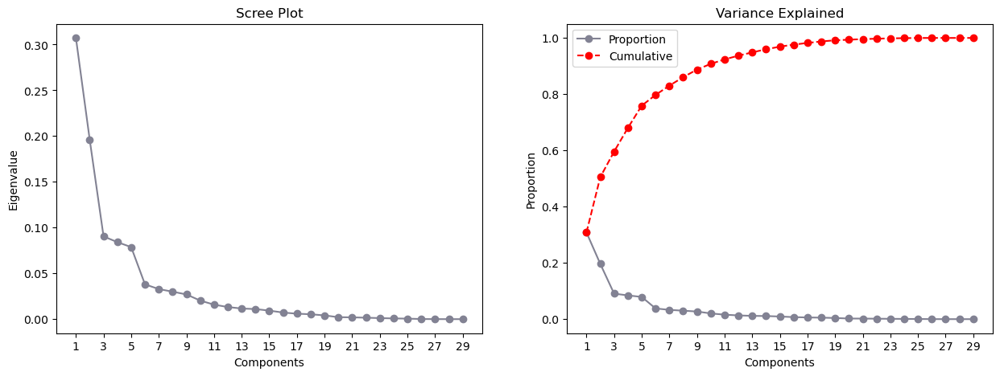

In [105]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15, 5))

# drawing plots
ax1.plot(pca.explained_variance_, marker = '.', markersize = 12, color = '#828293')
ax2.plot(pca.explained_variance_ratio_, marker = '.', markersize = 12, label = 'Proportion', color = '#828293')
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker = '.', markersize = 12, linestyle = '--',
         label = 'Cumulative', color = 'red')

# customizations
ax2.legend()
ax1.set_title('Scree Plot')
ax2.set_title('Variance Explained')
ax1.set_ylabel('Eigenvalue')
ax2.set_ylabel('Proportion')
ax1.set_xlabel('Components')
ax2.set_xlabel('Components')
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

Analysing the two plots, we conclude that the number of principal components to retain must be 6, keeping the the proportion of data variation on around 80%. 

So, we can perform PCA again with 6 principal components. We can also calculate the correlations of the principal components with the original features, as they are useful for understand the contribution of each feature to the PCs and how the PCs are related to the original features.

In [106]:
# creating an instance of the principal component analysis and fitting to the data we have and transforming it
pca = PCA(n_components = 6, random_state = 5)
pca_feat = pca.fit_transform(df_pca[metric_features])

# getting the names of the principal components
pca_feat_names = [f'PC{i}' for i in range(pca.n_components_)]

# converting the PCA to a dataframe
pca_df = pd.DataFrame(pca_feat, index = df_pca.index, columns = pca_feat_names)

# reassigning df_pca to contain the new created PCA variables
df_pca = pd.concat([df_pca, pca_df], axis = 1)
df_pca.head().T

,2,3,4,6,7
is_canceled,0,0,0,0,0
lead_time,0.019178,0.035616,0.038356,0.0,0.024658
arrival_date_year,0.0,0.0,0.0,0.0,0.0
arrival_date_month,0.545455,0.545455,0.545455,0.545455,0.545455
arrival_date_week_number,0.5,0.5,0.5,0.5,0.5
arrival_date_day_of_month,0.0,0.0,0.0,0.0,0.0
stays_in_weekend_nights,0.0,0.0,0.0,0.0,0.0
stays_in_week_nights,0.066667,0.066667,0.133333,0.133333,0.133333
adults,0.0,0.0,0.018519,0.018519,0.018519
children,0.0,0.0,0.0,0.0,0.0


In [107]:
def _color_red_or_green(val):
    """
    inputs:
    - val: numerical value to be checked for corrrelation strength

    function that colors the dataframe's background with either green or red depending on the value of the input parameter.
    this color is applied if there is a strong positive or negative correlation respectively
    """
    
    if val < -0.45:
        color = 'background-color: #f87c7a'
    elif val > 0.45:
        color = 'background-color: #86e4b8'
    else:
        color = ''
    return color

# we can obtain the loadings (the correlation between PCs and original features) and compare the metric features with the
# principal components that we have
loadings = df_pca.corr(numeric_only = True).loc[metric_features, pca_feat_names]
loadings.style.applymap(_color_red_or_green)

,PC0,PC1,PC2,PC3,PC4,PC5
lead_time,-0.139826,0.550757,0.083129,0.272167,0.508178,0.374009
arrival_date_year,0.710092,0.362975,-0.253345,0.471500,-0.175626,0.135389
arrival_date_week_number,-0.924490,-0.037063,-0.171761,0.162525,-0.040728,0.128301
arrival_date_day_of_month,-0.010479,-0.028024,-0.890573,-0.326523,0.311844,-0.001453
stays_in_weekend_nights,-0.125969,0.413567,0.170128,0.212493,0.643379,-0.309738
stays_in_week_nights,-0.144359,0.442210,0.198349,0.204079,0.655502,-0.247348
adults,-0.087653,0.148089,0.015275,0.023368,0.067692,-0.000323
children,-0.022964,0.134034,-0.045396,0.023131,-0.043709,-0.033641
babies,-0.028335,0.027873,0.003309,-0.005723,-0.001596,-0.027931
previous_cancellations,-0.036889,-0.024692,0.025510,-0.019511,0.017810,0.032586


The problem with principal component analysis is the interpretability, since we cannot understand how the principal components are contributing to separate the target classes.

<a id = "variable-selection"></a>

### 2.11. Variable Selection

- [2.11.1. Filter Methods](#filter-methods)
    - [2.11.1.1. Univariate Variables](#univariate-variables)
    - [2.11.1.2. Spearman Correlation](#spearman-correlation)
    - [2.11.1.3. ANOVA](#anova)
    - [2.11.1.4. Kendall's Rank Correlation Coefficient](#kendall-s)
    - [2.11.1.5. Chi-square for Categorical Data](#chi-square)
    - [2.11.1.6. Mutual Information for Categorical Data](#mutual-information)
    - [2.11.1.7. Visualize the Weight of the Dependent Variable in Categorical Data](#weight-dependent-variable)
- [2.11.2. Wrapper Methods](#wrapper-methods)
    - [2.11.2.1. RFE Method](#rfe-method)
- [2.11.3. Embedded Methods](#embedded-methods)
    - [2.11.3.1. Lasso Regression](#lasso-regression)
    - [2.11.3.2. Ridge Regression](#ridge-regression)
    - [2.11.3.3. Elastic Net](#elastic-net)
    - [2.11.3.4. Decision Tree](#feature-decision-tree)
    - [2.11.3.5. Boruta](#boruta)
    - [2.11.3.6. Random Forest](#feat-random-forest)
- [Final Insights](#final-insights)

[Back to Data Preparation](#preparation-index)

For some methods we are using in feature selection, we need to split the data in train and validation, so we will do the split and deal with the preprocessing problems after the split (using the functions defined before), like removing the outliers, filling the missing values, scaling the metric features and encoding the non-metric features. Data leakage occurs when information from the target variable (`is_canceled`) is unintentionally or inappropriately leaked into the predictor variables. In this case, including the `reservation_status` variable in the model would likely lead to data leakage because this variable directly reflects the outcome of interest, which is whether the booking was cancelled or not. If we included this variable in the analysis, the model would have access to information that is only available after the booking has been cancelled or not, meaning that the model would have access to future information that it should not have during the prediction process. Therefore, the model would have optimistic performance metrics, leading to an incorrect assessment of the model's effectiveness. Other variables can be considered as well with this justification, namely `assigned_room_type`, which is only known after the customer checks in (if the reservation is cancelled, this variable is equal to the `reserved_room_type`). Also, as stated before, the `country` variable, as well as the remaining variables that are constructed over this one, should not be used in the model, because they could provide information that is not fully true.

In [108]:
# creating an object named data that will contain the independent variables and another object named target that will contain the dependent variable/target, in this case 'IsCanceled'.

data = df.drop('is_canceled', axis = 1)
target = df.loc[:, 'is_canceled']

In [109]:
# creating the new features using the functions created before

data = new_features(data, continent_dict)
data = cyclical_encoding(data)
data = joining_categories(data, ['country', 'agent', 'company'])

In [110]:
# dropping the variables mentioned before

metric_features_todrop = ['days_between_last_status']
non_metric_features_todrop = ['country', 'assigned_room_type', 'reservation_status', 'continent']

data.drop(metric_features_todrop + non_metric_features_todrop + ['reservation_status_date', 'arrival_date', 'departure_date'], axis = 1, inplace = True)

upd_metric_features = list(set(metric_features) - set(metric_features_todrop))
upd_non_metric_features = list(set(non_metric_features) - set(non_metric_features_todrop))

In [111]:
# splitting our dataset into train (70%) and validation (30%)

feat_x_train, feat_x_val, feat_y_train, feat_y_val = train_test_split(data, target, test_size = 0.3, random_state = 5, stratify = target, shuffle = True)

In [112]:
# removing the outliers in the training dataset using the function created before

feat_x_train, feat_y_train, filter = x_y_manual_method(feat_x_train, feat_y_train)

In [113]:
# filling the missing values with the mode using the function created before

feat_x_train, feat_x_val = train_val_input_nan_central(feat_x_train, feat_x_val, upd_metric_features, upd_non_metric_features)

In [114]:
# dividing the training and the validation datasets into numerical and non numerical data

feat_x_train_num = feat_x_train.loc[:, upd_metric_features]
feat_x_train_nnum = feat_x_train.loc[:, upd_non_metric_features]

feat_x_val_num = feat_x_val.loc[:, upd_metric_features]
feat_x_val_nnum = feat_x_val.loc[:, upd_non_metric_features]

In [115]:
# scaling the data with the MinMax scaler using the function created before

scaler, feat_x_train_num_scaled, feat_x_val_num_scaled = train_val_minmax_scaler(feat_x_train_num, feat_x_val_num, upd_metric_features)

<a id = "filter-methods"></a>

### 2.11.1. Filter Methods

<a id = "univariate-variables"></a>

#### 2.11.1.1. Univariate Variables

If a feature is univariate (has 0 variance), we should drop it, since it does not provide any predictive capacity.

In [116]:
# calculating the variance of the numeric features

data.var(numeric_only = True)

lead_time                         8434.090721
arrival_date_year                    0.520217
arrival_date_month                   9.772607
arrival_date_week_number           189.897933
arrival_date_day_of_month           79.009156
stays_in_weekend_nights              1.353461
stays_in_week_nights                 6.187692
adults                               0.545849
children                             0.227927
babies                               0.016697
is_repeated_guest                    0.045439
previous_cancellations               0.133336
previous_bookings_not_canceled       1.177403
booking_changes                      0.574095
days_in_waiting_list                34.509135
adr                               4001.586306
required_car_parking_spaces          0.140770
total_of_special_requests            0.688830
number_holidays                      0.238422
temp                                19.888793
precip                              25.435087
wind_speed                        

So, in this case, there are no univariate features.

<a id = "spearman-correlation"></a>

#### 2.11.1.2. Spearman Correlation

The spearman correlation assesses how well the relationship between two variables can be described using a monotonic function, and it is equal to the pearson correlation between the rank values of those two variables.

First we need to create a new dataframe with all the training data, but containing also the dependent variable, so we can check if any of the independent variables are correlated with the target.

In [117]:
# creating a dataframe with the scaled metric features and the dependent variable

all_train_num = feat_x_train_num_scaled.join(feat_y_train)
all_train_num.head()

,total_of_special_requests,lead_time,cloud_cover,previous_cancellations,adults,stays_in_week_nights,arrival_date_month,arrival_date_year,booking_changes,wind_speed,...,total_nights,required_car_parking_spaces,adr_pp,all_children,stays_in_weekend_nights,previous_bookings_not_canceled,temp,babies,arrival_date_day_of_month,is_canceled
29351,0.0,0.060274,0.932599,0.0,0.018519,0.133333,0.818182,0.5,0.230769,0.694444,...,0.05,0.5,0.148944,0.0,0.000000,0.0,0.604455,0.0,0.800000,0
5479,0.4,0.430137,0.686753,0.0,0.018519,0.666667,0.272727,0.5,0.000000,0.261852,...,0.65,0.0,0.156631,0.0,0.666667,0.0,0.377112,0.0,0.933333,1
1256,0.4,0.087671,0.503647,0.0,0.018519,0.266667,0.636364,0.0,0.000000,0.411905,...,0.25,0.0,0.338061,0.0,0.333333,0.0,0.474984,0.0,0.666667,0
8112,0.0,0.668493,0.478604,0.0,0.018519,0.333333,0.727273,0.5,0.000000,0.509028,...,0.30,0.0,0.174036,0.0,0.333333,0.0,0.468894,0.0,0.333333,1
24413,0.0,0.013699,0.511512,0.0,0.018519,0.066667,0.363636,0.5,0.076923,0.077778,...,0.00,0.0,0.229474,0.0,0.000000,0.0,0.209677,0.0,0.600000,0


In [118]:
def corr_matrix(data, correlation):
    """ 
    inputs:
    - data: pandas DataFrame containing numerical data.
    - correlation: string indicating the type of correlation to be calculated. Valid options are 'pearson', 'kendall', or 'spearman'.    

    this function calculates the correlation matrix based on the chosen type.
    the correlation matrix is then plotted using a heatmap, and the values in the heatmap are annotated based on a threshold of |0.5|.
    """
    
    # preparing the figure
    fig = plt.figure(figsize = (10, 8))

    # obtaining the correlation matrix, each correlation is rounded to 2 decimal cases
    corr = data.corr(correlation, numeric_only = True).round(2)

    # building annotation matrix (values above |0.5| will appear annotated in the plot)
    mask_annot = np.absolute(corr.values) >= 0.5
    annot = np.where(mask_annot, corr.values, np.full(corr.shape, ''))
    
    # generate a mask for the upper triangle
    mask_upper = np.triu(np.ones_like(corr, dtype = bool))

    # plotting heatmap of the correlation matrix
    sns.heatmap(data = corr, annot = annot, cmap = 'RdBu', fmt = 's', vmin = -1, 
                vmax = 1, center = 0, square = True, linewidths = .5, annot_kws = {'size': 7}, mask = mask_upper)

    # layout
    fig.subplots_adjust(top = 0.95)
    fig.suptitle(correlation + ' correlation matrix')

    # showing the plot
    plt.show()

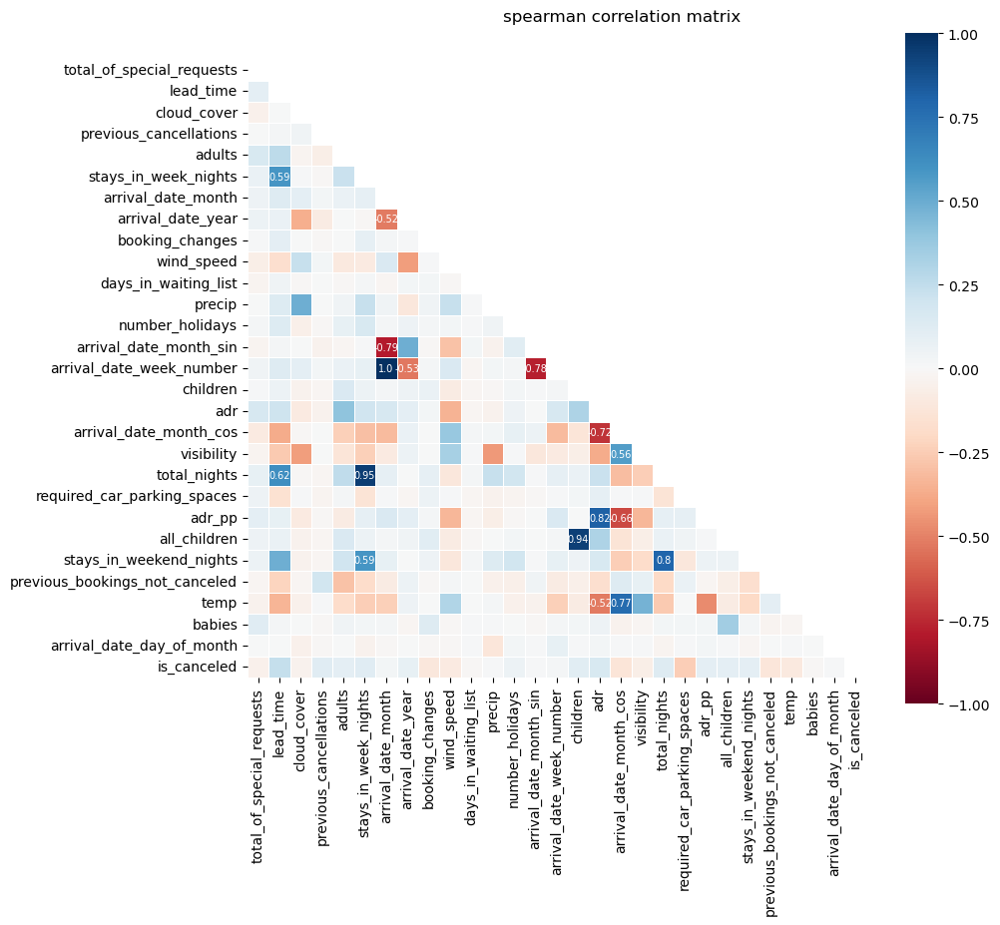

In [119]:
# correlation matrix for the metric features with the target variable

corr_matrix(all_train_num, 'spearman')

<a id = "anova"></a>

#### 2.11.1.3. ANOVA

ANOVA is a method that checks if the mean of two or more groups are significantly different from each other. The null-hypothesis is: the means of all groups are equal; and the alternative-hypothesis is: at least one mean of one group is different. So, if the mean of a metric feature regarding one category of the target is significantly different from the mean of the same metric feature regarding the other target category, we conclude that the feature has impact on the target, so we should keep it for the model training. And the other way around.

We want to use features that have the highest possible F-score and the lowest possible p-value (if the p-value is lower than the statistical significance, in this case we will consider 5%, we reject the null-hypothesis, meaning that we have statistical evidence that at least one mean of one group is different, which is good for the predictive capacity of our feature).

https://towardsdatascience.com/statistics-in-python-using-anova-for-feature-selection-b4dc876ef4f0
https://datascience.stackexchange.com/questions/74465/how-to-understand-anova-f-for-feature-selection-in-python-sklearn-selectkbest-w

In [120]:
# creating a SelectKBest instance to select features with best ANOVA F-Values
anova_selector = SelectKBest(score_func = f_classif, k = 'all')

# applying the selector to the features and target
anova_selector.fit(feat_x_train_num_scaled, feat_y_train)

SelectKBest(k='all')

In [121]:
# assigning the values to a dataframe

anova = pd.DataFrame(data = (anova_selector.scores_, anova_selector.pvalues_), columns = feat_x_train_num_scaled.columns, index = ['ANOVA F-statistic', 'ANOVA p-value'])
anova.T

,ANOVA F-statistic,ANOVA p-value
total_of_special_requests,64.692029,9.171912e-16
lead_time,927.175522,1.010955e-199
cloud_cover,28.469933,9.605548e-08
previous_cancellations,265.876944,1.921841e-59
adults,152.793329,5.475670e-35
stays_in_week_nights,241.341919,3.754578e-54
arrival_date_month,16.567780,4.709696e-05
arrival_date_year,145.934079,1.691122e-33
booking_changes,175.719461,5.824252e-40
wind_speed,185.403187,4.647527e-42


<a id = "kendall-s"></a>

#### 2.11.1.4. Kendall's Rank Correlation Coefficient

The strength of the association between two variables is known as the correlation test, and we can measure non-parametric correlation (non-linear dependences) with Kendall (tau), measuring how likely it is for two variables to move in the same direction, but not necessarily at a constant rate. The Kendall's rank correlation coefficient is the test statistic when we want to test if two variables are statistically dependent. This test is non-parametric, so we do not need to depend on the distributions of the variables. Under the null-hypothesis, we have independence of X and Y, so the distribution of tau has mean of 0. 

https://www.phdata.io/blog/data-science-stats-review/

In [122]:
# calculating Kendall correlation

kendall_tau_list = []
kendall_p_list = []
for feature in feat_x_train_num_scaled:
    tau, p_value = kendalltau(feat_x_train_num_scaled[feature], feat_y_train)
    kendall_tau_list.append(tau)
    kendall_p_list.append(p_value)

In [123]:
# assigning the values to a dataframe

kendall = pd.DataFrame(data = (kendall_tau_list, kendall_p_list), columns = feat_x_train_num_scaled.columns, index = ['Kendall coefficient', 'Kendall p-value'])
kendall.T

,Kendall coefficient,Kendall p-value
total_of_special_requests,-0.049949,1.034931e-15
lead_time,0.200307,8.153072e-302
cloud_cover,-0.031031,6.915053e-09
previous_cancellations,0.124242,3.902239e-80
adults,0.093609,1.061350e-47
stays_in_week_nights,0.107335,1.066868e-77
arrival_date_month,0.021568,1.140196e-04
arrival_date_year,0.075678,5.330323e-34
booking_changes,-0.105565,4.368884e-61
wind_speed,-0.075389,5.699567e-45


<a id = "chi-square"></a>

#### 2.11.1.5. Chi-square for Categorical Data

We can check the importance of the non metric independent variables in the target. So, we will define a function that will follow the steps of chi-square to check if a independent variable is an important predictor.

In [124]:
def TestIndependence(x, y, variable, alpha = 0.05):
    """
    inputs:
    - x: one categorical independent variable in the form of pandas Series.
    - y: one categorical dependent variable in the form of pandas Series.
    - variable: string representing the variable being tested for independence.
    - alpha: float value representing the significance level. Default value is 0.05.
    
    function to perform the chi-square test of independence on the contingency table of x and y
    returns a string indicator whether the variable is important or not based on a given significance level
    """
    
    # firstly we compute a simple cross tabulation
    dfObserved = pd.crosstab(y, x)
    
    # then we perform the chi-square test of independence of the variables in the contingency table
    # we get the test statistic, the p-value of the test, the degrees of fredoom and the expected frequencies
    chi2, p, dof, expected = chi2_contingency(dfObserved.values)
    
    # then we transform the expected frequencies, based on the marginal sums of the table, into a pandas dataframe
    dfExpected = pd.DataFrame(expected, columns = dfObserved.columns, index = dfObserved.index)
    
    # and we make the decision of either the variable is helpful or not
    if p < alpha:
        result = "{0} is IMPORTANT for prediction".format(variable)
    else:
        result = "{0} is NOT an important predictor. (Discard {0} from model)".format(variable)
        
    print(result)

In [125]:
# performing the chi-square test for each independent categorical variable

for variable in feat_x_train_nnum:
    TestIndependence(feat_x_train_nnum.loc[:, variable], feat_y_train, variable)

market_segment is IMPORTANT for prediction
customer_type is IMPORTANT for prediction
company is IMPORTANT for prediction
is_repeated_guest is IMPORTANT for prediction
reserved_room_type is IMPORTANT for prediction
meal is IMPORTANT for prediction
deposit_type is IMPORTANT for prediction
weekend_or_weekday is IMPORTANT for prediction
agent is IMPORTANT for prediction
distribution_channel is IMPORTANT for prediction


According to chi-square, no variable is discarded for the final model.

<a id = "mutual-information"></a>

#### 2.11.1.6. Mutual Information for Categorical Data

Mutual information measures the entropy drops under the condition of the target value (https://towardsdatascience.com/select-features-for-machine-learning-model-with-mutual-information-534fe387d5c8). The higher the value of mutual information, the better, because it means that the relationship between that certain feature and the target is close. Mutual information is equal to zero if and only if two random variables are independent, and higher values mean higher dependency.

$$ MI(feature;target) = Entropy(feature) - Entropy(feature|target) $$

The problem with mutual information is that mutual information is not a metric and is not normalized, so it is difficult to compare it in different datasets, etc.

In [126]:
def plot_importance(coef, name):
    """
    inputs:
    - coef: pandas Series of coefficients obtained from a linear regression model.
    - name: string representing the name of the linear regression model.
    
    function to plot an horizontal bar chart showing the feature importance of the coeficcients in descending order
    """
    
    # sorting the values of the coefficients given by the lasso regression
    imp_coef = coef.sort_values()
    
    # ploting the figures
    fig, ax = plt.subplots()
    imp_coef.plot(kind = 'barh', color = 'red', ax = ax)
    ax.set_title('Feature importance using ' + name + ' model')
    ax.tick_params(axis = 'y', which = 'major', labelsize = 7)
    ax.grid(True)

    plt.show()

Since this algorithm uses distances ("The function relies on nonparametric methods based on entropy estimation from k-nearest neighbors distances as described in [2] and [3]", *scikit-learn* https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_classif.html) we cannot use ordinal encoding to all non-metric variables, so we have to properly encode them.

In [166]:
# encoding properly the non-metric features

feat_x_train_nnum_encoded, feat_encoded = ohc(feat_x_train_nnum, upd_non_metric_features)
feat_x_train_nnum_encoded = feat_x_train_nnum_encoded[feat_encoded]

feat_x_val_nnum_encoded, feat_encoded = ohc(feat_x_val_nnum, upd_non_metric_features)
feat_x_val_nnum_encoded = feat_x_val_nnum_encoded[feat_encoded]

feat_x_train_nnum_encoded.head()

,ohc_market_segment_Corporate,ohc_market_segment_Direct,ohc_market_segment_Groups,ohc_market_segment_Offline TA/TO,ohc_market_segment_Online TA,ohc_customer_type_Group,ohc_customer_type_Transient,ohc_customer_type_Transient-Party,ohc_company_223.0,ohc_company_281.0,...,ohc_deposit_type_Refundable,ohc_weekend_or_weekday_Just Weekday,ohc_weekend_or_weekday_Just Weekend,ohc_agent_241.0,ohc_agent_250.0,ohc_agent_40.0,ohc_agent_not applicable,ohc_agent_others,ohc_distribution_channel_Direct,ohc_distribution_channel_TA/TO
29351,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
5479,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1256,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8112,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
24413,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


In [128]:
# computing mutual information scores for all the non metric features, encoded with ordinal encoder
mi_score = mutual_info_classif(feat_x_train_nnum_encoded[feat_encoded], feat_y_train, random_state = 5, discrete_features = True)

# assigning the coefficients to the features in a pandas series
mi_coef = pd.Series(mi_score, index = feat_x_train_nnum_encoded[feat_encoded].columns)
mi_coef.sort_values(ascending = False)

ohc_market_segment_Online TA           0.029977
ohc_agent_not applicable               0.011834
ohc_distribution_channel_TA/TO         0.011831
ohc_market_segment_Offline TA/TO       0.010602
ohc_customer_type_Transient            0.009669
ohc_distribution_channel_Direct        0.007454
ohc_market_segment_Direct              0.007368
ohc_is_repeated_guest_1                0.007009
ohc_company_not applicable             0.005161
ohc_customer_type_Transient-Party      0.005030
ohc_agent_others                       0.004787
ohc_deposit_type_Non Refund            0.004101
ohc_weekend_or_weekday_Just Weekday    0.003895
ohc_reserved_room_type_G               0.003287
ohc_market_segment_Corporate           0.002701
ohc_agent_40.0                         0.002648
ohc_company_others                     0.002575
ohc_agent_241.0                        0.002022
ohc_weekend_or_weekday_Just Weekend    0.001931
ohc_company_223.0                      0.001918
ohc_reserved_room_type_H               0

In [129]:
print('Mutual Information picked ' + str(sum(mi_coef != 0)) + ' variables and eliminated the other ' +  str(sum(mi_coef == 0)) + ' variables')

Mutual Information picked 37 variables and eliminated the other 0 variables


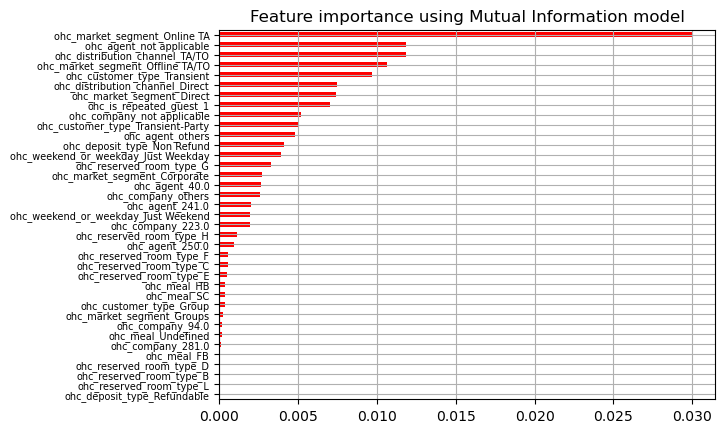

In [130]:
# applying our function

plot_importance(mi_coef, 'Mutual Information')

According to Mutual Information, we should not discard any variables, since none of them have mutual information of 0 (it would mean that they were independent of the target). However, most of the features have mutual information coefficient very close to 0. We can filter the coefficients and plot only the features that have a mutual information coefficient lower than a certain threshold for better interpretation.

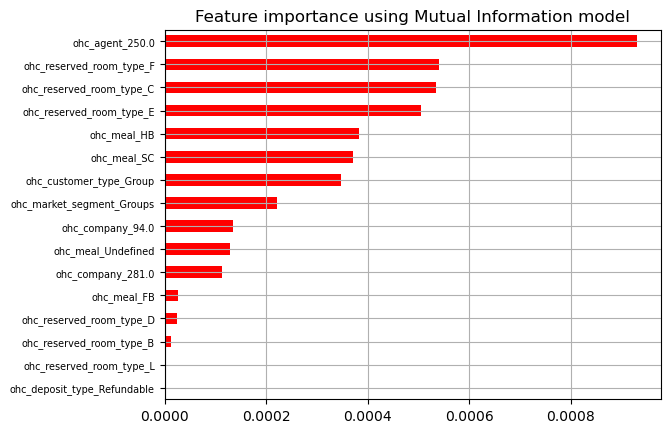

In [131]:
plot_importance(mi_coef[mi_coef < 1e-3], 'Mutual Information')

<a id = "weight-dependent-variable"></a>

#### 2.11.1.7. Visualize the Weight of the Dependent Variable in Categorical Data

We can create two plots to check the weight that the dependent variable has in the different labels of a categorical variable, for example the weight that `is_canceled` has in the different `months` categories. The first plot will represent the frequency of each value of the dependent variable in the different categories, and the second plot will make this representation more intuitive by checking the proportion of the presence of each label of the dependent variable in each category.

In [132]:
def bar_charts_categorical(data, feature, target):
    """
    inputs:
    - data: pandas DataFrame with the categorical and target features.
    - feature: string representing the name of the categorical feature to be analysed.
    - target: string representing the name of the target feature for which the frequency and porportion will be analysed.
    
    function to generate two bar charts that show the frequency and proportion of the target feature for each category in the categorical feature
    """
    
    # we are doing cross tabulation between the specific cathegorical variable and the target
    cont_tab = pd.crosstab(data[feature], df[target], margins = True)
    categories = cont_tab.index[: -1]
     
    # start of visualization
    fig = plt.figure(figsize = (15, 5))
    
    plt.subplot(121)
    p1 = plt.bar(categories, cont_tab.iloc[:-1, 0].values, 0.55, color = '#8d99ae')
    p2 = plt.bar(categories, cont_tab.iloc[:-1, 1].values, 0.55, bottom = cont_tab.iloc[:-1, 0], color = 'red') 
    plt.legend((p2[0], p1[0]), ('Cancelled', 'Did not Cancelled'))
    plt.title('Frequency bar chart')
    plt.xlabel(feature)
    plt.ylabel('$Frequency$')
    plt.xticks(rotation = 'vertical')

    # auxiliary data for 122
    obs_pct = np.array([np.divide(cont_tab.iloc[:-1, 0].values, cont_tab.iloc[:-1, 2].values), 
                        np.divide(cont_tab.iloc[:-1, 1].values, cont_tab.iloc[:-1, 2].values)])
      
    plt.subplot(122)
    p1 = plt.bar(categories, obs_pct[0], 0.55, color = '#8d99ae')
    p2 = plt.bar(categories, obs_pct[1], 0.55, bottom = obs_pct[0], color = 'red')
    plt.legend((p2[0], p1[0]), ('Cancelled', 'Did not Cancelled'))
    plt.title('Proportion bar chart')
    plt.xlabel(feature)
    plt.ylabel('$Proportion$')
    plt.xticks(rotation = 'vertical')

    plt.show()

In [133]:
# creating a dataframe with the non-metric features and the dependent variable

all_train_nnum = feat_x_train_nnum.iloc[:, :].join(feat_y_train)
all_train_nnum.head()

,market_segment,customer_type,company,is_repeated_guest,reserved_room_type,meal,deposit_type,weekend_or_weekday,agent,distribution_channel,is_canceled
29351,Direct,Transient,not applicable,0,D,BB,No Deposit,Just Weekday,250.0,Direct,0
5479,Online TA,Transient,not applicable,0,E,BB,No Deposit,Both Weekday and Weekend,240.0,TA/TO,1
1256,Online TA,Transient,not applicable,0,A,BB,No Deposit,Both Weekday and Weekend,240.0,TA/TO,0
8112,Online TA,Transient,not applicable,0,D,BB,No Deposit,Both Weekday and Weekend,240.0,TA/TO,1
24413,Direct,Transient,not applicable,0,F,BB,No Deposit,Just Weekday,250.0,Direct,0


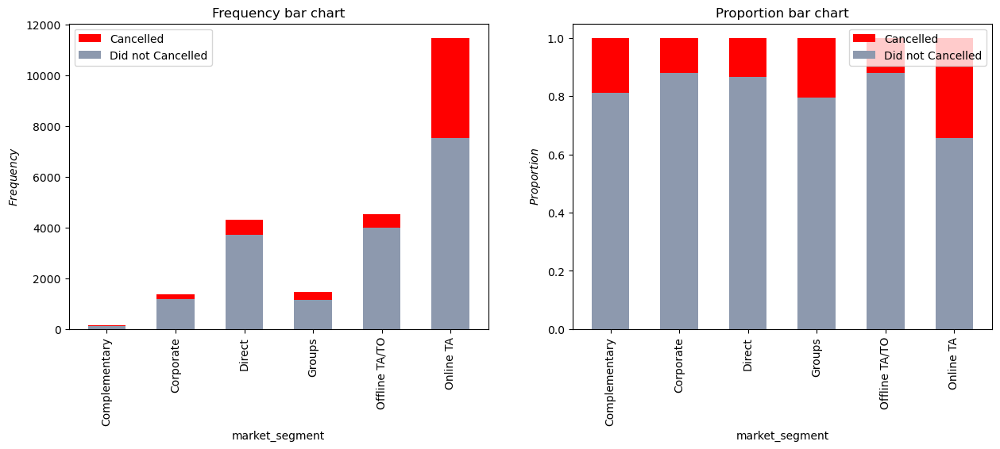

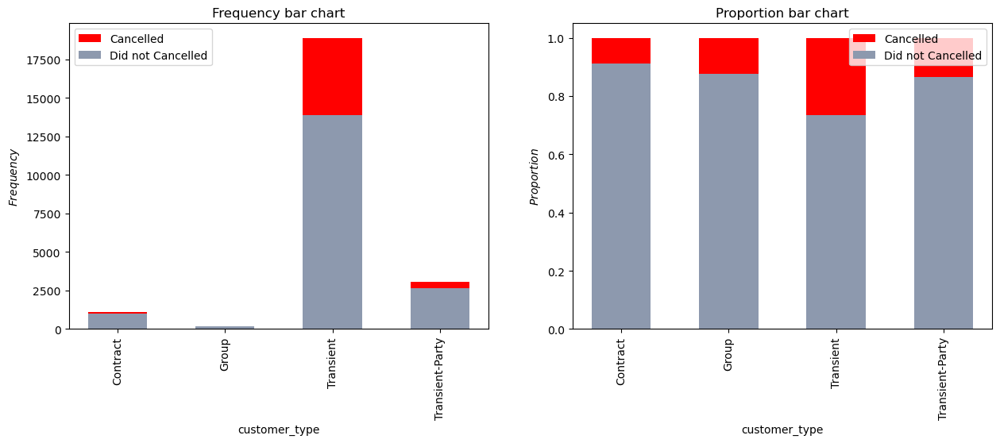

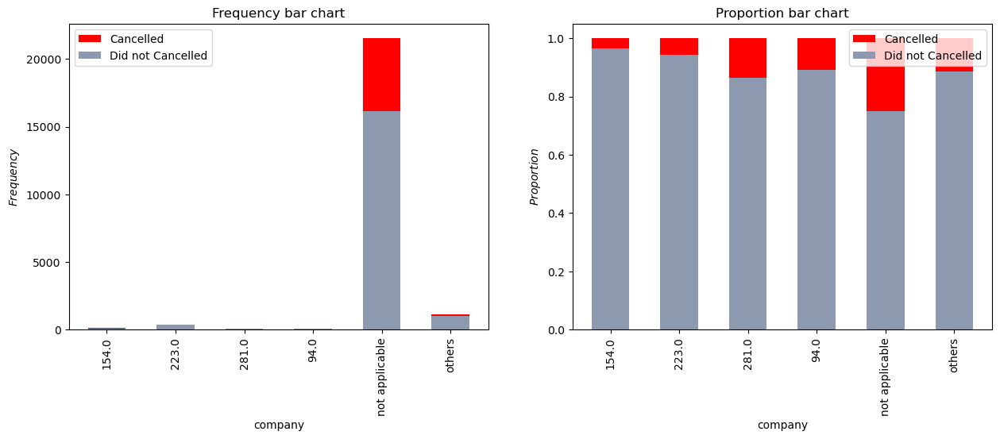

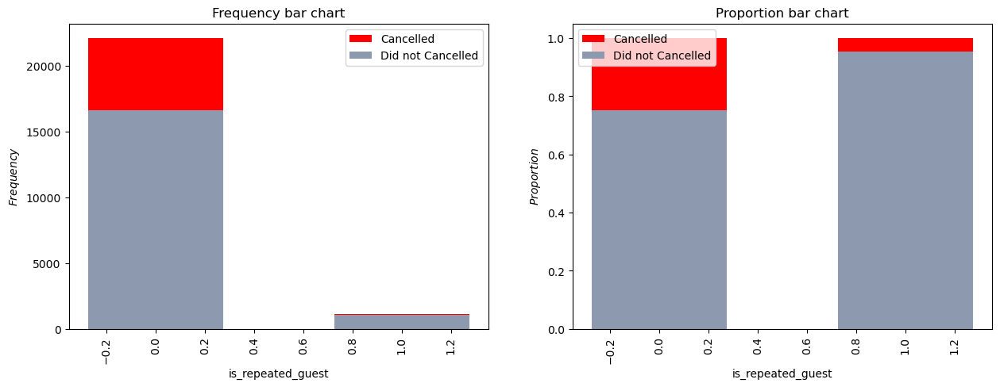

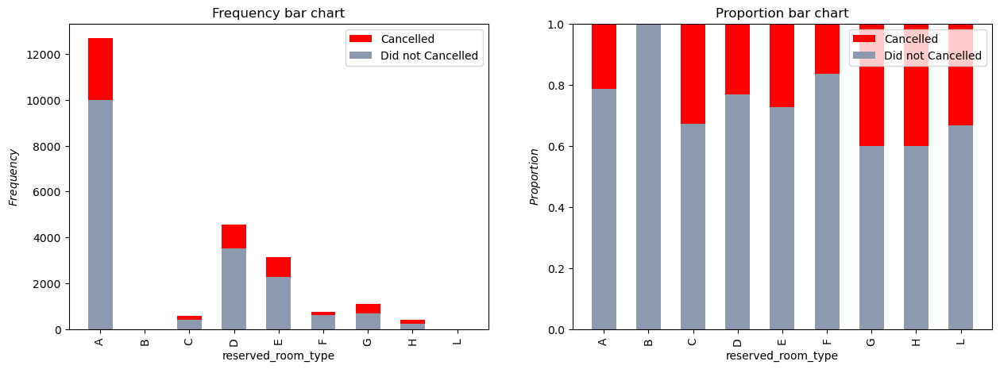

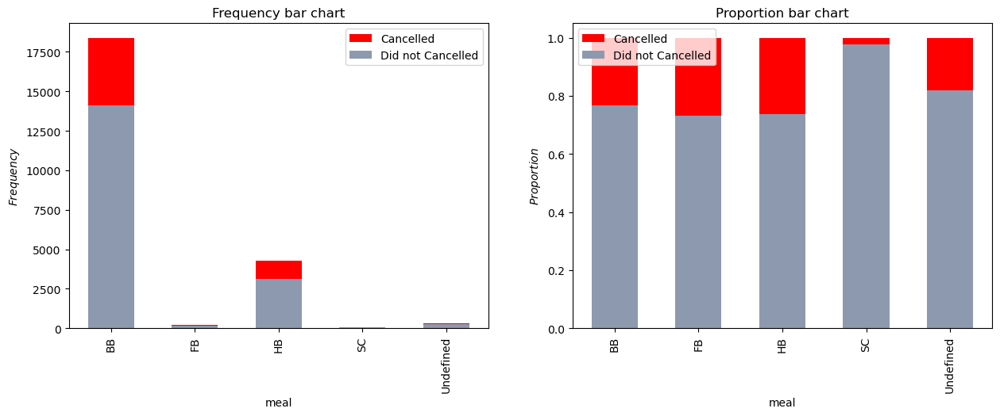

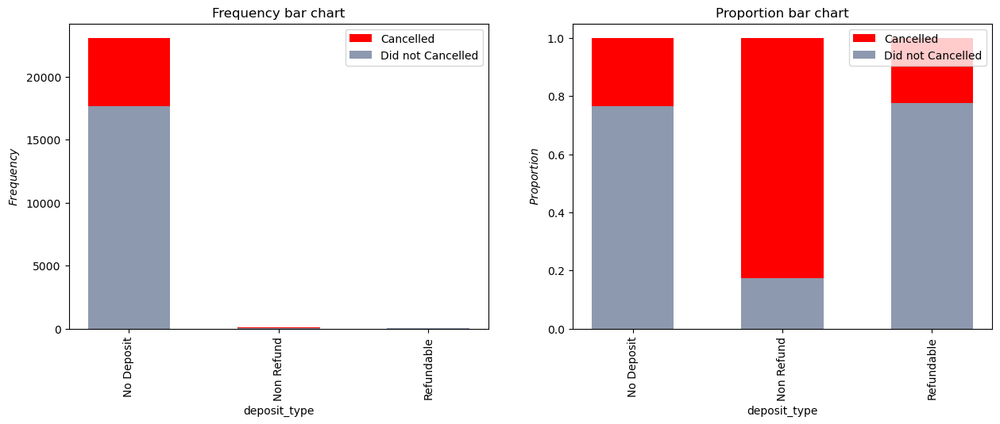

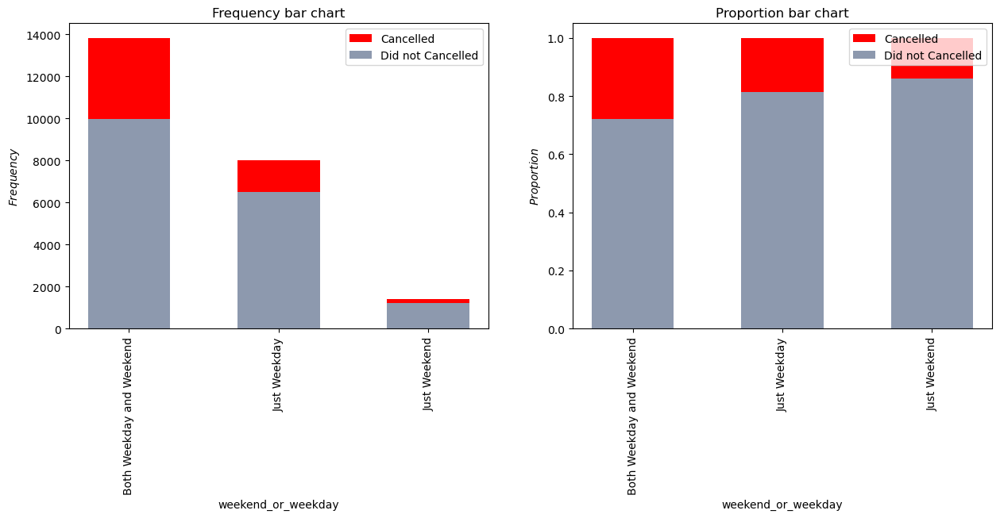

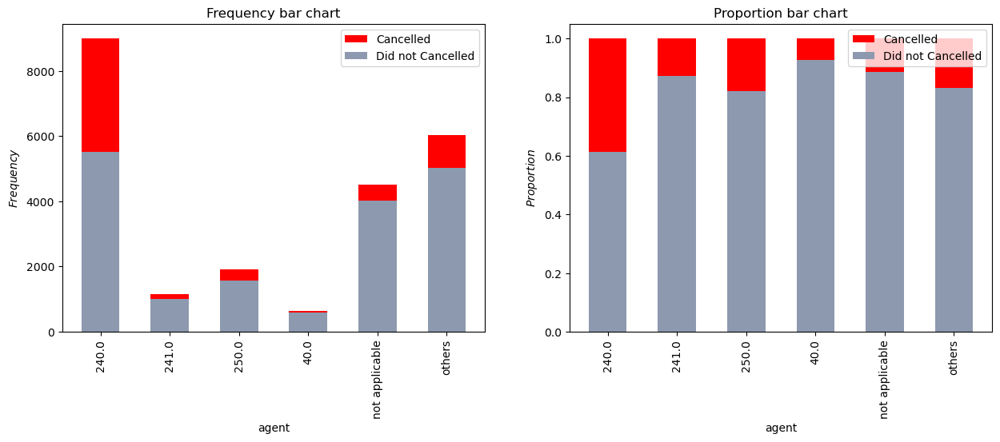

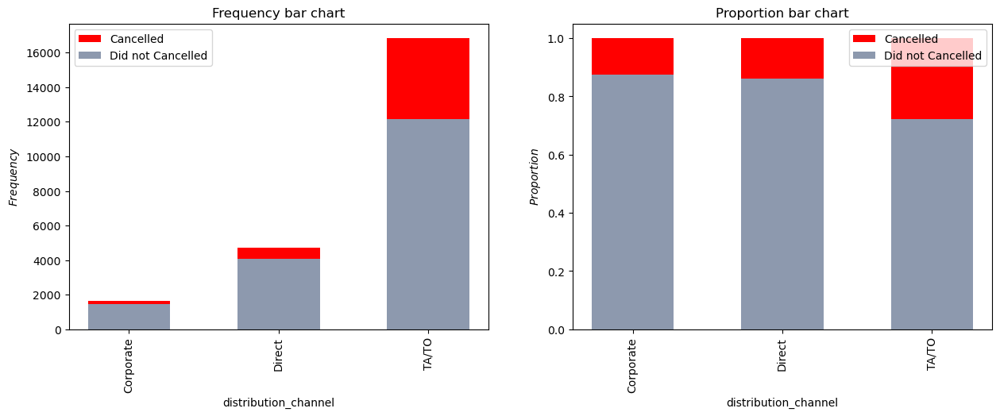

In [134]:
# applying the function

for feature in upd_non_metric_features:
    bar_charts_categorical(all_train_nnum, feature, 'is_canceled')

Using this method, we can see the proportion of cancellations in each category of the non-metric features. So, for each variable we can see:
- We see that customers that come to the hotel through travel agency number 9 have a higher proportion of cancelled reservations than the rest of the agencies. This category should be monitored, since, as stated in the description of this project, online travel agencies are the main ones responsible for the current cancellations in hotels, so we can assume that Agent number 9 is one of those OTAs.
- No significant differences in the distribution of cancellations can be seen for the categories of the variable `PrecipitationBin`.
- The same happens for the variable `WeekendOrWeekday`.
- Regarding the `MarketSegment` variable, we can see that when the segment designation is not defined, all reservations were cancelled. So, this should be captured by the model and addressed as a problem.
- For the `DistributionChannel` variable, we have the same pattern as for the `MarketSegment` variable, where the ‘undefined’ category means that the reservation is going to be cancelled.
- We can see the differences between the different types of deposits: when the customers deposit the value of the total stay cost, they are more likely to cancel the reservation. The same happens when the customers deposit with a value under the total cost of the stay. When no deposit is made, the customers are less likely to cancel the reservation. In this explanation, strange behaviours can be found since we would expect that guests with no deposit would cancel more, as they do not lose anything. The explanation is that the categories are not well defined, as stated before, which can cause problems in interpretation, but this variable can be important to predict the target variable because the bias is happening in the same direction for all observations.
- For `WindSpeedAvgBin`, we do not notice a significant difference between the target categories.
- We do not have a specific type of meal booked that has a significantly larger proportion of cancellations, so maybe `Meal` is not an important variable to predict the target.
- Customers that do not come through any company (no company made the booking or is responsible for paying) are more likely to cancel the reservations.
- No significant differences can be seen for the categories of the variable `CustomerType`.
- The same happens for `TemperatureAvgBin`.
- As we can see, we do not have a specific type of reserved room that has a significantly higher proportion of bookings with cancellations, so maybe `ReservedRoomType` is not an important variable to predict the target.
- Guests that already came to the hotel are less likely to cancel the reservation, but the difference is not significant.

<a id = "wrapper-methods"></a>

### 2.11.2. Wrapper Methods

<a id = "rfe-method"></a>

#### 2.11.2.1. RFE method

We don't know *apriori* the number of features to select, so we will use RFE (Recursive Feature Elimination) that will allow us to select the most important features to keep. We will create a loop to check the score of the estimator using a different number of features.

Given an external estimator that assigns weights to features (in this case we will use a logistic regression), the goal of recursive feature elimination is to select features by recursively considering smaller and smaller sets of features. First the model is trained with all the features available and then, by importance of the features, they are successively dropped until the desired number of features is reached.

In [135]:
def number_features(model):
    """
    inputs:
    - model: machine learning model instance used for feature selection.
    
    function to perform feature selection using Recursive Feature Elimination (RFE) and determine the optimum number of features based on the F1-score
    """
    
    # number of features (we will try from using 1 feature to using all the features)
    nof_list = list(range(1, 28))
    high_score = 0

    # variable to store the optimum features
    nof = 0           
    recall_list = []

    for n in nof_list:

        # creating a RFE instance in which the estimator is our model passed to the function
        rfe = RFE(model, n_features_to_select = n).fit(feat_x_train_num_scaled, feat_y_train)

        # first we select the most important features and we got the most important features to keep in the model
        feat_x_train_rfe = rfe.transform(feat_x_train_num_scaled)
        feat_x_val_rfe = rfe.transform(feat_x_val_num_scaled)

        # then, knowing the features to keep, we apply the model with the desired variables
        model.fit(feat_x_train_rfe, feat_y_train)
        
        # getting the values that the model predicted for the validation dataset
        feat_y_val_pred = model.predict(feat_x_val_rfe)
        
        # calculating the f1 score for the model and storing it in the list
        value = recall_score(feat_y_val, feat_y_val_pred)
        recall_list.append(value)
        
        # and we want to keep track of what is the model with the highest score, because that is the perfect number of features
        if(value > high_score):
            high_score = value
            nof = nof_list[n]

    print('Optimum number of features: %d' % nof)
    print('Recall with %d features: %f' % (nof, high_score))

In [136]:
def select_features(number_features, model):
    """
    inputs:
    - number_features: number of features to select.
    - model: machine learning model instance used for feature selection.
    
    function to perform feature selection using Recursive Feature Elimination (RFE) with the specified number of features.
    """
    
    # creating a RFE instance with number of features, since we aleady know that is the ideal number of features (previous func)
    rfe = RFE(estimator = model, n_features_to_select = number_features).fit(X = feat_x_train_num_scaled, y = feat_y_train)

    # then, we transform the data using RFE by applying the method fit_transform()
    feat_x_rfe = rfe.transform(feat_x_train_num_scaled)

    # we can see the variables that were selected by RFE as the most "important" ones by calling the attribute support_ 
    # and the feature ranking by calling the attribute ranking_
    selected_features = pd.DataFrame(np.concatenate((rfe.ranking_.reshape(-1, 1), rfe.support_.reshape(-1, 1)), axis = 1), 
                                     columns = ['Ranking', 'Selected'], index = feat_x_train_num_scaled.columns)
    return selected_features

In [137]:
# creating a logistic regression classifier instance
lr = LogisticRegression(random_state = 5)

# calling the defined function to see what is the best number of features to keep
number_features(lr)

Optimum number of features: 27
Recall with 27 features: 0.235663


In [138]:
# since we know the optimum number of features to keep is 14, we call the defined function to know what are the more important

select_features(27, lr)

,Ranking,Selected
total_of_special_requests,1,1
lead_time,1,1
cloud_cover,1,1
previous_cancellations,1,1
adults,1,1
stays_in_week_nights,1,1
arrival_date_month,1,1
arrival_date_year,1,1
booking_changes,1,1
wind_speed,1,1


In [139]:
# creating a decision tree classifier instance
dt = DecisionTreeClassifier(random_state = 5)

# calling the defined function to see what is the best number of features to keep
number_features(dt)

Optimum number of features: 22
Recall with 22 features: 0.511511


In [140]:
# since we know the optimum number of features to keep is 25, we call the defined function to know what are the more important

select_features(27, dt)

,Ranking,Selected
total_of_special_requests,1,1
lead_time,1,1
cloud_cover,1,1
previous_cancellations,1,1
adults,1,1
stays_in_week_nights,1,1
arrival_date_month,1,1
arrival_date_year,1,1
booking_changes,1,1
wind_speed,1,1


According to RFE, for a decision tree, the numerical variable that we should discard for the final model is `Babies`.

<a id = "embedded-methods"></a>

### 2.11.3. Embedded Methods

<a id = "lasso-regression"></a>

#### 2.11.3.1. Lasso Regression

The idea of using Lasso regression for feature selection purposes is: we fit a Lasso regression on a scaled version of our dataset and we consider only those features that have a coefficient different from 0. By trying to minimize the cost function, Lasso regression will automatically select those features that are useful, discarding the useless or redundant features (assigning their coefficients to 0).

In [141]:
# creating a lasso regression instance
lasso_reg = LassoCV(random_state = 5)

# fitting the data to reg
lasso_reg.fit(feat_x_train_num_scaled, feat_y_train)

# assigning the coefficients to the features in a pandas series
lasso_coef = pd.Series(lasso_reg.coef_, index = feat_x_train_num_scaled.columns)
lasso_coef

total_of_special_requests        -0.208159
lead_time                         0.297258
cloud_cover                       0.039127
previous_cancellations            1.652552
adults                            1.258519
stays_in_week_nights             -0.008328
arrival_date_month                0.122928
arrival_date_year                 0.064838
booking_changes                  -0.720741
wind_speed                       -0.014402
days_in_waiting_list             -0.260583
precip                           -0.027949
number_holidays                   0.090375
arrival_date_month_sin            0.017578
arrival_date_week_number         -0.096536
children                          0.198809
adr                               0.429965
arrival_date_month_cos            0.081516
visibility                        0.039256
total_nights                     -0.048592
required_car_parking_spaces      -0.519073
adr_pp                            0.252304
all_children                      0.029655
stays_in_we

In [142]:
print('Lasso picked ' + str(sum(lasso_coef != 0)) + ' variables and eliminated the other ' +  str(sum(lasso_coef == 0)) + ' variables')

Lasso picked 27 variables and eliminated the other 1 variables


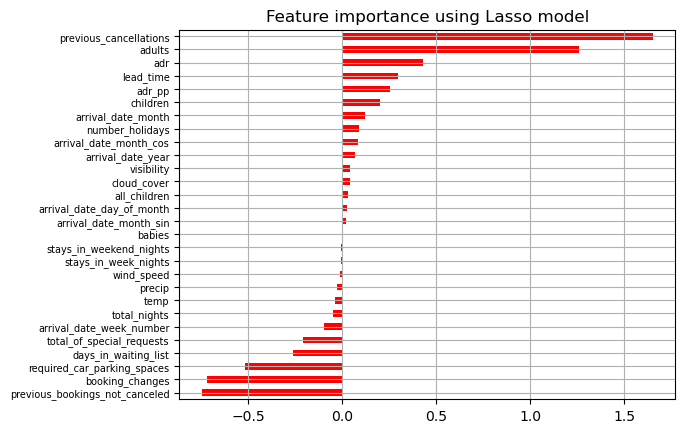

In [143]:
# calling the function to plot the importance of the features

plot_importance(lasso_coef, 'Lasso')

<a id = "ridge-regression"></a>

#### 2.11.3.2. Ridge Regression

Ridge regression is a method to estimate the coefficient of multiple regression models. Both Lasso and Ridge regression work by penalizing the magnitude of coefficients of features along with minimizing the error between predictions and actual values or records, the biggest difference is that Lasso can reduce the coefficient of a feature to zero (elliminating it), while Ridge cannot. So, we find that Ridge regression performs better when the data consists of features which are sure to be more relevant and useful.
https://analyticsindiamag.com/a-hands-on-guide-to-ridge-regression-for-feature-selection/

In [144]:
# creating a ridge regression instance
ridge_reg = Ridge(random_state = 5)

# fitting the data to reg
ridge_reg.fit(feat_x_train_num_scaled, feat_y_train)

# assigning the coefficients to the features in a pandas series
ridge_coef = pd.Series(ridge_reg.coef_, index = feat_x_train_num_scaled.columns)
ridge_coef

total_of_special_requests        -0.208775
lead_time                         0.299631
cloud_cover                       0.042529
previous_cancellations            1.595949
adults                            1.088013
stays_in_week_nights             -0.028896
arrival_date_month                0.375020
arrival_date_year                 0.060477
booking_changes                  -0.719056
wind_speed                       -0.016756
days_in_waiting_list             -0.274691
precip                           -0.029785
number_holidays                   0.091483
arrival_date_month_sin            0.016377
arrival_date_week_number         -0.371916
children                          0.127541
adr                               0.444701
arrival_date_month_cos            0.084527
visibility                        0.042993
total_nights                     -0.025000
required_car_parking_spaces      -0.519167
adr_pp                            0.239016
all_children                      0.097781
stays_in_we

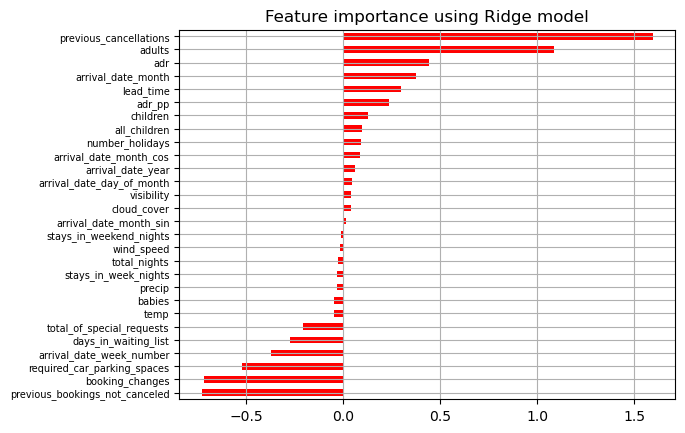

In [145]:
# calling the function to plot the importance of the features

plot_importance(ridge_coef, 'Ridge')

<a id = "elastic-net"></a>

#### 2.11.3.3. Elastic Net

Ridge regression added a term in ordinary least square error function that regularizes the value of coefficients of variables (L2), and Lasso regression is similar to Ridge regression except we add mean absolute value of coefficients in place of mean square value (L1). While in elastic net regularization we added the both terms of L1 and L2 to get the final loss function. We will use also elastic net, since it performs better than Ridge and Lasso Regression for most of the test cases. https://www.geeksforgeeks.org/implementation-of-lasso-ridge-and-elastic-net/
https://analyticsindiamag.com/hands-on-tutorial-on-elasticnet-regression/

In [146]:
# creating an elastic net instance
e_net = ElasticNet(alpha = 0.1, l1_ratio = 0.3, random_state = 5)

# fitting the data to the net
e_net.fit(feat_x_train_num_scaled, feat_y_train)

# assigning the coefficients to the features in a pandas series
enet_coef = pd.Series(e_net.coef_, index = feat_x_train_num_scaled.columns)
enet_coef

total_of_special_requests        -0.0
lead_time                         0.0
cloud_cover                      -0.0
previous_cancellations            0.0
adults                            0.0
stays_in_week_nights              0.0
arrival_date_month                0.0
arrival_date_year                 0.0
booking_changes                  -0.0
wind_speed                       -0.0
days_in_waiting_list             -0.0
precip                           -0.0
number_holidays                   0.0
arrival_date_month_sin           -0.0
arrival_date_week_number          0.0
children                          0.0
adr                               0.0
arrival_date_month_cos           -0.0
visibility                       -0.0
total_nights                      0.0
required_car_parking_spaces      -0.0
adr_pp                            0.0
all_children                      0.0
stays_in_weekend_nights           0.0
previous_bookings_not_canceled   -0.0
temp                             -0.0
babies      

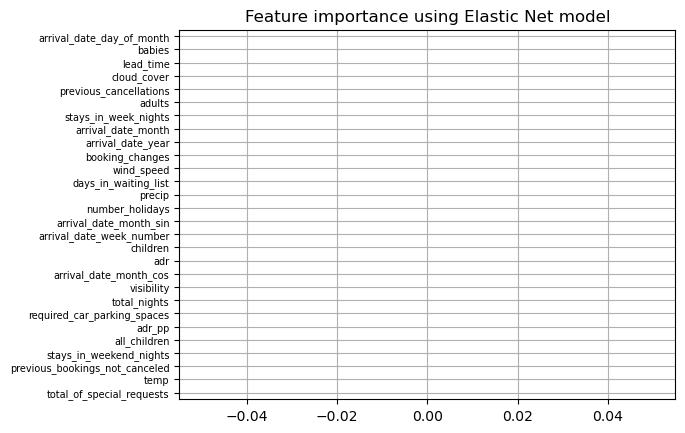

In [147]:
# calling the function to plot the importance of the features

plot_importance(enet_coef, 'Elastic Net')

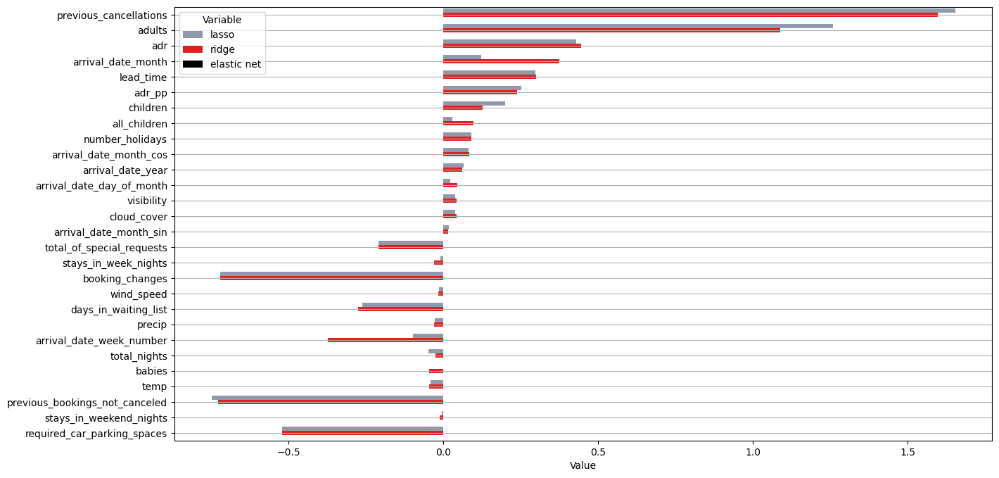

In [148]:
# plotting the results of these three embedded methods together

zippy = pd.DataFrame(zip(lasso_coef, ridge_coef, enet_coef), columns = ['lasso', 'ridge', 'elastic net'])
zippy['col'] = feat_x_train_num_scaled.columns
tidy = zippy.melt(id_vars = 'col').rename(columns = str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize = (15, 8))
plot = sns.barplot(y = 'Col', x = 'Value', hue = 'Variable', data = tidy, palette = ['#8d99ae', 'red', '#000000'])

# adding grid
plot.grid(True, axis = 'y')
plot.set(ylabel = None)
plt.show()

<a id = "feature-decision-tree"></a>

#### 2.11.3.4. Decision Tree

Decision trees can be used to calculate the feature importance. We have 2 methods of calculating it: **entropy** (the information gain is the decrease in entropy after the dataset is split on a feature) and **gini** (calculated as the decrease in node impurity weighted by the probability of reaching that node).

In [149]:
def oe(data, nmf):
    """
    inputs:
    - data: input DataFrame containing the data to be encoded.
    - nmf: list of non-metric features to be encoded
    
    function to perform ordinal encoding on selected non-metric features using the specified categories
    """
    
    # defining the categories we want to use (in case we want to use this function to encode only some of the non metric features)
    ordinal_categories = [list(df_demo[feature].value_counts().index) for feature in nmf]
            
    # defining an instance of OrdinalEncoder
    encoder = OrdinalEncoder(categories = ordinal_categories)
    
    # encoding our variables
    oe_df = pd.DataFrame(encoder.fit_transform(data.loc[:, nmf]), columns = nmf, index = data.index)
    
    # reassigning df to contain the oe variables
    df_oe = pd.concat([data.drop(columns = nmf), oe_df], axis = 1)
    
    return df_oe

In [150]:
def train_val_oe(data_train, data_val, nmf):
    """
    inputs:
    - data_train: pandas DataFrame containing the training dataset to be encoded.
    - data_val: pandas DataFrame containing the validation dataset to be encoded.
    - nmf: list of non-metric features to be encoded
    
    function to perform ordinal encoding on selected non-metric features using the specified categories
    """

    # concatenating the two datasets to encode
    data = pd.concat([data_train, data_val])
    
    # defining the categories we want to use (in case we want to use this function to encode only some of the non metric features)
    ordinal_categories = [list(df_demo[feature].value_counts().index) for feature in nmf]
            
    # defining an instance of OrdinalEncoder
    encoder = OrdinalEncoder(categories = ordinal_categories)
    
    # encoding our variables
    oe_data = pd.DataFrame(encoder.fit_transform(data.loc[:, nmf]), columns = nmf, index = data.index)
    
    # reassigning df to contain the oe variables
    data_oe = pd.concat([data.drop(columns = nmf), oe_data], axis = 1)

    # separating again the datasets into training and validation
    data_ohc_train = data_oe.loc[list(data_train.index), :]
    data_ohc_val = data_oe.loc[list(data_val.index), :]
    
    return data_ohc_train, data_ohc_val

In [151]:
# calculating the feature importance using the split criteria 'gini' and 'entropy'
# we use ordinal encoding for all variables since decision trees do not work with distances

gini_importance = DecisionTreeClassifier(criterion = 'gini', random_state = 5).fit(oe(feat_x_train, upd_non_metric_features), feat_y_train).feature_importances_
entropy_importance = DecisionTreeClassifier(criterion = 'entropy', random_state = 5).fit(oe(feat_x_train, upd_non_metric_features), feat_y_train).feature_importances_

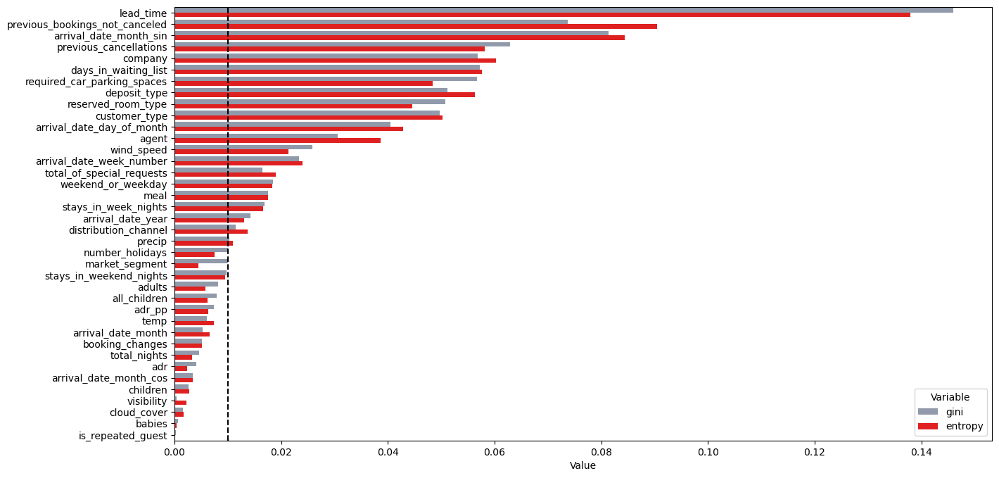

In [152]:
# ploting the feature importances for both criterions

zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini', 'entropy'])
zippy['col'] = feat_x_train.columns
tidy = zippy.melt(id_vars = 'col').rename(columns = str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize = (15, 8))
plot = sns.barplot(y = 'Col', x = 'Value', hue = 'Variable', data = tidy, palette = ['#8d99ae', 'red'])
plot.set(ylabel = None)

# drawing a vertical line at threshold
plt.axvline(x = 0.01, color = 'black', linestyle = '--')

plt.show()

<a id = "boruta"></a>

#### 2.11.3.5. Boruta

In [167]:
x_proper_train = pd.concat([feat_x_train_num_scaled, feat_x_train_nnum_encoded], axis = 1)

# BorutaPy accepts numpy arrays only, hence the .values attribute
x_boruta = x_proper_train.values
y_boruta = feat_y_train.values
y_boruta = y_boruta.ravel()

In [160]:
# Define Random Forest classifier
rf = RandomForestClassifier(n_jobs = -1, max_depth = 5, random_state = 5)

# Define Boruta feature selection method
feat_selector = BorutaPy(rf, n_estimators = 'auto', verbose = 2, random_state = 5)

# Find all relevant features 
feat_selector.fit(x_boruta, y_boruta)

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	65
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	65
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	65
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	65
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	65
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	65
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	65
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	37
Tentative: 	6
Rejected: 	22
Iteration: 	9 / 100
Confirmed: 	37
Tentative: 	6
Rejected: 	22
Iteration: 	10 / 100
Confirmed: 	37
Tentative: 	6
Rejected: 	22
Iteration: 	11 / 100
Confirmed: 	37
Tentative: 	6
Rejected: 	22
Iteration: 	12 / 100
Confirmed: 	37
Tentative: 	6
Rejected: 	22
Iteration: 	13 / 100
Confirmed: 	37
Tentative: 	6
Rejected: 	22
Iteration: 	14 / 100
Confirmed: 	37
Tentative: 	5
Rejected: 	23
Iteration: 	15 / 100
Confirmed: 	37
Tentative: 	5
Rejected: 	23
Iteration: 	16 / 100
Confirmed: 	37
Tentative: 	5
Reject

BorutaPy(estimator=RandomForestClassifier(max_depth=5, n_estimators=178,
                                          n_jobs=-1,
                                          random_state=RandomState(MT19937) at 0x1CE843DA940),
         n_estimators='auto',
         random_state=RandomState(MT19937) at 0x1CE843DA940, verbose=2)

In [161]:
# Check selected features 
feat_selector.support_

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False, False, False, False,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True, False,
       False, False,  True, False,  True,  True, False,  True,  True,
       False, False, False,  True, False,  True, False, False, False,
       False, False,  True, False, False, False, False, False, False,
        True, False,  True, False,  True, False,  True,  True,  True,
        True,  True])

In [162]:
# Check ranking of features
feat_selector.ranking_

array([ 1,  1,  1,  1,  1,  1,  1,  1,  1,  1, 24,  5,  3,  7,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1, 18,  8,  4,  1,  2,  1,  1, 16,
        1,  1,  6, 22, 26,  1,  8,  1, 27, 13, 14, 19, 16,  1, 10, 23, 14,
       12, 25, 20,  1, 21,  1, 11,  1,  2,  1,  1,  1,  1,  1])

In [164]:
selected_feat = []
for i in feat_selector.support_:
    if i==True:
        selected_feat.append('yes')
    else:
        selected_feat.append('no')

feat_ranking = pd.DataFrame({'Features': x_proper_train.columns, 'Selected': selected_feat, 'Ranking': feat_selector.ranking_})

# Sort the DataFrame by ranking
feat_ranking = feat_ranking.sort_values(by = 'Ranking')

# Print the sorted DataFrame
feat_ranking

,Features,Selected,Ranking
0,total_of_special_requests,yes,1
23,stays_in_weekend_nights,yes,1
24,previous_bookings_not_canceled,yes,1
25,temp,yes,1
29,ohc_market_segment_Direct,yes,1
...,...,...,...
49,ohc_reserved_room_type_L,no,23
10,days_in_waiting_list,no,24
52,ohc_meal_SC,no,25
38,ohc_company_94.0,no,26


In [165]:
list(feat_ranking.loc[feat_ranking['Selected'] == 'yes', 'Features'])

['total_of_special_requests',
 'stays_in_weekend_nights',
 'previous_bookings_not_canceled',
 'temp',
 'ohc_market_segment_Direct',
 'ohc_market_segment_Offline TA/TO',
 'ohc_distribution_channel_Direct',
 'ohc_customer_type_Transient',
 'ohc_customer_type_Transient-Party',
 'ohc_company_not applicable',
 'ohc_is_repeated_guest_1',
 'ohc_reserved_room_type_G',
 'ohc_deposit_type_Non Refund',
 'ohc_weekend_or_weekday_Just Weekday',
 'ohc_agent_241.0',
 'ohc_agent_40.0',
 'ohc_agent_not applicable',
 'ohc_agent_others',
 'all_children',
 'adr_pp',
 'ohc_market_segment_Online TA',
 'total_nights',
 'lead_time',
 'cloud_cover',
 'previous_cancellations',
 'adults',
 'stays_in_week_nights',
 'arrival_date_month',
 'arrival_date_year',
 'required_car_parking_spaces',
 'booking_changes',
 'wind_speed',
 'ohc_distribution_channel_TA/TO',
 'arrival_date_week_number',
 'visibility',
 'arrival_date_month_cos',
 'adr',
 'children']

In [176]:
# With Boruta, the features that contain relevant information and not only noise were maintained (the tentative feature was also
#maintained)
x_train_base = x_proper_train.iloc[:, feat_selector.support_ == True]
x_train_base

,total_of_special_requests,lead_time,cloud_cover,previous_cancellations,adults,stays_in_week_nights,arrival_date_month,arrival_date_year,booking_changes,wind_speed,...,ohc_is_repeated_guest_1,ohc_reserved_room_type_G,ohc_deposit_type_Non Refund,ohc_weekend_or_weekday_Just Weekday,ohc_agent_241.0,ohc_agent_40.0,ohc_agent_not applicable,ohc_agent_others,ohc_distribution_channel_Direct,ohc_distribution_channel_TA/TO
29351,0.0,0.060274,0.932599,0.0,0.018519,0.133333,0.818182,0.5,0.230769,0.694444,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
5479,0.4,0.430137,0.686753,0.0,0.018519,0.666667,0.272727,0.5,0.000000,0.261852,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1256,0.4,0.087671,0.503647,0.0,0.018519,0.266667,0.636364,0.0,0.000000,0.411905,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
8112,0.0,0.668493,0.478604,0.0,0.018519,0.333333,0.727273,0.5,0.000000,0.509028,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
24413,0.0,0.013699,0.511512,0.0,0.018519,0.066667,0.363636,0.5,0.076923,0.077778,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38674,0.2,0.295890,0.155531,0.0,0.037037,0.333333,0.545455,1.0,0.000000,0.151042,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2609,0.2,0.452055,0.644770,0.0,0.018519,0.333333,0.818182,0.0,0.000000,0.438194,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
24414,0.0,0.221918,0.561562,0.0,0.018519,0.200000,0.363636,0.5,0.000000,0.280556,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
7625,0.0,0.043836,0.622222,0.0,0.000000,0.266667,0.636364,0.5,0.000000,0.362222,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


<a id = "feat-random-forest"></a>

#### 2.11.3.6. Random Forest

In [179]:
# Here, we used the Sequential Feature Selector with a Random Forest Classifier to find the most important features for the 
#model. We tested other methods, along with different values for max_depth and tol in order to find the best subset. Attention
#was paid to the scores below and the results on the modeling phase
# Create a Random Forest classifier
rf = RandomForestClassifier(random_state = 5)

# Create the Sequential Feature Selector
sfs = SequentialFeatureSelector(estimator = rf, cv = 5, n_features_to_select = 'auto', tol = 0.00000001, n_jobs = -1)

# Apply the feature selector on the training data
selected_features = sfs.fit_transform(np.array(x_train_base), np.array(feat_y_train).ravel())

# Get the indices of the selected features
selected_feature_indices = sfs.get_support(indices = True)

# Subset the training data with the selected features
x_train_base = x_train_base.iloc[:, selected_feature_indices]

# Perform cross-validation with the selected features
cv_results = cross_validate(rf, np.array(x_train_base), np.array(y_train).ravel(), cv = 5, scoring = 'recall', return_train_score = True)

NameError: name 'cross_validate' is not defined

In [180]:
len(selected_feature_indices)

8

In [183]:
list(x_train_base.columns)

['previous_cancellations',
 'adults',
 'total_nights',
 'required_car_parking_spaces',
 'all_children',
 'previous_bookings_not_canceled',
 'ohc_market_segment_Direct',
 'ohc_deposit_type_Non Refund']

<a id = "final-insights"></a>

### Final insights

#### Numerical Data

|                               | ANOVA   | Kendall's | RFE - logistic regression | RFE - decision tree | Lasso   | Ridge   | Elastic Net | Decision Tree | What to do?                         |
|-------------------------------|---------|-----------|---------------------------|---------------------|---------|---------|-------------|---------------|-------------------------------------|
| *LeadTime*                    | Keep    | Keep      | Keep                      | Keep                | Keep    | Keep    | Discard     | Keep          | Include in the model                |
| *ArrivalDateYear*             | Keep    | Keep      | Keep                      | Keep                | Keep    | Discard | Discard     | Keep          | Include in the model                |
| *ArrivalDateWeekNumber*       | Keep    | Keep      | Discard                   | Keep                | Discard | Keep    | Discard     | Keep          | Include in the model                |
| *ArrivalDateDayOfMonth*       | Discard | Discard   | Discard                   | Keep                | Discard | Discard | Discard     | Keep          | Discard                             |
| *StaysInWeekendNights*        | Keep    | Keep      | Discard                   | Keep                | Discard | Discard | Discard     | Keep          | Include in the model (with/without) |
| *StaysInWeekNights*           | Keep    | Keep      | Keep                      | Keep                | Keep    | Keep    | Discard     | Keep          | Include in the model                |
| *Adults*                      | Keep    | Keep      | Keep                      | Keep                | Discard | Discard | Discard     | Discard       | Include in the model (with/without) |
| *Children*                    | Keep    | Keep      | Discard                   | Keep                | Keep    | Discard | Discard     | Discard       | Include in the model (with/without) |
| *Babies*                      | Keep    | Keep      | Keep                      | Discard             | Discard | Discard | Discard     | Discard       | Discard                             |
| *PreviousCancellations*       | Keep    | Keep      | Keep                      | Keep                | Keep    | Keep    | Discard     | Keep          | Include in the model                |
| *PreviousBookingsNotCanceled* | Keep    | Keep      | Keep                      | Keep                | Keep    | Keep    | Discard     | Keep          | Include in the model                |
| *BookingChanges*              | Keep    | Keep      | Keep                      | Keep                | Keep    | Keep    | Discard     | Discard       | Include in the model                |
| *DaysInWaitingList*           | Discard | Keep      | Keep                      | Keep                | Keep    | Keep    | Discard     | Keep          | Include in the model                |
| *ADR*                         | Keep    | Keep      | Keep                      | Keep                | Keep    | Keep    | Discard     | Keep          | Include in the model                |
| *RequiredCarParkingSpaces*    | Keep    | Keep      | Keep                      | Keep                | Keep    | Keep    | Discard     | Keep          | Include in the model                |
| *TotalOfSpecialRequests*      | Keep    | Keep      | Keep                      | Keep                | Keep    | Keep    | Discard     | Discard       | Include in the model                |
| *AllChildren*                 | Keep    | Keep      | Discard                   | Keep                | Discard | Discard | Discard     | Discard       | Discard                             |
| *ADRpp*                       | Discard | Discard   | Discard                   | Keep                | Keep    | Keep    | Discard     | Discard       | Discard                             |
| *TotalNights*                 | Keep    | Keep      | Keep                      | Keep                | Keep    | Keep    | Discard     | Discard       | Include in the model                |
| *ArrivalDateMonth*            | Keep    | Keep      | Discard                   | Keep                | Discard | Keep    | Discard     | Discard       | Include in the model (with/without) |
| *NumberHolidays*              | Keep    | Keep      | Discard                   | Keep                | Keep    | Discard | Discard     | Discard       | Include in the model (with/without) |
| *WindSpeedAvg*                | Discard | Keep      | Discard                   | Keep                | Discard | Discard | Discard     | Discard       | Discard                             |
| *TemperatureAvg*              | Keep    | Keep      | Discard                   | Keep                | Discard | Discard | Discard     | Keep          | Include in the model (with/without) |
| *Precipitation*               | Discard | Discard   | Discard                   | Keep                | Discard | Discard | Discard     | Keep          | Discard                             |
| *ArrivalDateMonthSin*         | Keep    | Keep      | Discard                   | Keep                | Discard | Discard | Discard     | Keep          | Include in the model (with/without) |
| *ArrivalDateMonthCos*         | Keep    | Keep      | Keep                      | Keep                | Keep    | Keep    | Discard     | Discard       | Include in the model                |

#### Categorical Data

|                       | Chi-square | Mutual Information | Visualizing | Decision Tree | What to do?          |
|-----------------------|------------|--------------------|-------------|---------------|----------------------|
| *DepositType*         | Keep       | Keep               | Keep        | Keep          | Include in the model |
| *Company*             | Keep       | Keep               | Keep        | Discard       | Include in the model |
| *ReservedRoomType*    | Keep       | Discard            | Discard     | Keep          | Discard              |
| *IsRepeatedGuest*     | Keep       | Keep               | Discard     | Discard       | Include in the model |
| *Meal*                | Keep       | Discard            | Discard     | Keep          | Discard              |
| *MarketSegment*       | Keep       | Keep               | Keep        | Keep          | Include in the model |
| *WeekendOrWeekday*    | Keep       | Discard            | Discard     | Keep          | Include in the model |
| *DistributionChannel* | Keep       | Keep               | Keep        | Keep          | Include in the model |
| *CustomerType*        | Keep       | Keep               | Discard     | Keep          | Include in the model |
| *Agent*               | Keep       | Keep               | Keep        | Keep          | Include in the model |
| *TemperatureAvgBin*   | Keep       | Discard            | Discard     | Discard       | Discard              |
| *WindSpeedAvgBin*     | Keep       | Discard            | Discard     | Keep          | Discard              |
| *PrecipitationBin*    | Discard    | Discard            | Discard     | Discard       | Discard              |

By analysing the several methods for feature selection, some conclusions came up. 
Regarding numerical data, since Elastic Net Method did not have any variance in results, this one was not taken in consideration. Therefore, it was decided to include in the model the variables `LeadTime`, `ArrivalDateYear`, `ArrivalDateWeekNumber`, `StaysInWeekNights`, `PreviousCancellations`, `PreviousBookingsNotCanceled`, `BookingChanges`, `DaysInWaitingList`, `ADR`, `RequiredCarParkingSpace`, `TotalOfSpecialRequests`, `TotalNights`, and `ArrivalDateMonthCos`. On the other hand, we will discard `ArrivalDateDayOfMonth`, `Babies`, `AllChildren`, `ADRpp`, `WindSpeedAvg`, and `Precipitation`. There are some features that the conclusion was not so clear, so we will try to build the models both with and without them, namely: `StaysInWeekendNights`, `Adults`, `Children`, `ArrivalDateMonth`, `NumberHolidays`, `TemperatureAvg`, and `ArrivalDateMonthSin`.
As for categorical data, four methods were tested, and it was decided on a majority basis. In the event of a tie, the criteria was whether the feature is more relevant or not in terms of business context. This way, we will include in the model `DepositType`, `Company`, `IsRepeatedGuest`, `MarketSegment`, `WeekendOrWeekday`, `DistributionChannel`, `CustomerType`, and `Agent`. On the other hand, we will discard `ReservedRoomType`, `Meal`, `TemperatureAvgBin`, `WindSpeedAvgBin`, and `PrecipitationBin`.

<a id = "modelling"></a>
    
## 3. Modelling

- [Useful Functions](#functions)
- [Base Models](#base-models)
- [3.1. Logistic Regression](#logistic-regression)
- [3.2. Naive Bayes](#naive-bayes)
- [3.3. K-Nearest Neighbors](#k-nearest-neighbors)
- [3.4. Decision Trees](#decision-trees)
- [3.5. Ridge Classifier](#ridge-classifier)
- [3.6. Ensemble Methods](#ensemble-methods)
    - [3.6.1. Bagging](#bagging)
    - [3.6.2. Random Forest](#random-forest)
    - [3.6.3. AdaBoost](#adaboost)
    - [3.6.4. GradientBoosting](#gradientboosting)
    - [3.6.5. Extra Trees](#extra-trees)
    - [3.6.6. Stacking](#stacking)
- [Models with Different Combinations of Preprocessing](#models-different-combinations-preprocessing)
- [Models without Some Features](#models-without-features)

[Back to TOC](#toc)

Since we already did the feature selection, we should update the dataset to only contain the features we will use in the models, and, also, the lists containing the names of the used features `metric_features` and `non_metric_features`.

In [177]:
# creating an object named data that will contain the independent variables and another object named target that will contain the dependent variable/target, in this case 'IsCanceled'.

data = df.drop('IsCanceled', axis = 1)
target = df.loc[:, 'IsCanceled']

In [178]:
# creating the new features and doing the necessary transformations using the functions created before 

data = new_features(data, continent_dict)
data = create_holidays(data)
data = add_weather(data, ['TemperatureAvg', 'WindSpeedAvg', 'Precipitation'])
data, weather_variables_binned = binning_variables(data)
data = cyclical_encoding(data)
data = joining_categories(data, ['Country', 'Agent', 'Company'])

In [179]:
metric_features_todrop = ['DaysBetweenLastStatus', 'ArrivalDateDayOfMonth', 'Babies', 'AllChildren', 'ADRpp', 'WindSpeedAvg', 'Precipitation']
non_metric_features_todrop = ['Country', 'AssignedRoomType', 'ReservationStatus', 'Continent', 'ReservedRoomType', 'Meal', 'TemperatureAvgBin', 'WindSpeedAvgBin', 'PrecipitationBin']

# droping also the date variables, since they cannot be used in that format to build the models
data.drop(metric_features_todrop + non_metric_features_todrop + ['ReservationStatusDate', 'ArrivalDate', 'DepartureDate'], axis = 1, inplace = True)

upd_metric_features = list(set(upd_metric_features) - set(metric_features_todrop))
upd_non_metric_features = list(set(upd_non_metric_features) - set(non_metric_features_todrop))

The procedure here in the modelling phase is that first train the model by providing both features and target for some observations, and then test the model by only providing features and expecting it to predict the target. Therefore, we need to split the data into training and validation subsets. So we start by splitting the data.

If we split data using `train_test_split` (using a **hold-out method**), we can only train a model with the portion set aside for training, which cannot fully represent our dataset. So, we used **cross-validation**, where the dataset is divided into N sets: N-1 sets are used for training and the remaining set is used for testing. There are different methods to split data with cross validation in sklearn: K-Fold, Stratified K-Fold, Repeated K-Fold and Repeated Stratified K-Fold, for example. 

**KFold** divides the dataset into k folds, and when shuffle is set to True, then the splitting will be random.

In [180]:
# creating a kfold instance where the number of splits is 10

kf = KFold(n_splits = 10, shuffle = True, random_state = 5)

In **StratifiedKFold**, the class distribution in the dataset is preserved in the training and test splits, so in classifications tasks with imbalanced class distributions, we should prefer StratifiedKFold.

In [181]:
# creating a stratified kfold instance where the number of splits is 10

skf = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 5)

A single run of the KFold cross-validation procedure may result in a noisy estimate of model performance, since different splits of the data may result in very different results. **RepeatedKFold** cross-validation provides a way to improve the estimated performance of the model, by repeating the cross-validation procedure multiple times and reporting the mean result across all folds from all runs. This mean result is expected to be a more accurate estimate of the true unknown underlying mean performance of the model on the dataset, as calculated using the standard error.

In [182]:
# creating a repeated kfold instance where the number of splits is 10 and the number of times cross-validator needs to be repeated is 5, so we will obtain 50 models

rkf = RepeatedKFold(n_splits = 10, n_repeats = 5, random_state = 5)

The same logic applies for the **RepeatedStratifiedKFold**. The main objective is to repeat the StratifiedKFold procedure to improve the calculation of the model's performance

In [183]:
# creating a stratified repeated kfold instance where the number of splits is 10 and the number of times cross-validator needs to be repeated is 5, so we will obtain 50 models

rskf = RepeatedStratifiedKFold(n_splits = 10, n_repeats = 5, random_state = 5)

In any binary classification task, the model can only achieve two results: either our model is correct or incorrect in the prediction where we only have two classes. So, in order to evaluate the performance of our models, we should compare the target we have for the training/validation datasets with the respective predictions that the model made for the training/validation datasets. We can use 4 metrics (since our problem is a classification problem with only 2 possible classes): accuracy, precision, recall, and f1-score.

- **Accuracy** measures how often the classifier correctly predicts.
- **Precision** explains how many of the correctly predicted cases actually turned out to be positive, so is useful in the cases where a false positive is a higher concern than a false negative.
- **Recall** (or sensitivity) explains how many of the actual positive cases the model was able to predict correctly, so is a useful metric in cases where a false negative is of higher concern than a false positive.
- **F1 Score** gives a combined idea about precision and recall metrics.

<a id = "functions"></a>

### Useful Functions

In [184]:
def model_x_y_manual_method(x_data, y_data):
    """
    inputs:
    - x_data: pandas DataFrame containing the input independent data.
    - y_data: pandas DataFrame containing the input dependent data.
    
    function that performs manual outlier detection and filtering on the input data based on fixed upper limits for each variable, when data is split between dependent and independent variables
    """
    
    # defining the limits to search for outliers
    filter = (
        (x_data['LeadTime'] <= 365)
        &
        (x_data['StaysInWeekendNights'] <= 6)
        &
        (x_data['StaysInWeekNights'] <= 15)
        &
        (x_data['PreviousCancellations'] <= 10)
        &
        (x_data['PreviousBookingsNotCanceled'] <= 36)
        &
        (x_data['DaysInWaitingList'] <= 365)
        &
        (x_data['ADR'] < 5400)
    )
    
    # applying the filter to our dataframe
    x_filter = x_data[filter]
    y_filter = y_data[filter]
    
    return x_filter, y_filter, filter

In [185]:
def model_metrics(x, y, model, split_method, encoding_list, scaling_list, outlier_list):
    """
    inputs:
    - x: pandas DataFrame with the independent features.
    - y: pandas DataFrame with the target values.
    - model: machine learning model instance to use for prediction.
    - split_method: cross-validation method using for splitting the dataset in training and validation (sk-learn instance).
    - encoding_list: list of boolean values that determine which encoding methods to use.
                     encoding_list = [one-hot encoding, ordinal encoding]
                     if we want to encode the non metric features using one-hot encoding, we pass to the function [True, False]
                     if we want to encode the non metric features using ordinal encoding, we pass to the functiom [False, True]
    - scaling_list: list of boolean values that determine which scaling methods to use. 
                    scaling_list = [min-max, standard, robust]
                    if we want to scale the data using min-max method, we pass to the function [True, False, False]
                    if we want to scale the data using standard method, we pass to the function [False, True, False]
                    if we want to scale the data using robust method, we pass to the function [False, False, True]
    - outlier_list: list of boolean values that determine whether to remove outliers or not and which method to use.
                    outlier_list = [manual_filtering, iqr_filtering]
                    if we want to remove outliers using manual filtering method, we pass to the function [True, False]
                    if we want to remove outliers using IQR method, we pass to the function [False, True]
                    if we do not want to remove outliers, we pass to the function [False, False]
    
    function to calculate the performance metrics of a machine learning model for training and validation datasets
    the time taken to fit the model and the overfitting metric (difference between the recall of the validation and training dataset) are also calculated
    """
    
    # these lists store the metrics for the training data and for the validation data, for each model
    f1_train = []
    f1_val = []

    precision_train = []
    precision_val = []

    accuracy_train = []
    accuracy_val = []

    recall_train = []
    recall_val = []
    
    # this list stores the time
    timer = []

    # one iteration for each model created for each fold of the dataset
    for train_index, val_index in split_method.split(x, y):
        
        # getting the index from the splits
        x_train, x_val = x.iloc[train_index], x.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        # -------------------------------------------------------------------------------------------------------------------------
        # INPUTING THE MISSING VALUES
        # -------------------------------------------------------------------------------------------------------------------------
        # a control to know if there are metric features in our dataset to scale and to inpute missing values in Children
        metric_bool = True
        for feature in upd_metric_features:
            if feature not in x.columns:
                metric_bool = False

        if metric_bool: 
            x_train, x_val = train_val_input_nan_central(x_train, x_val, ['Children'], None)

        # -------------------------------------------------------------------------------------------------------------------------
        # REMOVING OUTLIERS
        # -------------------------------------------------------------------------------------------------------------------------
        if outlier_list[0] & ~outlier_list[1]:
            x_train, y_train, manual_filter = model_x_y_manual_method(x_train, y_train)

        if ~outlier_list[0] & outlier_list[1]:
            x_train, y_train, iqr_filter = x_y_IQR_method(x_train, y_train, upd_metric_features)
            
        # -------------------------------------------------------------------------------------------------------------------------
        # ENCODING THE FEATURES
        # -------------------------------------------------------------------------------------------------------------------------
        # encoding all non-metric features with one-hot encoder
        if encoding_list[0] & ~encoding_list[1]:
            x_train, x_val, feat_encoded = train_val_ohc(x_train, x_val, upd_non_metric_features)

        # encoding all non-metric features with ordinal encoder    
        if ~encoding_list[0] & encoding_list[1]:
            x_train, x_val = train_val_oe(x_train, x_val, upd_non_metric_features)
        
        # -------------------------------------------------------------------------------------------------------------------------
        # SCALING THE FEATURES
        # -------------------------------------------------------------------------------------------------------------------------
             
        if metric_bool & scaling_list[0]:
            # scaling the data with the min-max scaler using the function created before, only if there are metric features
            scaler, x_train, x_val = train_val_minmax_scaler(x_train, x_val, upd_metric_features)
            
        if metric_bool & scaling_list[1]:
            # scaling the data with the standard scaler using the function created before, only if there are metric features
            scaler, x_train, x_val = train_val_standard_scaler(x_train, x_val, upd_metric_features)
            
        if metric_bool & scaling_list[2]:
            # scaling the data with the robust scaler using the function created before, only if there are metric features
            scaler, x_train, x_val = train_val_robust_scaler(x_train, x_val, upd_metric_features)
        
        # -------------------------------------------------------------------------------------------------------------------------
        # MODELLING
        # -------------------------------------------------------------------------------------------------------------------------
        # start counting time
        begin = time.perf_counter()
        
        # fitting the model to the validation dataset
        model.fit(X = x_train, y = y_train)
        
        # finish counting time
        end = time.perf_counter()
        
        # getting the values that the model predicted
        y_train_pred = model.predict(x_train)
        y_val_pred = model.predict(x_val)
        
        # calculating the metrica for the models we created in each iteration of the loop
        value_f1_train = f1_score(y_train, y_train_pred)
        value_f1_val = f1_score(y_val, y_val_pred)

        value_precision_train = precision_score(y_train, y_train_pred)
        value_precision_val = precision_score(y_val, y_val_pred)

        value_accuracy_train = accuracy_score(y_train, y_train_pred)
        value_accuracy_val = accuracy_score(y_val, y_val_pred)

        value_recall_train = recall_score(y_train, y_train_pred)
        value_recall_val = recall_score(y_val, y_val_pred)
                
        # storing the metrics for both training and validation datasets
        f1_train.append(value_f1_train)
        f1_val.append(value_f1_val)

        precision_train.append(value_precision_train)
        precision_val.append(value_precision_val)

        accuracy_train.append(value_accuracy_train)
        accuracy_val.append(value_accuracy_val)

        recall_train.append(value_recall_train)
        recall_val.append(value_recall_val)
        
        # storing the time
        timer.append(end - begin)
    
    # calculating the average and the standard deviation of the metrics for all models created
    train_f1_average = round(np.mean(f1_train), 5)
    val_f1_average = round(np.mean(f1_val), 5)
    train_f1_std = round(np.std(f1_train), 5)
    val_f1_std = round(np.std(f1_val), 5)

    train_precision_average = round(np.mean(precision_train), 5)
    val_precision_average = round(np.mean(precision_val), 5)
    train_precision_std = round(np.std(precision_train), 5)
    val_precision_std = round(np.std(precision_val), 5)

    train_accuracy_average = round(np.mean(accuracy_train), 5)
    val_accuracy_average = round(np.mean(accuracy_val), 5)
    train_accuracy_std = round(np.std(accuracy_train), 5)
    val_accuracy_std = round(np.std(accuracy_val), 5)

    train_recall_average = round(np.mean(recall_train), 5)
    val_recall_average = round(np.mean(recall_val), 5)
    train_recall_std = round(np.std(recall_train), 5)
    val_recall_std = round(np.std(recall_val), 5)
    
    time_average = round(np.mean(timer), 3)
    time_std = round(np.std(timer), 2)
    overfitting_recall = round(train_recall_average - val_recall_average, 5)

    return str(train_f1_average) + '+/-' + str(train_f1_std), str(val_f1_average) + '+/-' + str(val_f1_std),\
           str(train_precision_average) + '+/-' + str(train_precision_std), str(val_precision_average) + '+/-' + str(val_precision_std),\
           str(train_accuracy_average) + '+/-' + str(train_accuracy_std), str(val_accuracy_average) + '+/-' + str(val_accuracy_std),\
           str(train_recall_average) + '+/-' + str(train_recall_std), str(val_recall_average) + '+/-' + str(val_recall_std),\
           str(time_average) + '+/-' + str(time_std), str(overfitting_recall)

In [186]:
def show_results(df, *args):
    """
    inputs:
    - df: pandas DataFrame with empty rows to store the results.
    - args: tuple of arguments for each model that includes:
        - x: pandas DataFrame with the independent features.
        - y: pandas DataFrame with the target values.
        - model: machine learning model instance to use for prediction.
        - split_method: cross-validation method using for splitting the dataset in training and validation (sk-learn instance).
        - encode: boolean value indicating whether to perform one-hot encoding on non-metric features.
        - scaling_list: list of boolean values that determine which scaling methods to use. 
                        scaling_list = [min-max, standard, robust]
        - outlier_list: list of boolean values that determine whether to remove outliers or not and which method to use.
                        outlier_list = [manual_filtering, iqr_filtering]
                        if we want to remove outliers using manual filtering method, we pass to the function [True, False]
                        if we want to remove outliers using IQR method, we pass to the function [False, True]
                        if we do not want to remove outliers, we pass to the function [False, False]

    function to organize the results of the models for each product type
    """

    count = 0
    # for each model and the split method, the model, the encoded schema and the scaling schema are passed as argument
    for arg in args:
        
        # obtain the results provided by avg_score
        train_f1_average,\
            val_f1_average,\
            train_precision_average,\
            val_precision_average,\
            train_accuracy_average,\
            val_accuracy_average,\
            train_recall_average,\
            val_recall_average,\
            time_average,\
            overfitting = model_metrics(arg[0], arg[1], arg[2], arg[3], arg[4], arg[5], arg[6])
        
        # store the results in the right row
        df.iloc[count] = train_f1_average, val_f1_average, train_precision_average, val_precision_average, train_accuracy_average, val_accuracy_average, train_recall_average, val_recall_average, time_average, overfitting
        count += 1
        
    return df

In [187]:
def best_parameters(x, y, model, parameters, encoding_list, scale_data, outlier_list, type_search):
    """
    inputs:
    - x: pandas DataFrame with the input samples.
    - y: pandas DataFrame with the target values.
    - model: machine learning model instance to use for prediction.
    - parameters: dictionary with parameters names (string) as keys and lists of parameter settings to try as values.
    - encoding_list: list of boolean values that determine which encoding methods to use.
                     encoding_list = [one-hot encoding, ordinal encoding]
                     if we want to encode the non metric features using one-hot encoding, we pass to the function [True, False]
                     if we want to encode the non metric features using ordinal encoding, we pass to the functiom [False, True]
    - scale_data: boolean value indicating whether to scale the data using min-max scaler on metric features.
    - outlier_list: list of boolean values that determine whether to remove outliers or not and which method to use.
                    outlier_list = [manual_filtering, iqr_filtering]
                    if we want to remove outliers using manual filtering method, we pass to the function [True, False]
                    if we want to remove outliers using IQR method, we pass to the function [False, True]
                    if we do not want to remove outliers, we pass to the function [False, False]
    - type_search: string with the type of search method to use. Must be 'random' or 'grid'.
    
    function to perform Grid Search or Randomized Search to find the best parameters for a giving model using recall as evaluation metric
    """

    # -------------------------------------------------------------------------------------------------------------------------
    # INPUTING THE MISSING VALUES
    # -------------------------------------------------------------------------------------------------------------------------
    x = input_nan_central(x, ['Children'], None)
    
    # -------------------------------------------------------------------------------------------------------------------------
    # ENCODING NON METRIC FEATURES
    # -------------------------------------------------------------------------------------------------------------------------
    # encoding all non-metric features with one-hot encoder
    if encoding_list[0] & ~encoding_list[1]:
        x, feat_encoded = ohc(x, upd_non_metric_features)

    # encoding all non-metric features with ordinal encoder    
    if ~encoding_list[0] & encoding_list[1]:
        x = oe(x, upd_non_metric_features)

    # -------------------------------------------------------------------------------------------------------------------------
    # REMOVING OUTLIERS
    # -------------------------------------------------------------------------------------------------------------------------
    if outlier_list[0] & ~outlier_list[1]:
        x, y, manual_filter = model_x_y_manual_method(x, y)

    if ~outlier_list[0] & outlier_list[1]:
        x, y, iqr_filter = x_y_IQR_method(x, y, upd_metric_features)
           
    # -------------------------------------------------------------------------------------------------------------------------
    # SCALING METRIC FEATURES 
    # -------------------------------------------------------------------------------------------------------------------------
    # a control to know if there are metric features in our dataset to scale
    metric_bool = True
    for feature in upd_metric_features:
        if feature not in x.columns:
            metric_bool = False

    if metric_bool & scale_data:
        # scaling the data with the MinMax scaler using the function created before, only if there are metric features
        scaler, x = minmax_scaler(x, upd_metric_features)
    
    # -------------------------------------------------------------------------------------------------------------------------
    # SEARCHING FOR PARAMETERS
    # -------------------------------------------------------------------------------------------------------------------------

    # defining the type of search that was chosen
    if type_search == 'random':
        grid = RandomizedSearchCV(model, parameters, scoring = 'recall', cv = skf, return_train_score = True, n_jobs = -1, random_state = 5)

    elif type_search == 'grid':
        grid = GridSearchCV(model, parameters, scoring = 'recall', cv = skf, return_train_score = True, n_jobs = -1)

    else:
        return(None)

    grid.fit(x, y)
    
    # best parameter set
    print('------------------------------------------------------------------------------------------------------------------------')
    print('Best parameters found:\n', grid.best_params_)
    print('------------------------------------------------------------------------------------------------------------------------')

    # all results
    recall_val = grid.cv_results_['mean_test_score']
    std_val = grid.cv_results_['std_test_score']
    recall_train = grid.cv_results_['mean_train_score']
    parameters = grid.cv_results_['params']
    overfitting = np.abs(recall_val - recall_train)

    results = pd.DataFrame(zip(recall_val, std_val, recall_train, parameters, overfitting), columns = ['Recall Validation', 'Std Validation', 'Recall Train', 'Parameters', 'Overfitting'])
    results.sort_values(by = ['Recall Validation'], inplace = True, ascending = False)
    
    return results

<a id = "base-models"></a>

### Base models

Before we start with the tunning of each model applied, we can just define the instances for each model with the default parameters, to have an ideia of how are the models going to perform on this dataset, and what are the most suitable ones in this case.

In [222]:
# defining the objects for the base models

lr_base = LogisticRegression(random_state = 5)
nb_base = GaussianNB()
kn_base = KNeighborsClassifier()
dt_base = DecisionTreeClassifier(random_state = 5, max_depth = 3)
rc_base = RidgeClassifier(random_state = 5)
bg_base = BaggingClassifier(random_state = 5)
rf_base = RandomForestClassifier(random_state = 5)
ab_base = AdaBoostClassifier(random_state = 5)
gb_base = GradientBoostingClassifier(random_state = 5)
et_base = ExtraTreesClassifier(random_state = 5)

In [223]:
# calling the defined function to see the performance of the base models

df_base = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                       index = ['Logistic Regression',
                                'Gaussian Naive Bayes',
                                'K Nearest Neighbors',
                                'Decision Tree',
                                'Ridge',
                                'Bagging',
                                'Random Forest',
                                'AdaBoost',
                                'GradientBoosting',
                                'Extra-Trees'])

show_results(df_base,
             [data, target, lr_base, skf, [True, False], [True, False, False], [False, False]],
             [data, target, nb_base, skf, [True, False], [True, False, False], [False, False]],
             [data[upd_metric_features], target, kn_base, skf, [False, False], [True, False, False], [False, False]],
             [data, target, dt_base, skf, [True, False], [True, False, False], [False, False]],
             [data, target, rc_base, skf, [True, False], [True, False, False], [False, False]],
             [data, target, bg_base, skf, [True, False], [True, False, False], [False, False]],
             [data, target, rf_base, skf, [True, False], [True, False, False], [False, False]],
             [data, target, ab_base, skf, [True, False], [True, False, False], [False, False]],
             [data, target, gb_base, skf, [True, False], [True, False, False], [False, False]],
             [data, target, et_base, skf, [True, False], [True, False, False], [False, False]])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
Logistic Regression,0.55546+/-0.002,0.5546+/-0.00848,0.70022+/-0.00134,0.6995+/-0.01289,0.77766+/-0.00064,0.77726+/-0.00385,0.4603+/-0.00259,0.45963+/-0.01129,0.389+/-0.05,0.00067
Gaussian Naive Bayes,0.56676+/-0.00133,0.56651+/-0.00828,0.44789+/-0.00377,0.44754+/-0.00729,0.64396+/-0.00489,0.64357+/-0.00799,0.77167+/-0.00742,0.77172+/-0.01251,0.087+/-0.02,-5e-05
K Nearest Neighbors,0.63396+/-0.00474,0.46767+/-0.00785,0.72293+/-0.00196,0.53589+/-0.00566,0.80329+/-0.00176,0.715+/-0.0026,0.56451+/-0.00671,0.41497+/-0.01074,0.011+/-0.0,0.14954
Decision Tree,0.55509+/-0.0021,0.55469+/-0.01129,0.68489+/-0.00329,0.68464+/-0.01143,0.77425+/-0.00062,0.77412+/-0.0049,0.46669+/-0.00408,0.46628+/-0.01219,0.073+/-0.0,0.00041
Ridge,0.51736+/-0.00254,0.51709+/-0.01051,0.71693+/-0.00176,0.71687+/-0.01455,0.77213+/-0.00072,0.77202+/-0.00396,0.40471+/-0.00302,0.40462+/-0.01267,0.046+/-0.01,9e-05
Bagging,0.96104+/-0.00055,0.61234+/-0.01065,0.98593+/-0.00092,0.6979+/-0.01495,0.97707+/-0.00032,0.79153+/-0.0062,0.93739+/-0.001,0.54558+/-0.0105,2.559+/-0.06,0.39181
Random Forest,0.98812+/-0.00028,0.63912+/-0.00954,0.99428+/-0.00061,0.72529+/-0.01291,0.99287+/-0.00017,0.8053+/-0.00544,0.98202+/-0.00069,0.5713+/-0.00854,5.604+/-0.09,0.41072
AdaBoost,0.59675+/-0.00218,0.59388+/-0.01078,0.73607+/-0.00248,0.73296+/-0.01067,0.79535+/-0.00089,0.79398+/-0.00421,0.50178+/-0.00288,0.49934+/-0.01393,1.71+/-0.02,0.00244
GradientBoosting,0.59894+/-0.00143,0.59645+/-0.01093,0.7548+/-0.00122,0.7508+/-0.01164,0.79937+/-0.00046,0.79797+/-0.00448,0.49643+/-0.00204,0.49489+/-0.01318,6.304+/-0.08,0.00154
Extra-Trees,0.9881+/-0.00029,0.62466+/-0.01046,0.999+/-0.00016,0.69093+/-0.01221,0.99289+/-0.00017,0.79328+/-0.00577,0.97743+/-0.00054,0.57004+/-0.01055,5.383+/-1.26,0.40739


This table presents the f1-score (metric combining precision and recall) as well as other metrics, which provides an overall of model performance. The standard deviation is also displayed, which measures the variability of the scores, therefore, lower standard deviations indicate more consistent and stable model performance.

So, looking at these results we can say:
- Generally, the most simple models are the ones that take less time, but they are not performing that well compared to others.
- Also, we can say that since the KNN model has this kind of results with the default parameters, we can try to tune it and see if we can achieve better results with a really simple model. We have a significant drop in performance on the validation set, suggesting overfitting, which should be controlled for.
- In terms of performance Bagging and Random Forest models achieved the highest scores, however, they also have the highest overfitting.
- We are quite overfitting in almost every model we have here since the difference between the training  recall and the validation recall is quite high. Meaning that the models are failing to generalize to unseen data.
- GradientBoosting requires more computational resources compared to other models, having the highest average execution time. 
- Lastly, our best models are Bagging, Random Forest, Extra Trees and GradientBoosting, but Gaussian Naive Bayes is the one with more balanced metrics and less overfitting.

These insights provide a starting point for further analysis and model selection since is crucial to consider both the performance metrics, like recall and overfitting when selecting a model. Also, the execution time can be an important factor to consider, especially for large datasets, like the one we are working with, and real-time applications.

<a id = "logistic-regression"></a>

### 5.1. Logistic regression

In our problem, the outcome that we are expecting is either 1 or 0 (whether the guest cancelled or not the reservation). So, with a logistic regression, we are going to get the probabilistic values (that range between 0 and 1), by fitting a 'S' shaped function (logistic function).

In [224]:
# defining an instance of a logistic regression

lr = LogisticRegression(random_state = 5)

In [225]:
# defining a dictionary with the possible values for the parameters that we want to test

lr_parameter_space = {
    'penalty': ['l1', 'l2', 'elasticnet', None],
    'solver': ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
}

In [258]:
# calling the previous defined function that searches for the best combinations of parameters for our model

lr_best = best_parameters(data, target, lr, lr_parameter_space, [False, True], True, [True, False], 'grid')
lr_best

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'penalty': None, 'solver': 'newton-cg'}
------------------------------------------------------------------------------------------------------------------------


,Recall Validation,Std Validation,Recall Train,Parameters,Overfitting
20,0.435478,0.008132,0.436405,"{'penalty': None, 'solver': 'newton-cg'}",0.000927
22,0.435223,0.008221,0.436185,"{'penalty': None, 'solver': 'sag'}",0.000962
18,0.434395,0.007104,0.436108,"{'penalty': None, 'solver': 'lbfgs'}",0.001713
23,0.434331,0.008258,0.435881,"{'penalty': None, 'solver': 'saga'}",0.001550
1,0.433885,0.008020,0.434735,"{'penalty': 'l1', 'solver': 'liblinear'}",0.000849
21,0.433376,0.008877,0.435407,"{'penalty': None, 'solver': 'newton-cholesky'}",0.002031
5,0.432739,0.008354,0.434183,"{'penalty': 'l1', 'solver': 'saga'}",0.001444
7,0.425541,0.006898,0.426256,"{'penalty': 'l2', 'solver': 'liblinear'}",0.000715
8,0.425350,0.007166,0.426044,"{'penalty': 'l2', 'solver': 'newton-cg'}",0.000694
9,0.425350,0.007166,0.426051,"{'penalty': 'l2', 'solver': 'newton-cholesky'}",0.000701


In [240]:
# defining an instance of DecisionTreeClassifier with the best set of parameters found above

lr_with_best = LogisticRegression(random_state = 5, penalty = None, solver = 'newton-cg')

In [232]:
# calling the defined function to see the performance of the decision tree with the set parameters found

df_lr = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                     index = ['logistic regression best parameters'])

show_results(df_lr, 
             [data, target, lr_with_best, skf, [False, True], [True, False, False], [True, False]],
            )

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
logistic regression best parameters,0.53867+/-0.0023,0.54402+/-0.00817,0.70329+/-0.00135,0.70534+/-0.01365,0.7757+/-0.00063,0.77597+/-0.00414,0.43651+/-0.0029,0.44288+/-0.00912,1.328+/-0.09,-0.00637


<a id = "naive-bayes"></a>

### 5.2. Naive bayes



Naive Bayes
https://stackoverflow.com/questions/14254203/mixing-categorial-and-continuous-data-in-naive-bayes-classifier-using-scikit-lea

The unique parameter that makes sense to change is **var_smoothing**, which is the "portion of the largest variance of all features that is added to variances for calculation stability" (sklearn). So we will try different values and see which one fits better.

In [233]:
# defining instances of a Gaussian naive bayes with different values for the parameter var_smoothing

gnb_var1 = GaussianNB(var_smoothing = 0.1)
gnb_var2 = GaussianNB(var_smoothing = 0.01)
gnb_var3 = GaussianNB(var_smoothing = 0.015)
gnb_var4 = GaussianNB(var_smoothing = 0.001)
gnb_var5 = GaussianNB(var_smoothing = 0.0001)
gnb_var6 = GaussianNB(var_smoothing = 0.00001)

In [234]:
# calling the defined function to see the performance of the naive bayes with the different parameters

df_gnb = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                      index = ['var_smoothing = 0.1', 
                               'var_smoothing = 0.01', 
                               'var_smoothing = 0.015', 
                               'var_smoothing = 0.001', 
                               'var_smoothing = 0.0001', 
                               'var_smoothing = 0.00001']
                     )
show_results(df_gnb, 
             [data, target, gnb_var1, skf, [True, False], [True, False, False], [True, False]],
             [data, target, gnb_var2, skf, [True, False], [True, False, False], [True, False]],
             [data, target, gnb_var3, skf, [True, False], [True, False, False], [True, False]],
             [data, target, gnb_var4, skf, [True, False], [True, False, False], [True, False]],
             [data, target, gnb_var5, skf, [True, False], [True, False, False], [True, False]],
             [data, target, gnb_var6, skf, [True, False], [True, False, False], [True, False]]
            )

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
var_smoothing = 0.1,0.54106+/-0.00075,0.54379+/-0.0054,0.40798+/-0.00073,0.41122+/-0.00404,0.59133+/-0.00097,0.59363+/-0.005,0.80297+/-0.00105,0.80259+/-0.01019,0.043+/-0.01,0.00038
var_smoothing = 0.01,0.54277+/-0.00086,0.54492+/-0.00556,0.40117+/-0.00081,0.40345+/-0.00424,0.57598+/-0.00119,0.57699+/-0.00573,0.83889+/-0.00113,0.83922+/-0.0103,0.038+/-0.0,-0.00033
var_smoothing = 0.015,0.54436+/-0.00085,0.54654+/-0.00588,0.40407+/-0.00093,0.40643+/-0.00457,0.58121+/-0.00143,0.58229+/-0.00614,0.83385+/-0.0013,0.83414+/-0.0107,0.038+/-0.0,-0.00029
var_smoothing = 0.001,0.54091+/-0.00076,0.54284+/-0.0049,0.39631+/-0.00082,0.39829+/-0.0034,0.56629+/-0.00136,0.56688+/-0.00451,0.85164+/-0.00156,0.85214+/-0.01032,0.038+/-0.0,-0.0005
var_smoothing = 0.0001,0.54203+/-0.00093,0.54395+/-0.0052,0.39803+/-0.00116,0.40003+/-0.00364,0.56943+/-0.002,0.57008+/-0.00478,0.84931+/-0.00203,0.84963+/-0.01064,0.039+/-0.0,-0.00032
var_smoothing = 0.00001,0.54475+/-0.00145,0.54705+/-0.0053,0.40266+/-0.00175,0.40505+/-0.00375,0.57787+/-0.00282,0.57904+/-0.00489,0.84185+/-0.00188,0.84242+/-0.01099,0.038+/-0.0,-0.00057


As we can see the results are the best value for `var_smoothing` is 0.001, so, in our model, we will add 0.001% of the largest variance of all features to variances for calculation stability.

In [241]:
# getting the model with the best set of parameters found above

gnb_with_best = GaussianNB(var_smoothing = 0.001)

In [237]:
# calling the defined function to see the performance of the gaussian naive bayes with the best parameters

df_gnb = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                      index = ['gnb best parameters'])
show_results(df_gnb, [data, target, gnb_with_best, skf, [True, False], [True, False, False], [True, False]])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
gnb best parameters,0.54091+/-0.00076,0.54284+/-0.0049,0.39631+/-0.00082,0.39829+/-0.0034,0.56629+/-0.00136,0.56688+/-0.00451,0.85164+/-0.00156,0.85214+/-0.01032,0.046+/-0.01,-0.0005


As we can notice, our results from the training dataset are similar to the ones from the validation dataset, which implies that we are not overfitting. Considering the amount of assumptions we made in order to apply Guassian Naive Bayes to our dataset and the simplicity of this algorithm we can conclude that these are pretty good results. 

<a id = "k-nearest-neighbors"></a>

### 5.3. K-nearest neighbors

KNN is an algorithm of Instance Based Learning, which compares new problem instances with instances that have been seen in training. The basic idea is to compute the k most similar observations to the one we are analysing (with a distance) and then use class labels of nearest neighbors to determine the class label of the unknown record. Since we do not know *a priori* what is the optimal number of neighbors to use in the comparison, we can define a loop to identify it.

#### Optimal number of neighbors

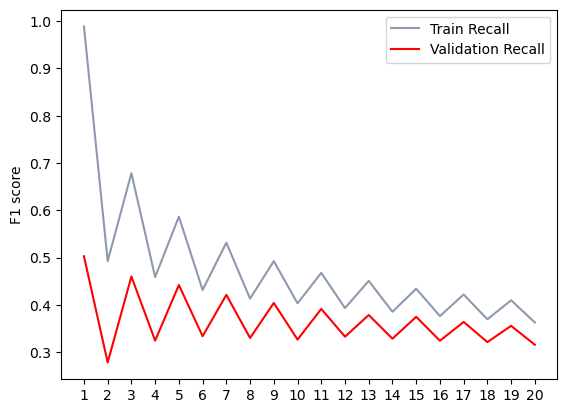

Best number of neighbors: 1
F1 score in train with 1 neighbors: 0.988887
F1 score in validation with 1 neighbors: 0.502822


In [238]:
numberK_list = np.arange(1, 21)
high_score = 0
non = 0

# creating lists to store the results from the different models
recall_train = []
recall_val = []

# since we only want the metric features we do a split containing only these variables
x_train, x_val, y_train, y_val = train_test_split(data[upd_metric_features], target, test_size = 0.3, random_state = 5, stratify = target, shuffle = True)
# and fill the missing values in variable 'Children'
x_train, x_val = train_val_input_nan_central(x_train, x_val, ['Children'], None)
# and then we scale the data, using the function defined previously
scaler, x_train, x_val = train_val_minmax_scaler(x_train, x_val, upd_metric_features)

for n in numberK_list:
    
    # creating an instance of the KNeighborsClassifier with the number of neighbors defined with the iterator
    model = KNeighborsClassifier(n_neighbors = n)   
    # fit the model to the data
    model.fit(x_train, y_train)
    
    # getting the predictions for training dataset
    y_train_pred = model.predict(x_train)
    # getting the predictions for test dataset
    y_val_pred = model.predict(x_val)
    
    # check the recall for the train
    value_train = recall_score(y_train, y_train_pred)
    # check the recall for the test
    value_val = recall_score(y_val, y_val_pred)

    # append the f1scores in the corresponding list
    recall_train.append(value_train)
    recall_val.append(value_val)
    
    # we store the highest f1 score we have until now, and the best number of neighbors is the one that provides the best result
    if(value_val > high_score):
        high_score = value_val
        non = n
        
# starting the visualization
plt.plot(numberK_list, recall_train, label = 'Train Recall', color = '#8d99ae')
plt.plot(numberK_list, recall_val, label = 'Validation Recall', color = 'red')
plt.xticks(numberK_list)
plt.legend()
plt.ylabel('F1 score')
plt.show()
        
print('Best number of neighbors: %d' %non)
print('F1 score in train with %d neighbors: %f' % (non, recall_train[non - 1]))
print('F1 score in validation with %d neighbors: %f' % (non, high_score))

Our loop tells us that the best number of neighbours is `1`, however, using only 1 neighbour in K Nearest Neighbors (KNN) is not the best choice. When n=1, KNN becomes very sensitive to noise in the data. Outliers or mislabeled observations can have a significant impact on the predictions, the model will tend to have low bias but high variance, meaning that it will fit the training data well but will not generalize well no unseen data. Also, choosing n = 1 results in a more complex model with higher computational requirements, since each prediction involves calculating distances to all training instances, which can be computationally expensive for large datasets. Also, looking at the plots we can see a decrease in the performance of the models when the number of neighbours being considered is even. This is a result of ties in voting because KNN uses a majority voting mechanism among the n nearest neighbours to determine the class of the new instance. So, when n is even, ties may occur resulting in the need of having tie-breaking strategies. So, we will use the 5 or 7 neighbours to build our KNN model as it is also the best number, considering both the performance of the model but also overfitting (difference in the metrics of the training dataset and validation dataset).

- We also can change the **weights**, this is the weight that each neighbor will have in the final prediction. We can weight observations by the inverse of their distance to the observation (meaning that the nearest neighbors have more impact on the prediction than the ones that are more distant), but we in this case we would worsen our problem with overfitting, since the closest observation would almost determine the prediction that we do.
- Although here the dataset is relatively small, so we do not have the problem of computation power, in bigger datasets is usual to use **KD-Tree** instead of **Brute Force** to search for the nearest neighbour. Instead of using the whole dataset to search for the nearest neighbor, we just use the cluster where that observation is located. So, with KD-Tree we get not the closest observation from the one we are using, but the closest observation from the same cluster we are searching in. That can be a problem, since we can make wrong assignments of the observations to the clusters. So, we expect the f1-score to be lower using this technique, but the procedure faster.
- For high dimensionality problems, sometimes the **Manhattan distance** is preferable over the **Euclidean distance**, so knowing that the **Minkowski metric** is equivalent to using manhattan_distance when $ p = 1 $ and is equivalent to using euclidean_distance when $ p = 2 $, we can check for this parameters.

Due to the evaluation time of this algorithm (KNN requires computing distances between each test sample and all the training samples to determine the nearest neighbours), we did not hyper tuned its parameters. We decided to define an instance of this model using the number of neighbours decided in the loop above, keeping the default parameters for the rest, except for parameter `algorithm`, which was set to **KD-Tree** due to the large size of our dataset.

In [242]:
# getting the model with the best set of parameters found above

knn_with_best = KNeighborsClassifier(algorithm = 'kd_tree', metric = 'minkowski', n_neighbors = 7, p = 2, weights = 'uniform')

In [240]:
# calling the defined function to see the performance of knn with the best parameters

df_knn = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                      index = ['knn best parameters'])
show_results(df_knn, [data[upd_metric_features], target, knn_with_best, skf, [False, False], [True, False, False], [True, False]])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
knn best parameters,0.60801+/-0.002,0.48204+/-0.00946,0.70897+/-0.00244,0.5627+/-0.01183,0.79412+/-0.00098,0.72654+/-0.00516,0.53223+/-0.00228,0.42168+/-0.00952,0.118+/-0.0,0.11055


As we can see, we are still overfitting, since the difference between the f1-score on the training dataset and on the validation dataset is 0.1.

<a id = "decision-trees"></a>

### 3.4. Decision Trees

Decision trees use simple decision rules inferred from the data features to learn the patterns. Decision trees' main advantages are that they are easy to understand and interpret (as they can be visualized), and they accept all kinds of features (both numerical and categorical/ordinal data). The problem with this type of algorithm is that they do not generalize the data well, meaning that they tend to overfit to the training data, which is a disadvantage unless we cut the tree, and they are unstable since small variations in the data usually lead to completely different trees.

In [241]:
# defining a function to plot the trees that we are going to create

def plot_tree(model, data):
    """
    inputs:
    - model: decision tree model object to visualize.
    - data: dataset used to train the model. This is used to extract features' names.
    
    function to visualize a decision tree
    """

    dot_data = export_graphviz(model,
                               feature_names = data.columns,  
                               class_names = ['Not cancelled', 'Cancelled'],
                               filled = True)
    pydot_graph = pydotplus.graph_from_dot_data(dot_data)
    pydot_graph.set_size('"20, 20"')
    
    return graphviz.Source(pydot_graph.to_string())

In [242]:
# defining an instance of a DecisionTreeClassifier

dt_test = DecisionTreeClassifier(random_state = 5)

In [243]:
# calling the defined function to see the performance of the Decision Tree with both split criteria

df_dttest = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                         index = ['One hot encoded', 'Ordinal encoded'])
show_results(df_dttest,
             [data, target, dt_test, rskf, [True, False], [True, False, False], [True, False]],
             [data, target, dt_test, rskf, [False, True], [True, False, False], [True, False]]
            )

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
One hot encoded,0.98819+/-0.00029,0.57807+/-0.00934,0.99902+/-0.00018,0.57654+/-0.00862,0.99299+/-0.00017,0.74466+/-0.00513,0.97759+/-0.00063,0.57973+/-0.01269,0.547+/-0.2,0.39786
Ordinal encoded,0.98819+/-0.00029,0.57735+/-0.00982,0.99902+/-0.00018,0.57602+/-0.01117,0.99299+/-0.00017,0.74427+/-0.00636,0.97759+/-0.00063,0.57882+/-0.01201,0.55+/-0.16,0.39877


As we can see in the results, the results are quite the same using both encoder methods, however the ordinal encoding method took less time to train the models, on average. We can also see that we are quite overfitting to our training dataset (recall is high compared to the validation dataset) using both criteria. The problem arises because we are building a full tree, only with pure leafs (with only one category). So, we can reduce the overfitting, by **prepruning a tree** (where we do not build the whole tree) or by **postpruning a tree** (where we build the whole tree but then cut it). We start by prepruning the tree, since it consumes less time (we only build part of the tree), keeping in mind that it is hard to define the initial thresholds, so we may have to try different parameters and see which one suits our data well.

In [244]:
# encoding the categorical features with the ordinal encoder

data_encoded = input_nan_central(data, upd_metric_features, upd_non_metric_features)
data_encoded = oe(data_encoded, upd_non_metric_features)

DecisionTreeClassifier(random_state=5)

We start by deciding what should be the **maximum_depth** for our decision tree. To do that, we can plot the average recall for train and validation dataset for trees where the depth range from 1 to 20 levels (almost the same as we did with KNN).

#### Optimal maximum depth

The best recall for train is 0.541 for the depth of 20
The best recall for validation is 0.487 for the depth of 20


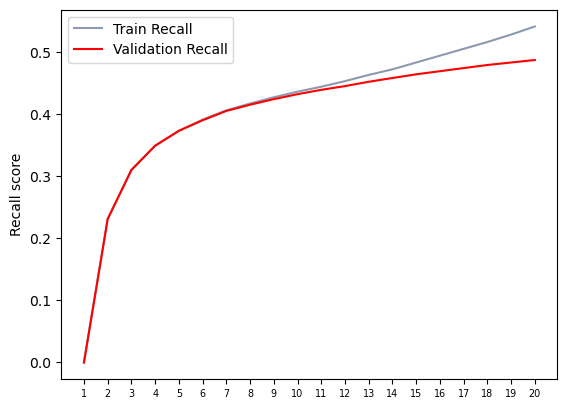

In [247]:
interval = range(1, 21)

# creating lists to store the results from the different models for the same max_depth
dt_recall_train = []
dt_recall_val = []

# creating lists to store the average results from the different models with number of depths
avg_dt_recall_train = []
avg_dt_recall_val = []

for value in interval:    
    for train_index, val_index in skf.split(data_encoded, target):
        # getting the indexes of the observations assigned for each partition
        x_train, x_val = data_encoded.iloc[train_index], data_encoded.iloc[val_index]
        y_train, y_val = target.iloc[train_index], target.iloc[val_index]

        # inputing the missing values using the median with the function created before
        x_train, x_val = train_val_input_nan_central(x_train, x_val, ['Children'], None)
        
        # scaling the data with the MinMax scaler using the function created before
        scaler, x_train, x_val = train_val_minmax_scaler(x_train, x_val, upd_metric_features)

        # creating an instance of the DecisionTreeClassifier with the parameter defined
        model = DecisionTreeClassifier(max_depth = value, random_state = 5)            
        # fit the model to the data
        model.fit(x_train, y_train)

        # getting the predictions for training dataset
        y_train_pred = model.predict(x_train)
        # getting the predictions for validation dataset
        y_val_pred = model.predict(x_val)

        # check the recall for the train
        value_train = recall_score(y_train, y_train_pred)
        # check the recall for the validation
        value_val = recall_score(y_val, y_val_pred)

        # append the f1scores in the corresponding list
        dt_recall_train.append(value_train)
        dt_recall_val.append(value_val)

    # calculate the average and the std for f1-score
    avg_dt_recall_train.append(round(np.mean(dt_recall_train), 3))
    avg_dt_recall_val.append(round(np.mean(dt_recall_val), 3))

print('The best recall for train is ' + str(max(avg_dt_recall_train)) + ' for the depth of ' + str(avg_dt_recall_train.index(max(avg_dt_recall_train)) + 1))
print('The best recall for validation is ' + str(max(avg_dt_recall_val)) + ' for the depth of ' + str(avg_dt_recall_val.index(max(avg_dt_recall_val)) + 1))

plt.plot(interval, avg_dt_recall_train, label = 'Train Recall', color = '#8d99ae')
plt.plot(interval, avg_dt_recall_val, label = 'Validation Recall', color = 'red')
plt.xticks(interval, fontsize = 'x-small')
plt.legend()
plt.ylabel('Recall score')
plt.show()

- The deeper we allow the tree to grow, the more complex the model will be, but the more overfitting we will have, since the leafs will be pure. So, we can control the maximum depth of the tree, by changing **max_depth** parameter. High depth causes overfitting (as explained) and low depth causes under fitting, so we will try numbers that seem acceptable given our model.
- In decision trees, input data is partitioned recursively based on selected attributes, and the selection is made based on an impurity measure that can be `gini`, `entropy`, `log_loss`. So, we can compare the two first **criterion**.
- We know that the **splitter** (the strategy used to choose the split at each node) can be random or best. If it is `random`, then it selects a random feature and a random split (making the process less computation intensive), if it is `best`, then it selects the best split, so it is more prone to overfitting.
- **min_samples_split** represents the minimum number of samples required to split an internal node. High values can prevent a model from learning specific relations to the particular sample selected for a tree (overfitting), but on the other hand, too high values can lead to underfitting.
- **min_samples_leaf** is the minimum number of samples required to be at a leaf node. So, if we increase this parameter we will make sure that each leaf has more than one element. Again, high values acn lead to overfitting, while low values can lead to under fitting.
- Sometimes it is not possible to look to all features at the same time we are building a tree. To solve this we have the parameter **max_features**, that controls the number of features to consider when looking for the best split. We can use a `float`, where the defined value will be multiplied by the number of features (and those are considered to each split); `auto` where the number of features considered is equal to sqrt(total number of features); `log2`, where the number of features considered is equal to log2(total number of features); and we have other options in sklearn. We will start by using log2 (use 4 features), and then change the value according to the results (using 10 features).
- Lastly, we can define the maximum number of leafs that we want to have. A leaf is a node without children, so we are literally cutting directly the tree by changing **max_leaf_nodes**.

We know that changing all these parameters at the same time to preprune a tree can lead to the tree being too small, so we tried to control for that.

In [248]:
# defining an instance of DecisionTreeClassifier with the default parameters, except random_state in order to replicate results

dt = DecisionTreeClassifier(random_state = 5)

In [249]:
# defining a dictionary with the possible values for the parameters that we want to test

dt_parameter_space = {
    'max_depth': [5, 6, 7, 8, 10, 12],
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'min_samples_split': [50, 100, 200],
    'max_features': ['log2', 10, None],
    'max_leaf_nodes': [4, 8, None]
}

In [259]:
# calling the previous defined function that searches for the best combinations of parameters for our model

dt_best = best_parameters(data, target, dt, dt_parameter_space, [False, True], True, [True, False], 'grid')
dt_best

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'criterion': 'gini', 'max_depth': 12, 'max_features': None, 'max_leaf_nodes': None, 'min_samples_split': 100, 'splitter': 'random'}
------------------------------------------------------------------------------------------------------------------------


,Recall Validation,Std Validation,Recall Train,Parameters,Overfitting
321,0.518408,0.019721,0.524459,"{'criterion': 'gini', 'max_depth': 12, 'max_fe...",0.006051
319,0.518025,0.016561,0.528110,"{'criterion': 'gini', 'max_depth': 12, 'max_fe...",0.010085
647,0.515605,0.011205,0.518953,"{'criterion': 'entropy', 'max_depth': 12, 'max...",0.003347
645,0.515032,0.018023,0.523022,"{'criterion': 'entropy', 'max_depth': 12, 'max...",0.007990
643,0.514841,0.022681,0.522484,"{'criterion': 'entropy', 'max_depth': 12, 'max...",0.007643
...,...,...,...,...,...
577,0.000000,0.000000,0.000000,"{'criterion': 'entropy', 'max_depth': 10, 'max...",0.000000
579,0.000000,0.000000,0.000000,"{'criterion': 'entropy', 'max_depth': 10, 'max...",0.000000
581,0.000000,0.000000,0.000000,"{'criterion': 'entropy', 'max_depth': 10, 'max...",0.000000
95,0.000000,0.000000,0.000000,"{'criterion': 'gini', 'max_depth': 6, 'max_fea...",0.000000


So, we found the best parameters for a Decision Tree that was prepruned (see results in the last table of these section), and now we can try the postprunning methods. We used `cost_complexity_pruning_path` that do the pruning and returns the alphas (or the complexity parameters).

In [245]:
# # splitting the dataset in two, in order to access the performance of the trees
# x_train, x_val, y_train, y_val = train_test_split(data_encoded, target, test_size = 0.3, random_state = 5, shuffle = True, stratify = target)

# # defining a decision tree instance
# dt_ccalpha = DecisionTreeClassifier(random_state = 5)

In [246]:
# # we use cost_complexity_pruning_path method from DecisionTreeClassifier that implements the prunning process and return all alphas
# path = dt_ccalpha.cost_complexity_pruning_path(x_train, y_train)
# ccp_alphas, impurities = path.ccp_alphas, path.impurities

# # then we create one tree for each value of ccp_alpha to compare the performances
# trees = []
# for ccp_alpha in ccp_alphas:
#     dt_ccalpha = DecisionTreeClassifier(random_state = 5, ccp_alpha = ccp_alpha).fit(x_train, y_train)
#     trees.append(dt_ccalpha)

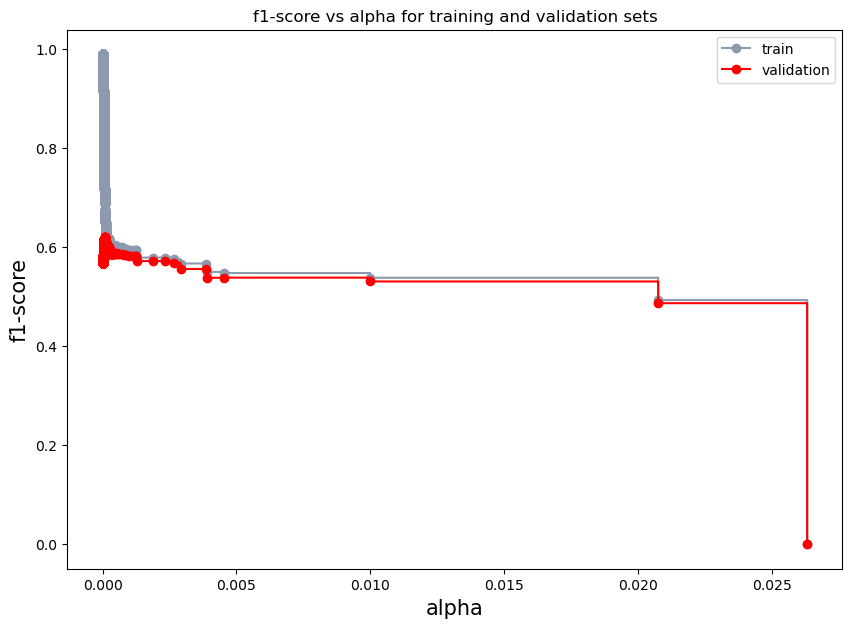

In [247]:
# # evaluating the different trees for the different ccp_alphas and plotting the results
# recall_train = []
# recall_val = []
# overfitting = []

# for tree in trees:
#     # getting the predictions for training dataset
#     y_train_pred = tree.predict(x_train)
#     # getting the predictions for validation dataset
#     y_val_pred = tree.predict(x_val)

#     # checking the recall for training
#     value_train = recall_score(y_train, y_train_pred)
#     # checking the recall for validation
#     value_val = recall_score(y_val, y_val_pred)

#     # appending f1scores in the corresponding list
#     recall_train.append(value_train)
#     recall_val.append(value_val)
#     overfitting.append(value_train - value_val)
    
# # transforming the values into a pandas dataframe for better understanding
# ccp_scores = pd.DataFrame({'recall_train': recall_train, 'recall_val': recall_val, 'overfitting': overfitting}, index = trees)

# # ploting the f1-scores fot the different alphas
# fig, ax = plt.subplots(figsize = (10, 7))
# ax.set_xlabel('alpha', fontsize = 15)
# ax.set_ylabel('recall', fontsize = 15)
# ax.set_title('recall vs alpha for training and validation sets')
# ax.plot(ccp_alphas, recall_train, marker = 'o', label = 'train', drawstyle = 'steps-post', color = '#8d99ae')
# ax.plot(ccp_alphas, recall_val, marker = 'o', label = 'validation', drawstyle = 'steps-post', color = 'red')
# plt.xticks(np.arange(0, 0.03, 0.005))
# ax.legend()
# plt.show()

In the plot, we can see that the 0 alpha corresponds to the unprunned tree, and when the alpha increases, the f1-score will decrease since the tree will become much shorter and more impure. We must chose an alpha that simultaneosly maximizes the f1-score for the validation dataset and minimizes the overfitting value (the difference between the f1-score for validation and training dataset). So, looking at the dataframe that is shown below, we would chose `ccp_alpha` = 8.12544812989095e-05

In [248]:
# ccp_scores[ccp_scores['overfitting'] < 0.08]

,f1score_train,f1score_val,overfitting
"DecisionTreeClassifier(ccp_alpha=8.075336428050647e-05, random_state=5)",0.697980,0.619120,0.078860
"DecisionTreeClassifier(ccp_alpha=8.084627814464327e-05, random_state=5)",0.697834,0.619601,0.078233
"DecisionTreeClassifier(ccp_alpha=8.09311828084464e-05, random_state=5)",0.697706,0.619584,0.078122
"DecisionTreeClassifier(ccp_alpha=8.113370835136305e-05, random_state=5)",0.697510,0.619424,0.078087
"DecisionTreeClassifier(ccp_alpha=8.113370835136305e-05, random_state=5)",0.697510,0.619424,0.078087
...,...,...,...
"DecisionTreeClassifier(ccp_alpha=0.0038904718405592398, random_state=5)",0.550163,0.538292,0.011871
"DecisionTreeClassifier(ccp_alpha=0.004522525982016468, random_state=5)",0.547964,0.538598,0.009367
"DecisionTreeClassifier(ccp_alpha=0.009995431443372518, random_state=5)",0.538398,0.530846,0.007552
"DecisionTreeClassifier(ccp_alpha=0.020758169160302084, random_state=5)",0.493250,0.486989,0.006261


Looking at the prepruning results and the postpruning results we can see that the better ones are resulting from prepruning techniques. So, we found the best combination of parameters, that maximizes the f1-score for the validation dataset. We can run a decision tree classifier with those parameters and see the performance of the algorithm.

In [251]:
# defining an instance of DecisionTreeClassifier with the best set of parameters found above

dt_with_best = DecisionTreeClassifier(random_state = 5, criterion = 'gini', max_depth = 12, max_features = None, max_leaf_nodes = None, min_samples_split = 100, splitter = 'random')
dt2_with_best = DecisionTreeClassifier(random_state = 5, ccp_alpha = 8.075336428050647e-05)

In [252]:
# calling the defined function to see the performance of the decision tree with the set parameters found

df_dt = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                     index = ['decision tree best parameters (prepruning)', 'decision tree best parameters (postpruning)'])
show_results(df_dt, 
             [data, target, dt_with_best, skf, [False, True], [True, False, False], [True, False]],
             [data, target, dt2_with_best, skf, [False, True], [True, False, False], [True, False]]
            )

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
decision tree best parameters (prepruning),0.60789+/-0.0057,0.6031+/-0.01098,0.72584+/-0.00896,0.71963+/-0.01474,0.79758+/-0.00172,0.79381+/-0.00565,0.52315+/-0.01164,0.51917+/-0.01164,0.066+/-0.01,0.00398
decision tree best parameters (postpruning),0.6483+/-0.00529,0.61257+/-0.01339,0.75592+/-0.00816,0.71336+/-0.01375,0.81525+/-0.00132,0.79509+/-0.00537,0.56772+/-0.01165,0.53717+/-0.02017,0.375+/-0.01,0.03055


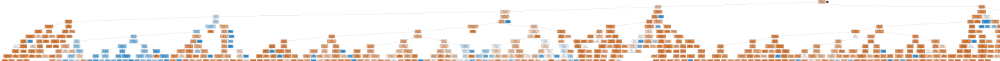

In [253]:
plot_tree(dt_with_best, data_encoded)

<a id = "ridge-classifier"></a>

### 3.5. Ridge classifier

This algorithm starts by converting binary the two classes in the target to {-1, 1}, and then trats the problem as a regression problem, minimizing a penalized residual sum of squares. If the regressor's prediction is positive, then the label of the observation will be 1, if the regressor's prediction is negative, the label of the observation will be -1. Ridge classifier is similar to a logistic regression, but it is faster and can be very versatile, as it allows different numerical solvers. Usually, the main reason of overfitting is the model complexity, and regularization can control the model complexity, because it penalizes higher terms in the model, meaning that when a regularization term is added, the model will minimize not only the loss function, but also the complexity. So, Ridge classifier introduces the L2 regularization. Instead of minimizing the cost function of the logistic regression, Ridge cassifier penalizes the sum of the squared values of the weights, so if the weights take large values the optimization function is penalized.

$$ \min_{w} C \sum_{i=1}^n \left(-y_i \log(\hat{p}(X_i)) - (1 - y_i) \log(1 - \hat{p}(X_i))\right) + r(w) $$

, where $ r(w) $ is in this case:

$$ \frac{1}{2}\|w\|_2^2 = \frac{1}{2}w^T w $$

Although our model was not performing that well using the default parameters, we can try to tune it. The first parameter we can change is **alpha**, which is a regularizaion strenght that reduces the variance of the estimates. Larger values specify stronger regularization, so it can be a solution for overfitting.

Solving a Ridge classifier is an optimization problem, as the algorithm tries to find the parameter weights that minimize a cost function. Scikit-learn provides different **solvers**:
- `svd` uses a Singular Value Decomposition of X to derive the coefficients.
- `cholesky` calculates the hessian matrix and solves the resulting linear system.
- `sparse_cg` more apporpriate than the last one for large-scale data.
- `lsqr`it is the fastest.
- `sag` uses a Stochastic Average Gradient descent. It is faster than the other solvers for large datasets (both large number of samples and large number of features).
- `saga` is almost the same as the above, but it is an unbiased and more flixible version. These two solvers need the features to be approximately in the same scale in order to guarantee fast convergence.
- `lbfgs` its performance is affected by poorly scaled datasets and by datasets with one-hot encoded categorical features with rare categories.
We still have the option to choose `auto`, and the algorithm chooses the solver automatically based on the type of data.

Other parameter we can change is **class_weight** which controls the weights associated with classes. If we set it to `balanced`, the values of y are used to automatically adjust weights inversely proportional to class frequencies in the training data, otherwise, all classes have weight one.

Useful websites:

https://www.youtube.com/watch?v=N7O8nqZ2CKg

https://scikit-learn.org/stable/modules/linear_model.html#ridge-regression

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.RidgeClassifier.html

https://www.cis.uni-muenchen.de/~stef/seminare/klassifikation_2021/referate/LogisticRegressionRidgeClassifier.pdf

https://stackoverflow.com/questions/53911663/what-does-sklearn-ridgeclassifier-do

In [188]:
# defining an instance of RidgeClassifier with the default parameters, except random_state in order to replicate results

rc = RidgeClassifier(random_state = 5)

In [189]:
# defining a dictionary with the possible values for the parameters that we want to test

rc_parameter_space = {
    'alpha': [0.01, 0.1, 0.2, 0.4, 0.5, 0.6, 0.8, 1],
    'solver': ['svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],
    'class_weight': ['balanced', None]
}

In [190]:
# calling the previous defined function that searches for the best combinations of parameters for our model

rc_best = best_parameters(data, target, rc, rc_parameter_space, [True, False], True, [True, False], 'grid')
rc_best

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'alpha': 0.8, 'class_weight': 'balanced', 'solver': 'sparse_cg'}
------------------------------------------------------------------------------------------------------------------------


,Recall Validation,Std Validation,Recall Train,Parameters,Overfitting
75,0.732484,0.015997,0.732880,"{'alpha': 0.8, 'class_weight': 'balanced', 'so...",0.000396
76,0.732357,0.016063,0.732902,"{'alpha': 0.8, 'class_weight': 'balanced', 'so...",0.000545
36,0.732357,0.016002,0.733022,"{'alpha': 0.4, 'class_weight': 'balanced', 'so...",0.000665
65,0.732357,0.016188,0.733001,"{'alpha': 0.6, 'class_weight': 'balanced', 'so...",0.000644
28,0.732357,0.015811,0.733071,"{'alpha': 0.2, 'class_weight': 'balanced', 'so...",0.000715
...,...,...,...,...,...
90,0.414841,0.006241,0.416037,"{'alpha': 1, 'class_weight': None, 'solver': '...",0.001196
91,0.414841,0.006241,0.416037,"{'alpha': 1, 'class_weight': None, 'solver': '...",0.001196
93,0.414841,0.006382,0.416079,"{'alpha': 1, 'class_weight': None, 'solver': '...",0.001238
94,0.414841,0.006241,0.416030,"{'alpha': 1, 'class_weight': None, 'solver': '...",0.001189


In [244]:
# defining an instance of RidgeClassifier with the best set of parameters found above

rc_with_best = RidgeClassifier(random_state = 5, alpha = 0.8, class_weight = 'balanced', solver = 'sparse_cg')

In [192]:
# calling the defined function to see the performance of the decision tree with the set parameters found

df_rc = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                     index = ['ridge best parameters'])

show_results(df_rc, [data, target, rc_with_best, skf, [True, False], [True, False, False], [True, False]])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
ridge best parameters,0.60383+/-0.00139,0.60585+/-0.01118,0.51347+/-0.00129,0.51515+/-0.01128,0.71153+/-0.00109,0.71117+/-0.00971,0.7328+/-0.00174,0.73546+/-0.01315,0.197+/-0.01,-0.00266


<a id = "ensemble-methods"></a>

### 3.6. Ensemble methods

Ensemble methods are a machine learning technique that combines the predictions of multiple individual models to make more accurate predictions than any of the individual models alone. The basic idea is to train several models independently on the same dataset, and then combine their predictions to obtain a more accurate prediction. Usually they can improve the predictive performance of a model by reducing overfitting and increasing the generalization ability of the model. There are several ways to combine the predictions of multiple models, including: voting, averaging and weighted averaging.

<a id = "bagging"></a>

#### 3.6.1. Bagging

A Bagging classifier is an ensemble method that fits independent base classifiers each on random subsets of the original dataset and then aggregate their individual predictions to form a final prediction.

- We can change the base classifiers we are going to use to bagging, by changing the parameter **estimator**. Usually we use KNN or a Decision Tree. Decision Trees are the most common algorithm used in bagging, since they perform well in general and they have high variance in the results (if we slightly change our data, the results from a Decision Tree will be completly different), which is good in bagging. But, other algorithms can be used like, for example, k-nearest neighbors algorithm where k is low, in order to maximize the variance.
- By deafult, we use 10 models in bagging, but we can change the parameter **n_estimators**. Usually increasing the number of estimators on the bagging leads to improves in the model's performance, until it reaches a certain point and it stabilizes.
- The **max_samples** is the number of samples to draw from the independent variables to train each base estimator (with replacement by default). As we decrease the number of observations used, the variance in the results will be higher, which can lead to better performance in the final essemble model. 
- Changing the **max_features** parameter will change the number of features used to train each model inside the bagging algorithm. So, if we change the number of features used, and apply the bagging with a Decision Tree we will get a Random Forest, that is why we will not change jointly this parameter.
- **Bootstrap** and **bootstrap_features** control whether samples and features are drawn with or withour replacement.

In [193]:
# defining an instance of BaggingClassifier with the default parameters, except random_state in order to replicate results

bg = BaggingClassifier(random_state = 5, n_jobs = -1) 

In [194]:
# defining a dictionary with the possible values for the parameters that we want to test

bg_parameter_space = {
    'estimator': [DecisionTreeClassifier(random_state = 5), LogisticRegression(random_state = 5)],
    'n_estimators': [2, 5, 10, 20, 30, 50, 100, 150, 200],
    'max_samples': [0.1, 0.2, 0.4, 0.6, 0.8, 1.0],
    'max_features': [0.1, 0.2, 0.4, 0.6, 0.8, 1.0],
    'bootstrap': [True, False],
    'bootstrap_features': [True, False]
}

In [195]:
# calling the previous defined function that searches for the best combinations of parameters for our model

bg_best = best_parameters(data, target, bg, bg_parameter_space, [True, False], True, [True, False], 'random')
bg_best

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'n_estimators': 30, 'max_samples': 0.8, 'max_features': 1.0, 'estimator': DecisionTreeClassifier(random_state=5), 'bootstrap_features': False, 'bootstrap': False}
------------------------------------------------------------------------------------------------------------------------


,Recall Validation,Std Validation,Recall Train,Parameters,Overfitting
0,0.579554,0.015026,0.983369,"{'n_estimators': 30, 'max_samples': 0.8, 'max_...",0.403815
3,0.491720,0.012119,0.673914,"{'n_estimators': 100, 'max_samples': 0.2, 'max...",0.182194
8,0.467643,0.016560,0.934812,"{'n_estimators': 100, 'max_samples': 0.8, 'max...",0.467169
9,0.353376,0.013934,0.456391,"{'n_estimators': 20, 'max_samples': 0.1, 'max_...",0.103015
7,0.350637,0.010032,0.351203,"{'n_estimators': 10, 'max_samples': 0.6, 'max_...",0.000566
2,0.307389,0.011095,0.584253,"{'n_estimators': 10, 'max_samples': 0.4, 'max_...",0.276865
5,0.184140,0.010483,0.355478,"{'n_estimators': 10, 'max_samples': 0.8, 'max_...",0.171338
6,0.016879,0.002751,0.039809,"{'n_estimators': 10, 'max_samples': 0.8, 'max_...",0.022930
1,0.000446,0.000292,0.000517,"{'n_estimators': 100, 'max_samples': 1.0, 'max...",0.000071
4,0.000318,0.000427,0.000425,"{'n_estimators': 100, 'max_samples': 0.1, 'max...",0.000106


In [245]:
# defining an instance of BaggingClassifier with the best set of parameters found above

bg_with_best = BaggingClassifier(random_state = 5, n_jobs = -1, estimator = DecisionTreeClassifier(random_state = 5), bootstrap = False, bootstrap_features = False, max_features = 1.0, max_samples = 0.8, n_estimators = 30)

In [197]:
# calling the defined function to see the performance of the bagging with the set parameters found

df_bg = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                     index = ['bagging best parameters'])
show_results(df_bg, [data, target, bg_with_best, skf, [True, False], [True, False, False], [True, False]])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
bagging best parameters,0.98823+/-0.00027,0.63405+/-0.01396,0.99332+/-0.00057,0.69146+/-0.01611,0.99297+/-0.00016,0.79604+/-0.00774,0.9832+/-0.00071,0.58554+/-0.01437,3.241+/-0.03,0.39766


<a id = "random-forest"></a>

#### 3.6.2. Random forest

A Random Forest is an ensemble method that fits a number of decision tree classifiers on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control overfitting.

- The sub-sample size is controlled with the **max_samples** parameter if **bootstrap** = True (default), otherwise the whole dataset is used to build each tree (**bootstrap** = False).
- There are many parameters we can tune in this method but the main ones are the number of trees in the forest **n_estimators** and the number of features considered for splitting at each leaf node **max_features**.
- We can also change the parameters controlling the size of the trees (**max_depth**, **min_samples_leaf**, etc.), to prevent a high memory consumption and complexity that derives from fully grown and unpruned trees that come from the default parameters, that tend to be very large on a dataset like ours.
- By default, we use 100 trees in random forests, but we can change the parameter **n_estimators**. It is natural that the score of the random forest will stabilize after increasing this parameter up to a certain value.
- The maximum depth of the tree is controlled by **max_depth**. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than **min_samples_split** samples.

Useful website: 

https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

In [198]:
# defining an instance of RandomForestClassifier with the default parameters, except random_state in order to replicate results

rf = RandomForestClassifier(random_state = 5, n_jobs = -1)

In [199]:
# defining a dictionary with the possible values for the parameters that we want to test

rf_parameter_space = {
    'bootstrap': [True, False], 
    'max_depth': [2, 6, 10, 15, 20, 60, 80, None], 
    'max_features': ['sqrt', 'log2', None],
    'n_estimators': [40, 80, 100, 200, 300], 
    'min_samples_split': [5, 10, 25, 50, 100, 200]
}

In [200]:
# calling the previous defined function that searches for the best combinations of parameters for our model

rf_best = best_parameters(data, target, rf, rf_parameter_space, [True, False], True, [True, False], 'random')
rf_best

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'n_estimators': 100, 'min_samples_split': 5, 'max_features': None, 'max_depth': 20, 'bootstrap': False}
------------------------------------------------------------------------------------------------------------------------


,Recall Validation,Std Validation,Recall Train,Parameters,Overfitting
3,0.555541,0.018150,0.753935,"{'n_estimators': 100, 'min_samples_split': 5, ...",0.198393
4,0.550446,0.019947,0.721366,"{'n_estimators': 300, 'min_samples_split': 25,...",0.170920
9,0.539490,0.017837,0.581338,"{'n_estimators': 300, 'min_samples_split': 100...",0.041847
2,0.504904,0.013443,0.545633,"{'n_estimators': 200, 'min_samples_split': 10,...",0.040729
8,0.494076,0.012998,0.507417,"{'n_estimators': 80, 'min_samples_split': 100,...",0.013340
6,0.486178,0.014053,0.506829,"{'n_estimators': 100, 'min_samples_split': 25,...",0.020651
1,0.466943,0.014391,0.468917,"{'n_estimators': 80, 'min_samples_split': 200,...",0.001975
5,0.458280,0.016468,0.458280,"{'n_estimators': 200, 'min_samples_split': 25,...",0.000000
0,0.329745,0.033760,0.335110,"{'n_estimators': 100, 'min_samples_split': 200...",0.005364
7,0.001274,0.001802,0.000962,"{'n_estimators': 40, 'min_samples_split': 100,...",0.000311


In [246]:
# defining an instance of RandomForestClassifier with the best set of parameters found above

rf_with_best = RandomForestClassifier(random_state = 5, n_jobs = -1, n_estimators = 100, min_samples_split = 5, max_features = None, max_depth = 20, bootstrap = False)

In [202]:
# calling the defined function to see the performance of the random forest with the set parameters found

df_rf = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                     index = ['random forest best parameters'])
show_results(df_rf, [data, target, rf_with_best, skf, [True, False], [True, False, False], [True, False]])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
random forest best parameters,0.81102+/-0.00512,0.59661+/-0.01006,0.8789+/-0.00938,0.64398+/-0.00987,0.89473+/-0.00305,0.77321+/-0.00491,0.75294+/-0.00624,0.55586+/-0.01341,8.735+/-0.1,0.19708


<a id = "adaboost"></a>

#### 3.6.3. AdaBoost

AdaBoost (Adaptive Boosting) is an ensemble method, which means that it combines the predictions of multiple "weak" models to create a stronger one. The weak models are typically stumps (decicion trees with only one split and two leafs), and the final prediction is made by combining the predictions of all of the weak models. During the training process, AdaBoost assigns higher weights to the training examples that are misclassified by the previous models, so that the next model in the ensemble focuses more on these difficult examples. It is a model that is relatively resistant to overfitting.

There are some differences between AdaBoost and GradientBoosting, which are: the objective function in AdaBoost is to minimize an exponential loss function, while in GradientBoosting it minimizes a differentiable loss function; the weak learners in AdaBoost are stumps as mentioned before, while GradientBoosting can use a variety of different models as weak learners, including decision trees, linear models, etc. AdaBoost tends to produce relatively simple models, as it only uses a small number of weak learners, while Gradient boosting, on the other hand, can produce more complex models by using a larger number of weak learners and allowing them to make more splits.

- We can change the number of weak learners that are used in the AdaBoost ensemble, by changing **n_estimators**. Increasing the value of this parameter will generally improve the performance of the model, but at the cost of increased computational time. The **learning_rate** controls the scaling factor that is applied to the weights of the weak learners, and increasing this value will incease the influence of each weak learner, but this situation can lead to overfitting. 
- We can also change the **base_estimator** (which by default is a decision tree with a depth of 1, this is, a stump) and change the parameters of this estimator by using **base_estimator__parameter_name**. 

In [203]:
# defining an instance of AdaBoostClassifier with the default parameters, except random_state in order to replicate results

ab = AdaBoostClassifier(random_state = 5)

In [204]:
# defining a dictionary with the possible values for the parameters that we want to test

ab_parameter_space = {
    'estimator': [DecisionTreeClassifier(random_state = 5), LogisticRegression(random_state = 5)],
    'learning_rate': [0.01, 0.1, 0.3, 0.4, 0.5, 0.7, 1],
    'n_estimators': [40, 80, 100, 200, 300, 400]
}

In [205]:
# calling the previous defined function that searches for the best combinations of parameters for our model

ab_best = best_parameters(data, target, ab, ab_parameter_space, [True, False], True, [True, False], 'random')
ab_best

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'n_estimators': 300, 'learning_rate': 0.1, 'estimator': DecisionTreeClassifier(random_state=5)}
------------------------------------------------------------------------------------------------------------------------


,Recall Validation,Std Validation,Recall Train,Parameters,Overfitting
1,0.562739,0.014805,0.977714,"{'n_estimators': 300, 'learning_rate': 0.1, 'e...",0.414975
6,0.557580,0.018673,0.978797,"{'n_estimators': 400, 'learning_rate': 0.4, 'e...",0.421217
7,0.557261,0.018483,0.978797,"{'n_estimators': 300, 'learning_rate': 0.4, 'e...",0.421536
2,0.555605,0.011511,0.978493,"{'n_estimators': 300, 'learning_rate': 0.5, 'e...",0.422887
4,0.550701,0.011964,0.977856,"{'n_estimators': 40, 'learning_rate': 0.5, 'es...",0.427155
8,0.525541,0.040563,0.979321,"{'n_estimators': 100, 'learning_rate': 0.7, 'e...",0.453779
5,0.523949,0.032697,0.979406,"{'n_estimators': 400, 'learning_rate': 0.7, 'e...",0.455456
0,0.371720,0.007467,0.372994,"{'n_estimators': 300, 'learning_rate': 1, 'est...",0.001274
3,0.215414,0.005070,0.215188,"{'n_estimators': 200, 'learning_rate': 0.5, 'e...",0.000226
9,0.000000,0.000000,0.000000,"{'n_estimators': 80, 'learning_rate': 0.1, 'es...",0.000000


In [247]:
# defining an instance of AdaBoostClassifier with the best set of parameters found above

ab_with_best = AdaBoostClassifier(random_state = 5, n_estimators = 300, learning_rate = 0.1, estimator = DecisionTreeClassifier(random_state = 5))

In [207]:
# calling the defined function to see the performance of the adaboost with the set parameters found

df_ab = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                     index = ['AdaBoost best parameters'])
show_results(df_ab, [data, target, ab_with_best, skf, [True, False], [True, False, False], [True, False]])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
AdaBoost best parameters,0.98818+/-0.00027,0.59099+/-0.0114,0.99875+/-0.00048,0.62004+/-0.01176,0.99298+/-0.00016,0.76418+/-0.00632,0.97783+/-0.00058,0.56465+/-0.01342,177.616+/-15.22,0.41318


<a id = "gradientboosting"></a>

#### 3.6.4. GradientBoosting

In GradientBoosting classifiers, weak learners are combined sequentially, where each of which is trained to correct the mistakes of the previous models, to create a strong predictive model. The objective of this classifier is to train a sequence of decision trees. The training process involves minimizing the loss (this is, the difference between the actual target value and the predicted value for the training data), by operating similarly to gradient descent in neural networks. Because of this, the loss function must be differentiable. GradientBoosting algorithms use decision trees, and as they are added to the model over time, the values of the previous trees are left unchanged. And the final model is a weighted sum of the individual decision trees.

- One key parameter that can be specified when creating an instance of this class is **loss**, which represents the loss function to be minimized. `log_loss` is the same as used in logistic regression and it is a good choice for classification problems with probabilistic outputs. When loss is `exponential` this algorithm recovers the AdaBoost algorithm.
- The **learning rate** shrinks the contribution of each tree by this factor (it scales the step length the gradient descent procedure). A smaller learning rate means that the model will require more trees to model the data, but the predictions will usually be more accurate.
- The parameter **n_estimators** controls the number of weak learners (decision trees) to fit. Scikit learn documentation says that "Gradient boosting is fairly robust to over-fitting so a large number usually results in better performance".
- The number of features to consider when looking for the best split are changed by changing **max_features**. This can be used to control the complexity of the decision trees. If `sqrt`, then max_features = sqrt(n_features); if `log2`, then max_features = log2(n_features); if `None`, then it uses all the features; and we can also provide the number of features we want to use or a percentage of the features we want.
- The maximum depth of the individual decision trees can be controled using **max_depth**. Deeper trees can model more complex relationships in the data, but can also be more prone to overfitting, although the best value depends on the interaction of the input variables. When `None`, this classifier grows full trees.

In [213]:
# defining an instance of GradientBoostingClassifier with the default parameters, except random_state in order to replicate results

gb = GradientBoostingClassifier(random_state = 5)

In [214]:
# defining a dictionary with the possible values for the parameters that we want to test

gb_parameter_space = {
    'loss': ['log_loss', 'exponential'],
    'learning_rate': [0.01, 0.1, 0.3, 0.4, 0.5, 0.7, 1],
    'n_estimators': [40, 80, 100, 200, 300, 400],
    'max_features': ['sqrt', 'log2', None],
    'max_depth': [2, 6, 10, 15, 20, 60, 80, None]
}

In [215]:
# calling the previous defined function that searches for the best combinations of parameters for our model

gb_best = best_parameters(data, target, gb, gb_parameter_space, [True, False], True, [True, False], 'random')
gb_best

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'n_estimators': 100, 'max_features': 'sqrt', 'max_depth': None, 'loss': 'exponential', 'learning_rate': 0.5}
------------------------------------------------------------------------------------------------------------------------


,Recall Validation,Std Validation,Recall Train,Parameters,Overfitting
5,0.579108,0.016161,0.977580,"{'n_estimators': 100, 'max_features': 'sqrt', ...",0.398471
3,0.576752,0.018870,0.977580,"{'n_estimators': 100, 'max_features': 'log2', ...",0.400828
2,0.575414,0.016074,0.977580,"{'n_estimators': 200, 'max_features': None, 'm...",0.402166
4,0.573312,0.017180,0.977580,"{'n_estimators': 100, 'max_features': 'log2', ...",0.404268
9,0.572866,0.014503,0.841472,"{'n_estimators': 200, 'max_features': 'sqrt', ...",0.268606
8,0.545541,0.014382,0.578811,"{'n_estimators': 100, 'max_features': 'sqrt', ...",0.033270
7,0.528217,0.012941,0.542633,"{'n_estimators': 40, 'max_features': 'log2', '...",0.014416
0,0.512357,0.012809,0.515400,"{'n_estimators': 200, 'max_features': 'sqrt', ...",0.003043
6,0.400510,0.015166,0.668266,"{'n_estimators': 80, 'max_features': 'sqrt', '...",0.267757
1,0.396815,0.011369,0.455067,"{'n_estimators': 100, 'max_features': 'log2', ...",0.058252


In [248]:
# defining an instance of GradientBoostingClassifier with the best set of parameters found above

gb_with_best = GradientBoostingClassifier(random_state = 5, n_estimators = 100, max_features = 'sqrt', max_depth = None, loss = 'exponential', learning_rate = 0.5)

In [217]:
# calling the defined function to see the performance of the decision tree with the set parameters found

df_gb = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                     index = ['gradientboosting best parameters'])
show_results(df_gb, [data, target, gb_with_best, skf, [True, False], [True, False, False], [True, False]])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
gradientboosting best parameters,0.98817+/-0.00027,0.639+/-0.01141,0.99899+/-0.00016,0.70748+/-0.01397,0.99298+/-0.00016,0.80132+/-0.0063,0.97759+/-0.00052,0.58271+/-0.0121,149.646+/-2.06,0.39488


<a id = "extra-trees"></a>

#### 3.6.5. Extra trees

Extra trees classifier is an ensemble learning method that constructs a multitude of decision trees (combination of multiple decision trees) during training and the output is the class that corresponds to the model of the classes (majority vote). 

Extra trees and random forests have a lot in common, as both of them are composed by numerous decision trees, the final decision is obtained taking into account the prediction of every tree, and when selecting the partition of each node, both of them randomly choose a subset of features. However, there are two major differences between these two algorithms:
1. Random forest uses subsamples of the data (bootstrap samples) to train the model, making sure that the decision trees are sufficiently different. Extra trees uses the entire dataset (we can change the parameter bootstrap, but by default the sklearn implementation usesthe entire input sample).
2. Extra trees randomly selects the value to split nodes, while random forest chooses the optimum split. But, once the split points are selected, both methods choose the best one between all the subset of features.

Knowing these differences, extra trees algorithm is faster since it randomly chooses the split point instead of calculating the optimal one. The decision trees in extra trees are usually bigger having more levels and nodes. For fine-tune the model's performance we can change some parameters, like for example **n_estimators**. Increasing the number of trees will typically improve the model's performance, but it may also increase the training time and make the model more prone to overfitting, as in the others tree based models. As in decision trees and random forests, we can preprune and postprune the trees by changing some parameters like: **max_depth**, **min_samples_split**, **min_samples_leaf**, **max_leaf_nodes**, etc.

Useful websites:

https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.ExtraTreesClassifier.html

https://towardsdatascience.com/what-when-how-extratrees-classifier-c939f905851c

https://quantdare.com/what-is-the-difference-between-extra-trees-and-random-forest/

https://www.kaggle.com/code/hkapoor/random-forest-vs-extra-trees/notebook

In [208]:
# defining an instance of ExtraTreesClassifier with the default parameters, except random_state in order to replicate results

et = ExtraTreesClassifier(random_state = 5, n_jobs = -1)

In [209]:
# defining a dictionary with the possible values for the parameters that we want to test

et_parameter_space = {
    'n_estimators': [40, 80, 100, 200, 300],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': [2, 6, 10, 15, 20, 60, 80, None],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False],
    'min_samples_split': [5, 10, 25, 50, 100, 200]
}

In [ ]:
# # calling the previous defined function that searches for the best combinations of parameters for our model

# et_best = best_parameters(data, target, et, et_parameter_space, [True, False], True, 'grid')
# et_best

In [210]:
# calling the previous defined function that searches for the best combinations of parameters for our model

et_best = best_parameters(data, target, et, et_parameter_space, [True, False], True, [True, False], 'random')
et_best

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'n_estimators': 100, 'min_samples_split': 5, 'max_features': 'sqrt', 'max_depth': 80, 'criterion': 'log_loss', 'bootstrap': True}
------------------------------------------------------------------------------------------------------------------------


,Recall Validation,Std Validation,Recall Train,Parameters,Overfitting
8,0.541083,0.014506,0.789342,"{'n_estimators': 100, 'min_samples_split': 5, ...",0.248259
2,0.486624,0.012119,0.495598,"{'n_estimators': 300, 'min_samples_split': 200...",0.008974
4,0.472803,0.015342,0.472371,"{'n_estimators': 80, 'min_samples_split': 50, ...",0.000432
5,0.472102,0.011737,0.486546,"{'n_estimators': 80, 'min_samples_split': 100,...",0.014444
9,0.452675,0.008077,0.458089,"{'n_estimators': 300, 'min_samples_split': 200...",0.005414
3,0.449299,0.012560,0.458033,"{'n_estimators': 40, 'min_samples_split': 50, ...",0.008733
6,0.397707,0.028236,0.409505,"{'n_estimators': 100, 'min_samples_split': 25,...",0.011798
1,0.064522,0.013050,0.065478,"{'n_estimators': 300, 'min_samples_split': 5, ...",0.000955
7,0.001847,0.002855,0.002137,"{'n_estimators': 40, 'min_samples_split': 100,...",0.000290
0,0.000000,0.000000,0.000000,"{'n_estimators': 40, 'min_samples_split': 10, ...",0.000000


In [249]:
# defining an instance of ExtraTreesClassifier with the best set of parameters found above

et_with_best = ExtraTreesClassifier(random_state = 5, n_jobs = -1, n_estimators = 100, min_samples_split = 5, max_features = 'sqrt', max_depth = 80, criterion = 'log_loss', bootstrap = True)

In [212]:
# calling the defined function to see the performance of the decision tree with the set parameters found

df_et = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                     index = ['extra trees best parameters'])
show_results(df_et, [data, target, et_with_best, skf, [True, False], [True, False, False], [True, False]])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
extra trees best parameters,0.85837+/-0.00188,0.6237+/-0.01079,0.93927+/-0.00125,0.73538+/-0.0114,0.92176+/-0.00096,0.80284+/-0.00526,0.7903+/-0.00265,0.5415+/-0.01091,1.729+/-0.03,0.2488


<a id = "stacking"></a>

#### 3.6.6. Stacking

Stacking is a method of ensemble learning in machine learning, where multiple models are trained and their predictions are combined to produce a final prediction. The motivation for stacking is to leverage the strengths of different models in order to improve the overall performance of the ensemble.

Stacking is a useful technique when the base models have complementary strengths, such as when some models are better at handling certain types of data or making certain types of predictions. By combining the predictions of these models, the ensemble can often achieve better performance than any individual model. This method works by training a meta-model that combines the predictions of several base models. The base models are trained on the original training data, and then they make predictions on a separate holdout set. These predictions, along with the original input features, are used as input to the meta-model, which is trained to make the final prediction. (*Mastering Machine Learning with Python in Six Steps*)

- Since our best previous **estimators** were GradientBoosting, Random Forest, Extra Trees and Bagging, so these are the models we are going to stack together, trying different combinations.
- The **final_estimator** parameter specifies the model that is used as the meta-model in the stacking ensemble. As default it is a `LogisticRegression`, which takes as input the predictions of the base models, along with the original input features, and makes a final prediction based on this combined information.
- Other parameters can be changed like **cv** which determines the cross-validation splitting strategy to train the final_estimator; or like the **stack_method** which specifies the method used to combine the predictions of the base models when training the meta-model. When the final_estimator is a classifier, this parameter should be `predict_proba` (which is our case), and when the final_estimator is a regressor, this parameter should be `predict`.

Useful website:

https://towardsdatascience.com/stacked-ensembles-improving-model-performance-on-a-higher-level-99ffc4ea5523

Due to time constraints, it was not possible to access the results of this type of model.

In [220]:
# # creating a list of the two best estimators obtained before

# estimators1 = [('gb', gb_with_best),
#                ('rf', rf_with_best)]

# estimators2 = [('gb', gb_with_best),
#                ('et', et_with_best)]

# estimators3 = [('gb', gb_with_best),
#                ('bg', bg_with_best)]

# estimators4 = [('rf', rf_with_best),
#                ('et', et_with_best)]

# estimators5 = [('rf', rf_with_best),
#                ('bg', bg_with_best)]

# estimators6 = [('et', et_with_best),
#                ('bg', bg_with_best)]

In [221]:
# # defining an instance of StackingClassifier with the default parameters, except random_state in order to replicate results

# s1 = StackingClassifier(estimators = estimators1, final_estimator = LogisticRegression(random_state = 5), stack_method = 'predict_proba',  n_jobs = -1, cv = skf)
# s2 = StackingClassifier(estimators = estimators2, final_estimator = LogisticRegression(random_state = 5), stack_method = 'predict_proba',  n_jobs = -1, cv = skf)
# s3 = StackingClassifier(estimators = estimators3, final_estimator = LogisticRegression(random_state = 5), stack_method = 'predict_proba',  n_jobs = -1, cv = skf)
# s4 = StackingClassifier(estimators = estimators4, final_estimator = LogisticRegression(random_state = 5), stack_method = 'predict_proba',  n_jobs = -1, cv = skf)
# s5 = StackingClassifier(estimators = estimators5, final_estimator = LogisticRegression(random_state = 5), stack_method = 'predict_proba',  n_jobs = -1, cv = skf)
# s6 = StackingClassifier(estimators = estimators6, final_estimator = LogisticRegression(random_state = 5), stack_method = 'predict_proba',  n_jobs = -1, cv = skf)

In [222]:
# # calling the defined function to see the performance of the decision tree with the set parameters found

# df_s = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'], 
#                     index = ['stacking: gradient boosting and random forest', 
#                              'stacking: gradient boosting and extra trees', 
#                              'stacking: gradient boosting and bagging', 
#                              'stacking: random forest and extra trees', 
#                              'stacking: random forest and bagging', 
#                              'stacking: extra trees and bagging']
#                    )
# show_results(df_s, 
#              [data, target, s1, skf, [True, False], [True, False, False], False],
#              [data, target, s2, skf, [True, False], [True, False, False], False],
#              [data, target, s3, skf, [True, False], [True, False, False], False],
#              [data, target, s4, skf, [True, False], [True, False, False], False],
#              [data, target, s5, skf, [True, False], [True, False, False], False],
#              [data, target, s6, skf, [True, False], [True, False, False], False]
#             )

In [223]:
# # combining in a dataframe the validation results for the individual models and for the stacking models

# stacking = pd.concat([df_gb['Validation'], df_rf['Validation'], df_et['Validation'], df_bg['Validation'], df_s['Validation']],
#                      axis = 0)\
#                     .to_frame(name = 'Validation').sort_values(by = 'Validation', ascending = False)
# stacking

One reason why stacking can be effective is that it allows the base models to focus on what they do best, while the second-level model can learn to combine their predictions in a way that is more accurate overall. This can be particularly useful when the base models are diverse, because it can help to reduce the chances of overfitting. That is why there is not a big difference between using Extra Trees and Random Forests alone or using them combined with a Stacking algorithm, as these two models are similar. 

<a id = "models-different-combinations-preprocessing"></a>

### Models with different combinations of preprocessing

Preprocessing can have a significant impact on the performance of the models, and different preprocessing steps can be more or less effective depending on the specific dataset and model being used. It is often useful to try a few different combinations and compare the results to see which combination of preprocessing steps works best for this particular dataset and models.

So, we will try the differnt scaling methods, for the `metric_features`, and also to remove the outliers with IQR method (that was excluded during the preprocessing phase, because it deleted a high number of observations). 

In [224]:
# testing different sets of preprocessing steps, like outlier removal or scaling

df_et_preprocessing = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                                   index = ['extra trees: IQR outlier removal, min-max scaler',
                                            'extra trees: IQR outlier removal, standard scaler',
                                            'extra trees: with outliers, min-max scaler',
                                            'extra trees: with outliers, standard scaler'])

show_results(df_et_preprocessing,
             [data, target, et_with_best, skf, [True, False], [True, False, False], [False, True]],
             [data, target, et_with_best, skf, [True, False], [False, True, False], [False, True]],
             [data, target, et_with_best, skf, [True, False], [True, False, False], [False, False]],
             [data, target, et_with_best, skf, [True, False], [False, True, False], [False, False]])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
"extra trees: IQR outlier removal, min-max scaler",0.81685+/-0.0027,0.55744+/-0.01457,0.90996+/-0.00269,0.67308+/-0.01088,0.89558+/-0.00147,0.77211+/-0.00577,0.74103+/-0.00349,0.47582+/-0.01667,0.988+/-0.08,0.26521
"extra trees: IQR outlier removal, standard scaler",0.81678+/-0.00272,0.5574+/-0.01461,0.90991+/-0.00265,0.67311+/-0.01087,0.89555+/-0.00146,0.77211+/-0.00577,0.74094+/-0.00355,0.47576+/-0.01676,1.052+/-0.06,0.26518
"extra trees: with outliers, min-max scaler",0.85924+/-0.0011,0.62519+/-0.00962,0.93911+/-0.00121,0.73643+/-0.01202,0.9217+/-0.00059,0.80346+/-0.00505,0.79189+/-0.00142,0.54319+/-0.00916,1.754+/-0.05,0.2487
"extra trees: with outliers, standard scaler",0.85924+/-0.00111,0.62519+/-0.00962,0.93911+/-0.00121,0.73643+/-0.01202,0.9217+/-0.00059,0.80346+/-0.00505,0.79189+/-0.00143,0.54319+/-0.00916,1.761+/-0.03,0.2487


In [300]:
# df_rf_preprocessing = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
#                                    index = ['random forest: IQR outlier removal, min-max scaler',
#                                             'random forest: IQR outlier removal, standard scaler',
#                                             'random forest: with outliers, min-max scaler',
#                                             'random forest: with outliers, standard scaler'])

# show_results(df_rf_preprocessing,
#              [data, target, rf_with_best, skf, [True, False], [True, False, False], [False, True]],
#              [data, target, rf_with_best, skf, [True, False], [False, True, False], [False, True]],
#              [data, target, rf_with_best, skf, [True, False], [True, False, False], [False, False]],
#              [data, target, rf_with_best, skf, [True, False], [False, True, False], [False, False]])

,Train,Validation,Time,Overfitting
"random forest: manual outlier removal, min-max scaler",0.66455+/-0.00115,0.62594+/-0.0099,19.133+/-3.0,0.03861
"random forest: manual outlier removal, standard scaler",0.66456+/-0.00117,0.62591+/-0.00991,26.969+/-6.31,0.03865
"random forest: with outliers, min-max scaler",0.66973+/-0.00082,0.62697+/-0.01066,25.607+/-0.33,0.04276
"random forest: with outliers, standard scaler",0.66973+/-0.00079,0.62706+/-0.01077,25.527+/-0.43,0.04267


In [301]:
# df_bg_preprocessing = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
#                                    index = ['bagging: IQR outlier removal, min-max scaler',
#                                             'bagging: IQR outlier removal, standard scaler',
#                                             'bagging: with outliers, min-max scaler',
#                                             'bagging: with outliers, standard scaler'])

# show_results(df_bg_preprocessing,
#              [data, target, bg_with_best, skf, [True, False], [True, False, False], [False, True]],
#              [data, target, bg_with_best, skf, [True, False], [False, True, False], [False, True]],
#              [data, target, bg_with_best, skf, [True, False], [True, False, False], [False, False]],
#              [data, target, bg_with_best, skf, [True, False], [False, True, False], [False, False]])

,Train,Validation,Time,Overfitting
"bagging: manual outlier removal, min-max scaler",0.96381+/-0.00051,0.58444+/-0.00906,5.917+/-0.92,0.37937
"bagging: manual outlier removal, standard scaler",0.96389+/-0.00051,0.58387+/-0.00876,6.322+/-0.11,0.38002
"bagging: with outliers, min-max scaler",0.96429+/-0.0006,0.58263+/-0.01002,6.427+/-0.11,0.38166
"bagging: with outliers, standard scaler",0.9643+/-0.00055,0.58252+/-0.01069,6.424+/-0.08,0.38178


In [302]:
# df_robust_preprocessing = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
#                                        index = ['bagging: IQR outlier removal, robust scaler',
#                                                 'bagging: with outliers, robust scaler',
#                                                 'extra trees: IQR outlier removal, robust scaler',
#                                                 'extra trees: with outliers, robust scaler',
#                                                 'random forest: IQR outlier removal, robust scaler',
#                                                 'random forest: with outliers, robust scaler'])

# show_results(df_robust_preprocessing,
#              [data, target, bg_with_best, skf, [True, False], [False, False, True], [False, True]],
#              [data, target, bg_with_best, skf, [True, False], [False, False, True], [False, False]],
#              [data, target, et_with_best, skf, [True, False], [False, False, True], [False, True]],
#              [data, target, et_with_best, skf, [True, False], [False, False, True], [False, False]],
#              [data, target, rf_with_best, skf, [True, False], [False, False, True], [False, True]],
#              [data, target, rf_with_best, skf, [True, False], [False, False, True], [False, False]])

,Train,Validation,Time,Overfitting
"bagging: manual outlier removal, robust scaler",0.96386+/-0.00052,0.58422+/-0.00809,6.32+/-0.13,0.37964
"bagging: with outliers, robust scaler",0.96424+/-0.00046,0.58262+/-0.01094,6.363+/-0.09,0.38162
"extra trees: manual outlier removal, robust scaler",0.85818+/-0.00184,0.62245+/-0.01062,2.022+/-0.04,0.23573
"extra trees: with outliers, robust scaler",0.85941+/-0.00216,0.62434+/-0.01149,2.015+/-0.04,0.23507
"random forest: manual outlier removal, robust scaler",0.66453+/-0.00115,0.62596+/-0.00995,25.151+/-0.25,0.03857
"random forest: with outliers, robust scaler",0.66971+/-0.00078,0.62697+/-0.01072,25.726+/-0.29,0.04274


As we can see the results are better when we do not remove the outliers. Regarding the scalers, the differences are not significant, as expected because scaled data is not needed for tree-based models, so we decided to keep our initial choice.

<a id = "models-without-features"></a>

### Models without some features

As we saw in the feature selection, the conclusion about whether we should discard or keep some features was dubious. Until here we have used all the features (except the ones that were obvious to discard), and further on we will try our best models only with the features we are sure about. So, we should again update our `data` dataset to only contain the features we will use in the models, and, also, the lists containing the names of the used features (namely, `upd_metric_features`). So, new functions as the ones defined above to train models applying cross-validation will be defined, so that we can test the models with the new set of features defined.

In [232]:
upd_metric_features_todrop = ['StaysInWeekendNights', 'Adults', 'Children', 'ArrivalDateMonth', 'NumberHolidays', 'TemperatureAvg', 'ArrivalDateMonthSin']

upd_data = data.copy()
upd_data.drop(upd_metric_features_todrop, axis = 1, inplace = True)

upd_upd_metric_features = list(set(upd_metric_features) - set(upd_metric_features_todrop))
upd_upd_non_metric_features = upd_non_metric_features

In [233]:
def upd_model_x_y_manual_method(x_data, y_data):
    """
    inputs:
    - x_data: pandas DataFrame containing the input independent data.
    - y_data: pandas DataFrame containing the input dependent data.
    
    function that performs manual outlier detection and filtering on the input data based on fixed upper limits for each variable, when data is split between dependent and independent variables
    """
    
    # defining the limits to search for outliers
    filter = (
        (x_data['LeadTime'] <= 365)
        &
        (x_data['StaysInWeekNights'] <= 15)
        &
        (x_data['PreviousCancellations'] <= 10)
        &
        (x_data['PreviousBookingsNotCanceled'] <= 36)
        &
        (x_data['DaysInWaitingList'] <= 365)
        &
        (x_data['ADR'] < 5400)
    )
    
    # applying the filter to our dataframe
    x_filter = x_data[filter]
    y_filter = y_data[filter]
    
    return x_filter, y_filter, filter

In [234]:
def upd_model_metrics(x, y, model, split_method, encoding_list, scaling_list, outlier_list):
    """
    inputs:
    - x: pandas DataFrame with the independent features.
    - y: pandas DataFrame with the target values.
    - model: machine learning model instance to use for prediction.
    - split_method: cross-validation method using for splitting the dataset in training and validation (sk-learn instance).
    - encoding_list: list of boolean values that determine which encoding methods to use.
                     encoding_list = [one-hot encoding, ordinal encoding]
                     if we want to encode the non metric features using one-hot encoding, we pass to the function [True, False]
                     if we want to encode the non metric features using ordinal encoding, we pass to the functiom [False, True]
    - scaling_list: list of boolean values that determine which scaling methods to use. 
                    scaling_list = [min-max, standard, robust]
                    if we want to scale the data using min-max method, we pass to the function [True, False, False]
                    if we want to scale the data using standard method, we pass to the function [False, True, False]
                    if we want to scale the data using robust method, we pass to the function [False, False, True]
    - outlier_list: list of boolean values that determine whether to remove outliers or not and which method to use.
                    outlier_list = [manual_filtering, iqr_filtering]
                    if we want to remove outliers using manual filtering method, we pass to the function [True, False]
                    if we want to remove outliers using IQR method, we pass to the function [False, True]
                    if we do not want to remove outliers, we pass to the function [False, False]
    
    function to calculate the performance metrics of a machine learning model for training and validation datasets
    the time taken to fit the model and the overfitting metric (difference between the recall of the validation and training dataset) are also calculated
    """
    
    # these lists store the metrics for the training data and for the validation data, for each model
    f1_train = []
    f1_val = []

    precision_train = []
    precision_val = []

    accuracy_train = []
    accuracy_val = []

    recall_train = []
    recall_val = []
    
    # this list stores the time
    timer = []

    # one iteration for each model created for each fold of the dataset
    for train_index, val_index in split_method.split(x, y):
        
        # getting the index from the splits
        x_train, x_val = x.iloc[train_index], x.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        # -------------------------------------------------------------------------------------------------------------------------
        # INPUTING THE MISSING VALUES
        # -------------------------------------------------------------------------------------------------------------------------
        # a control to know if there are metric features in our dataset to scale and to inpute missing values in Children
        metric_bool = True
        for feature in upd_upd_metric_features:
            if feature not in x.columns:
                metric_bool = False

        # -------------------------------------------------------------------------------------------------------------------------
        # REMOVING OUTLIERS
        # -------------------------------------------------------------------------------------------------------------------------
        if outlier_list[0] & ~outlier_list[1]:
            x_train, y_train, manual_filter = upd_model_x_y_manual_method(x_train, y_train)

        if ~outlier_list[0] & outlier_list[1]:
            x_train, y_train, iqr_filter = x_y_IQR_method(x_train, y_train, upd_upd_metric_features)
            
        # -------------------------------------------------------------------------------------------------------------------------
        # ENCODING THE FEATURES
        # -------------------------------------------------------------------------------------------------------------------------
        # encoding all non-metric features with one-hot encoder
        if encoding_list[0] & ~encoding_list[1]:
            x_train, x_val, feat_encoded = train_val_ohc(x_train, x_val, upd_non_metric_features)

        # encoding all non-metric features with ordinal encoder    
        if ~encoding_list[0] & encoding_list[1]:
            x_train, x_val = train_val_oe(x_train, x_val, upd_non_metric_features)
        
        # -------------------------------------------------------------------------------------------------------------------------
        # SCALING THE FEATURES
        # -------------------------------------------------------------------------------------------------------------------------
             
        if metric_bool & scaling_list[0]:
            # scaling the data with the min-max scaler using the function created before, only if there are metric features
            scaler, x_train, x_val = train_val_minmax_scaler(x_train, x_val, upd_upd_metric_features)
            
        if metric_bool & scaling_list[1]:
            # scaling the data with the standard scaler using the function created before, only if there are metric features
            scaler, x_train, x_val = train_val_standard_scaler(x_train, x_val, upd_upd_metric_features)
            
        if metric_bool & scaling_list[2]:
            # scaling the data with the robust scaler using the function created before, only if there are metric features
            scaler, x_train, x_val = train_val_robust_scaler(x_train, x_val, upd_upd_metric_features)
        
        # -------------------------------------------------------------------------------------------------------------------------
        # MODELLING
        # -------------------------------------------------------------------------------------------------------------------------
        # start counting time
        begin = time.perf_counter()
        
        # fitting the model to the validation dataset
        model.fit(X = x_train, y = y_train)
        
        # finish counting time
        end = time.perf_counter()
        
        # getting the values that the model predicted
        y_train_pred = model.predict(x_train)
        y_val_pred = model.predict(x_val)
        
        # calculating the metrica for the models we created in each iteration of the loop
        value_f1_train = f1_score(y_train, y_train_pred)
        value_f1_val = f1_score(y_val, y_val_pred)

        value_precision_train = precision_score(y_train, y_train_pred)
        value_precision_val = precision_score(y_val, y_val_pred)

        value_accuracy_train = accuracy_score(y_train, y_train_pred)
        value_accuracy_val = accuracy_score(y_val, y_val_pred)

        value_recall_train = recall_score(y_train, y_train_pred)
        value_recall_val = recall_score(y_val, y_val_pred)
                
        # storing the metrics for both training and validation datasets
        f1_train.append(value_f1_train)
        f1_val.append(value_f1_val)

        precision_train.append(value_precision_train)
        precision_val.append(value_precision_val)

        accuracy_train.append(value_accuracy_train)
        accuracy_val.append(value_accuracy_val)

        recall_train.append(value_recall_train)
        recall_val.append(value_recall_val)
        
        # storing the time
        timer.append(end - begin)
    
    # calculating the average and the standard deviation of the metrics for all models created
    train_f1_average = round(np.mean(f1_train), 5)
    val_f1_average = round(np.mean(f1_val), 5)
    train_f1_std = round(np.std(f1_train), 5)
    val_f1_std = round(np.std(f1_val), 5)

    train_precision_average = round(np.mean(precision_train), 5)
    val_precision_average = round(np.mean(precision_val), 5)
    train_precision_std = round(np.std(precision_train), 5)
    val_precision_std = round(np.std(precision_val), 5)

    train_accuracy_average = round(np.mean(accuracy_train), 5)
    val_accuracy_average = round(np.mean(accuracy_val), 5)
    train_accuracy_std = round(np.std(accuracy_train), 5)
    val_accuracy_std = round(np.std(accuracy_val), 5)

    train_recall_average = round(np.mean(recall_train), 5)
    val_recall_average = round(np.mean(recall_val), 5)
    train_recall_std = round(np.std(recall_train), 5)
    val_recall_std = round(np.std(recall_val), 5)
    
    time_average = round(np.mean(timer), 3)
    time_std = round(np.std(timer), 2)
    overfitting_recall = round(train_recall_average - val_recall_average, 5)

    return str(train_f1_average) + '+/-' + str(train_f1_std), str(val_f1_average) + '+/-' + str(val_f1_std),\
           str(train_precision_average) + '+/-' + str(train_precision_std), str(val_precision_average) + '+/-' + str(val_precision_std),\
           str(train_accuracy_average) + '+/-' + str(train_accuracy_std), str(val_accuracy_average) + '+/-' + str(val_accuracy_std),\
           str(train_recall_average) + '+/-' + str(train_recall_std), str(val_recall_average) + '+/-' + str(val_recall_std),\
           str(time_average) + '+/-' + str(time_std), str(overfitting_recall)

In [235]:
def upd_show_results(df, *args):
    """
    inputs:
    - df: pandas DataFrame with empty rows to store the results.
    - args: tuple of arguments for each model that includes:
        - x: pandas DataFrame with the independent features.
        - y: pandas DataFrame with the target values.
        - model: machine learning model instance to use for prediction.
        - split_method: cross-validation method using for splitting the dataset in training and validation (sk-learn instance).
        - encode: boolean value indicating whether to perform one-hot encoding on non-metric features.
        - scaling_list: list of boolean values that determine which scaling methods to use. 
                        scaling_list = [min-max, standard, robust]
        - outlier_list: list of boolean values that determine whether to remove outliers or not and which method to use.
                        outlier_list = [manual_filtering, iqr_filtering]
                        if we want to remove outliers using manual filtering method, we pass to the function [True, False]
                        if we want to remove outliers using IQR method, we pass to the function [False, True]
                        if we do not want to remove outliers, we pass to the function [False, False]

    function to organize the results of the models
    """

    count = 0
    # for each model and the split method, the model, the encoded schema and the scaling schema are passed as argument
    for arg in args:
        
        # obtain the results provided by avg_score
        train_f1_average,\
            val_f1_average,\
            train_precision_average,\
            val_precision_average,\
            train_accuracy_average,\
            val_accuracy_average,\
            train_recall_average,\
            val_recall_average,\
            time_average,\
            overfitting = upd_model_metrics(arg[0], arg[1], arg[2], arg[3], arg[4], arg[5], arg[6])
        
        # store the results in the right row
        df.iloc[count] = train_f1_average, val_f1_average, train_precision_average, val_precision_average, train_accuracy_average, val_accuracy_average, train_recall_average, val_recall_average, time_average, overfitting
        count += 1
        
    return df

In [236]:
# testing the models with the new set of features

upd_df = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                      index = ['gradientboosting without features', 'random forest without features', 'extra trees without features', 'bagging without features'])

upd_show_results(upd_df,
                 [upd_data, target, gb_with_best, skf, [True, False], [True, False, False], [True, False]],
                 [upd_data, target, rf_with_best, skf, [True, False], [True, False, False], [True, False]],
                 [upd_data, target, et_with_best, skf, [True, False], [True, False, False], [True, False]],
                 [upd_data, target, bg_with_best, skf, [True, False], [True, False, False], [True, False]])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
gradientboosting without features,0.98709+/-0.00027,0.63685+/-0.00861,0.99893+/-0.00016,0.69848+/-0.01038,0.99235+/-0.00016,0.79858+/-0.00477,0.97553+/-0.00051,0.58528+/-0.00952,104.943+/-44.92,0.39025
random forest without features,0.80916+/-0.00335,0.59992+/-0.00689,0.87139+/-0.01044,0.64226+/-0.01105,0.8931+/-0.00241,0.7734+/-0.00445,0.75534+/-0.00566,0.56301+/-0.01055,3.038+/-0.58,0.19233
extra trees without features,0.83199+/-0.001,0.63195+/-0.0089,0.91937+/-0.00128,0.74096+/-0.00935,0.90794+/-0.00045,0.80636+/-0.00421,0.75979+/-0.00199,0.55097+/-0.01023,0.847+/-0.05,0.20882
bagging without features,0.98717+/-0.00027,0.62753+/-0.01142,0.99255+/-0.00064,0.67809+/-0.01422,0.99234+/-0.00016,0.79076+/-0.00665,0.98185+/-0.00066,0.58409+/-0.01198,2.511+/-1.97,0.39776


<a id = "evaluation"></a>
    
## 4. Evaluation and Testing

<a id = "ebvaluation-index"></a>

- [4.1. Metrics summary](#metrics-summary)
- [4.2. ROC and AUC](#roc-auc)
- [4.3. Best model](#best-model)

[Back to TOC](#toc)

<a id = "metrics-summary"></a>

### 4.1. Metrics summary

We can compare the different models that we tuned in the modelling phase to decide which one is the best.

|                             | F1-Score Train    | F1-Score Validation | Precision Train   | Precision Validation | Accuracy Train    | Accuracy Validation | Recall Train      | Recall Validation | Time            | Overfitting | AUC    |
|-----------------------------|-------------------|---------------------|-------------------|----------------------|-------------------|---------------------|-------------------|-------------------|-----------------|-------------|--------|
| Logistic Regression         |  0.53867+/-0.0023 |   0.54402+/-0.00817 | 0.70329+/-0.00135 |    0.70534+/-0.01365 |  0.7757+/-0.00063 |   0.77597+/-0.00414 |  0.43651+/-0.0029 | 0.44288+/-0.00912 |    1.328+/-0.09 |    -0.00637 | 0.7892 |
| Naive Bayes                 | 0.54091+/-0.00076 |    0.54284+/-0.0049 | 0.39631+/-0.00082 |     0.39829+/-0.0034 | 0.56629+/-0.00136 |   0.56688+/-0.00451 | 0.85164+/-0.00156 | 0.85214+/-0.01032 |    0.046+/-0.01 |     -0.0005 | 0.7405 |
| K-nearest Neighbours        |   0.60801+/-0.002 |   0.48204+/-0.00946 | 0.70897+/-0.00244 |     0.5627+/-0.01183 | 0.79412+/-0.00098 |   0.72654+/-0.00516 | 0.53223+/-0.00228 | 0.42168+/-0.00952 |     0.118+/-0.0 |     0.11055 | 0.7192 |
| Decision Trees Preprunning  |  0.60789+/-0.0057 |    0.6031+/-0.01098 | 0.72584+/-0.00896 |    0.71963+/-0.01474 | 0.79758+/-0.00172 |   0.79381+/-0.00565 | 0.52315+/-0.01164 | 0.51917+/-0.01164 |    0.066+/-0.01 |     0.00398 | 0.8102 |
| Decision Trees Postprunning |  0.6483+/-0.00529 |   0.61257+/-0.01339 | 0.75592+/-0.00816 |    0.71336+/-0.01375 | 0.81525+/-0.00132 |   0.79509+/-0.00537 | 0.56772+/-0.01165 | 0.53717+/-0.02017 |    0.375+/-0.01 |     0.03055 | 0.8152 |
| Ridge                       | 0.60383+/-0.00139 |   0.60585+/-0.01118 | 0.51347+/-0.00129 |    0.51515+/-0.01128 | 0.71153+/-0.00109 |   0.71117+/-0.00971 |  0.7328+/-0.00174 | 0.73546+/-0.01315 |    0.197+/-0.01 |    -0.00266 | 0.8178 |
| Bagging                     | 0.98823+/-0.00027 |   0.63405+/-0.01396 | 0.99332+/-0.00057 |    0.69146+/-0.01611 | 0.99297+/-0.00016 |   0.79604+/-0.00774 |  0.9832+/-0.00071 | 0.58554+/-0.01437 |    3.241+/-0.03 |     0.39766 |        |
| Random Forest               | 0.81102+/-0.00512 |   0.59661+/-0.01006 |  0.8789+/-0.00938 |    0.64398+/-0.00987 | 0.89473+/-0.00305 |   0.77321+/-0.00491 | 0.75294+/-0.00624 | 0.55586+/-0.01341 |     8.735+/-0.1 |     0.19708 | 0.7637 |
| AdaBoost                    | 0.98818+/-0.00027 |    0.59099+/-0.0114 | 0.99875+/-0.00048 |    0.62004+/-0.01176 | 0.99298+/-0.00016 |   0.76418+/-0.00632 | 0.97783+/-0.00058 | 0.56465+/-0.01342 | 177.616+/-15.22 |     0.41318 | 0.7705 |
| Gradient Boosting           | 0.98817+/-0.00027 |     0.639+/-0.01141 | 0.99899+/-0.00016 |    0.70748+/-0.01397 | 0.99298+/-0.00016 |    0.80132+/-0.0063 | 0.97759+/-0.00052 |  0.58271+/-0.0121 |  149.646+/-2.06 |     0.39488 | 0.8230 |
| Extra Trees                 | 0.85837+/-0.00188 |    0.6237+/-0.01079 | 0.93927+/-0.00125 |     0.73538+/-0.0114 | 0.92176+/-0.00096 |   0.80284+/-0.00526 |  0.7903+/-0.00265 |  0.5415+/-0.01091 |    1.729+/-0.03 |      0.2488 | 0.8310 |

<a id = "roc-auc"></a>

### 4.2. ROC and AUC

The Receiver Operating Characteristic (ROC) curve is a plot of the true positive rate (also known as sensitivity or recall) against the false positive rate (also known as the fall-out) at various classification thresholds. The true positive rate is the proportion of positive instances that are correctly classified as positive, while the false positive rate is the proportion of negative instances that are incorrectly classified as positive.

The Area Under the Curve (AUC) "indicates that the probability of a randomly selected positive example will be scored higher by the classifier than a randomly selected negative example" (*Mastering Machine Learning with Python in Six Steps*). The AUC ranges from 0 to 1, with a value of 0.5 indicating a random classifier and a value of 1 indicating a perfect classifier. A classifier with a high AUC has a good balance between the true positive rate and the false positive rate, so it should be preferable, however we must keep in mind that these metrics are not sensitive to the cost of misclassification.

In [238]:
# splitting the dataset to plot the ROC curves
x_train, x_val, y_train, y_val = train_test_split(data, target, test_size = 0.3, random_state = 5, stratify = target, shuffle = True)

# inputting missing values
x_train, x_val = train_val_input_nan_central(x_train, x_val, ['Children'], None)

# scaling the data with the MinMax scaler using the function created before
scaler, x_train, x_val = train_val_minmax_scaler(x_train, x_val, upd_metric_features)

# encoding the data with the functions
x_train, upd_encoded_categorical_features = ohc(x_train, upd_non_metric_features)
x_val, upd_encoded_categorical_features = ohc(x_val, upd_non_metric_features)

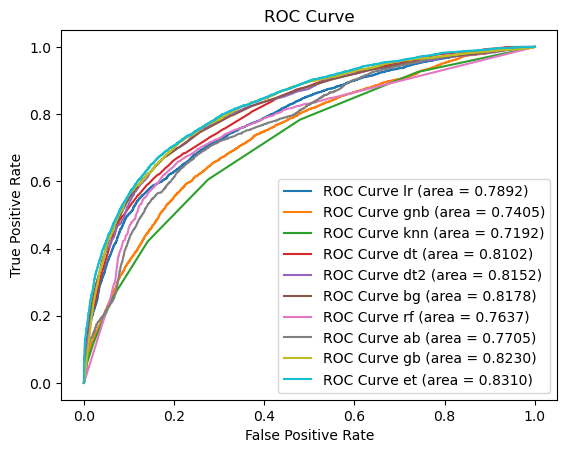

In [275]:
# models already fitted to the training dataset
lr_fitted = clone(lr_with_best).fit(x_train, y_train)
gnb_fitted = clone(gnb_with_best).fit(x_train, y_train)
knn_fitted = clone(knn_with_best).fit(x_train[upd_metric_features], y_train)
dt_fitted = clone(dt_with_best).fit(x_train, y_train)
dt2_fitted = clone(dt2_with_best).fit(x_train, y_train)
bg_fitted = clone(bg_with_best).fit(x_train, y_train)
rf_fitted = clone(rf_with_best).fit(x_train, y_train)
ab_fitted = clone(ab_with_best).fit(x_train, y_train)
gb_fitted = clone(gb_with_best).fit(x_train, y_train)
et_fitted = clone(et_with_best).fit(x_train, y_train)

# obtaining the probability estimates for the validation dataset
prob_lr_fitted = lr_fitted.predict_proba(x_val)
prob_gnb_fitted = gnb_fitted.predict_proba(x_val)
prob_knn_fitted = knn_fitted.predict_proba(x_val[upd_metric_features])
prob_dt_fitted = dt_fitted.predict_proba(x_val)
prob_dt2_fitted = dt2_fitted.predict_proba(x_val)
prob_bg_fitted = bg_fitted.predict_proba(x_val)
prob_rf_fitted = rf_fitted.predict_proba(x_val)
prob_ab_fitted = ab_fitted.predict_proba(x_val)
prob_gb_fitted = gb_fitted.predict_proba(x_val)
prob_et_fitted = et_fitted.predict_proba(x_val)

# creating the roc curve objects for every model (false positive rates and true positive rates)
fpr_lr_fitted, tpr_lr_fitted, thresholds_lr_fitted = roc_curve(y_val, prob_lr_fitted[:, 1])
fpr_gnb_fitted, tpr_gnb_fitted, thresholds_gnb_fitted = roc_curve(y_val, prob_gnb_fitted[:, 1])
fpr_knn_fitted, tpr_knn_fitted, thresholds_knn_fitted = roc_curve(y_val, prob_knn_fitted[:, 1])
fpr_dt_fitted, tpr_dt_fitted, thresholds_dt_fitted = roc_curve(y_val, prob_dt_fitted[:, 1])
fpr_dt2_fitted, tpr_dt2_fitted, thresholds_dt2_fitted = roc_curve(y_val, prob_dt2_fitted[:, 1])
fpr_bg_fitted, tpr_bg_fitted, thresholds_bg_fitted = roc_curve(y_val, prob_bg_fitted[:, 1])
fpr_rf_fitted, tpr_rf_fitted, thresholds_rf_fitted = roc_curve(y_val, prob_rf_fitted[:, 1])
fpr_ab_fitted, tpr_ab_fitted, thresholds_ab_fitted = roc_curve(y_val, prob_ab_fitted[:, 1])
fpr_gb_fitted, tpr_gb_fitted, thresholds_gb_fitted = roc_curve(y_val, prob_gb_fitted[:, 1])
fpr_et_fitted, tpr_et_fitted, thresholds_et_fitted = roc_curve(y_val, prob_et_fitted[:, 1])

# calculating the area under the curve for every model
roc_auc_lr_fitted = auc(fpr_lr_fitted, tpr_lr_fitted)
roc_auc_gnb_fitted = auc(fpr_gnb_fitted, tpr_gnb_fitted)
roc_auc_knn_fitted = auc(fpr_knn_fitted, tpr_knn_fitted)
roc_auc_dt_fitted = auc(fpr_dt_fitted, tpr_dt_fitted)
roc_auc_dt2_fitted = auc(fpr_dt2_fitted, tpr_dt2_fitted)
roc_auc_bg_fitted = auc(fpr_bg_fitted, tpr_bg_fitted)
roc_auc_rf_fitted = auc(fpr_rf_fitted, tpr_rf_fitted)
roc_auc_ab_fitted = auc(fpr_ab_fitted, tpr_ab_fitted)
roc_auc_gb_fitted = auc(fpr_gb_fitted, tpr_gb_fitted)
roc_auc_et_fitted = auc(fpr_et_fitted, tpr_et_fitted)

# plotting the ROC curves in the same plot
plt.figure()
plt.plot(fpr_lr_fitted, tpr_lr_fitted, label = 'ROC Curve lr (area = %0.4f)' % roc_auc_lr_fitted)
plt.plot(fpr_gnb_fitted, tpr_gnb_fitted, label = 'ROC Curve gnb (area = %0.4f)' % roc_auc_gnb_fitted)
plt.plot(fpr_knn_fitted, tpr_knn_fitted, label = 'ROC Curve knn (area = %0.4f)' % roc_auc_knn_fitted)
plt.plot(fpr_dt_fitted, tpr_dt_fitted, label = 'ROC Curve dt (area = %0.4f)' % roc_auc_dt_fitted)
plt.plot(fpr_dt2_fitted, tpr_dt2_fitted, label = 'ROC Curve dt2 (area = %0.4f)' % roc_auc_dt2_fitted)
plt.plot(fpr_bg_fitted, tpr_bg_fitted, label = 'ROC Curve bg (area = %0.4f)' % roc_auc_bg_fitted)
plt.plot(fpr_rf_fitted, tpr_rf_fitted, label = 'ROC Curve rf (area = %0.4f)' % roc_auc_rf_fitted)
plt.plot(fpr_ab_fitted, tpr_ab_fitted, label = 'ROC Curve ab (area = %0.4f)' % roc_auc_ab_fitted)
plt.plot(fpr_gb_fitted, tpr_gb_fitted, label = 'ROC Curve gb (area = %0.4f)' % roc_auc_gb_fitted)
plt.plot(fpr_et_fitted, tpr_et_fitted, label = 'ROC Curve et (area = %0.4f)' % roc_auc_et_fitted)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc = 'lower right')

# plt.savefig('ROC_curve.svg')

plt.show()

So, as we can see the model with the higher AUC is Extra Trees. The AUC is 0.83 meaning that the probability that this model will assign a higher rank to a randomly selected positive instance than to a randomly selected negative instance is 0.83. For this model, we can plot the precision-recall curve, that plots precision against recall for different classification thresholds. Precision is the proportion of predicted positive instances that are actually positive, while recall is the proportion of actual positive instances that are correctly classified as positive. Also, we can find what is the best threshold to use in order to maximize the recall, because that is what we want in our business problem. 

Best threshold=0.257071, recall=0.800


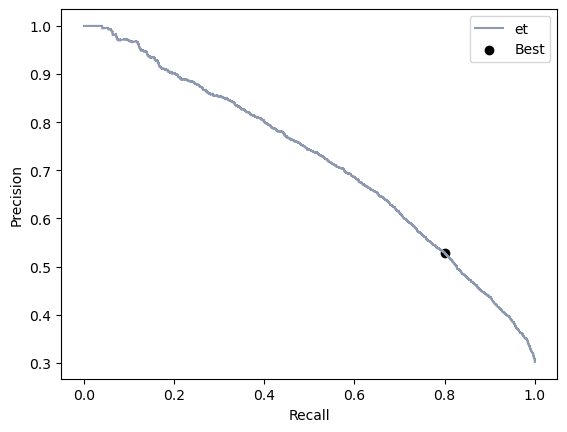

In [272]:
desired_recall = 0.8

# getting the right metrics
precision, recall, thresholds = precision_recall_curve(y_val, prob_et_fitted[:, 1])

# locate the index of the desired threshold
ix = np.argmin(recall >= desired_recall)
print('Best threshold=%f, recall=%.3f' % (thresholds[ix], recall[ix]))

plt.plot(recall, precision, marker = ',', label = 'et', color = '#8d99ae')
plt.scatter(recall[ix], precision[ix], marker = 'o', color = 'black', label = 'Best')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show()

As we can see, the best threshold to decide whether our model will consider an observation to have a target value of 1 or a target value of 0 is 0.257071 (usually the threshold used by the models is 0.5). It is possible to change the threshold for the predictions, so we can do that in the validation dataset that we split above to plot the ROC curve.

In [262]:
# applying the desired threshold to the predicted probabilities
y_pred_et = np.where(prob_et_fitted[:, 1] >= 0.257071, 1, 0)

# calculating the recall
recall_score(y_val, y_pred_et)

0.7999163704787791

As we can see, the recall for the validation dataset improved by changing the threshold according to our business needs, therefore, we can change the previous function to apply cross-validation to the dataset and train the models, adding a new argument that is the threshold that the model considers to classify the data points.

In [267]:
def threshold_model_metrics(x, y, model, split_method, encoding_list, scaling_list, outlier_list, threshold):
    """
    inputs:
    - x: pandas DataFrame with the independent features.
    - y: pandas DataFrame with the target values.
    - model: machine learning model instance to use for prediction.
    - split_method: cross-validation method using for splitting the dataset in training and validation (sk-learn instance).
    - encoding_list: list of boolean values that determine which encoding methods to use.
                     encoding_list = [one-hot encoding, ordinal encoding]
                     if we want to encode the non metric features using one-hot encoding, we pass to the function [True, False]
                     if we want to encode the non metric features using ordinal encoding, we pass to the functiom [False, True]
    - scaling_list: list of boolean values that determine which scaling methods to use. 
                    scaling_list = [min-max, standard, robust]
                    if we want to scale the data using min-max method, we pass to the function [True, False, False]
                    if we want to scale the data using standard method, we pass to the function [False, True, False]
                    if we want to scale the data using robust method, we pass to the function [False, False, True]
    - outlier_list: list of boolean values that determine whether to remove outliers or not and which method to use.
                    outlier_list = [manual_filtering, iqr_filtering]
                    if we want to remove outliers using manual filtering method, we pass to the function [True, False]
                    if we want to remove outliers using IQR method, we pass to the function [False, True]
                    if we do not want to remove outliers, we pass to the function [False, False]
    - threshold: float representing the threshold value to be applied to predicted probabilities or scores.
    
    function to calculate the performance metrics of a machine learning model for training and validation datasets
    the time taken to fit the model and the overfitting metric (difference between the recall of the validation and training dataset) are also calculated
    """
    
    # these lists store the metrics for the training data and for the validation data, for each model
    f1_train = []
    f1_val = []

    precision_train = []
    precision_val = []

    accuracy_train = []
    accuracy_val = []

    recall_train = []
    recall_val = []
    
    # this list stores the time
    timer = []

    # one iteration for each model created for each fold of the dataset
    for train_index, val_index in split_method.split(x, y):
        
        # getting the index from the splits
        x_train, x_val = x.iloc[train_index], x.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]

        # -------------------------------------------------------------------------------------------------------------------------
        # INPUTING THE MISSING VALUES
        # -------------------------------------------------------------------------------------------------------------------------
        # a control to know if there are metric features in our dataset to scale and to inpute missing values in Children
        metric_bool = True
        for feature in upd_upd_metric_features:
            if feature not in x.columns:
                metric_bool = False

        # -------------------------------------------------------------------------------------------------------------------------
        # REMOVING OUTLIERS
        # -------------------------------------------------------------------------------------------------------------------------
        if outlier_list[0] & ~outlier_list[1]:
            x_train, y_train, manual_filter = upd_model_x_y_manual_method(x_train, y_train)

        if ~outlier_list[0] & outlier_list[1]:
            x_train, y_train, iqr_filter = x_y_IQR_method(x_train, y_train, upd_upd_metric_features)
            
        # -------------------------------------------------------------------------------------------------------------------------
        # ENCODING THE FEATURES
        # -------------------------------------------------------------------------------------------------------------------------
        # encoding all non-metric features with one-hot encoder
        if encoding_list[0] & ~encoding_list[1]:
            x_train, x_val, feat_encoded = train_val_ohc(x_train, x_val, upd_non_metric_features)

        # encoding all non-metric features with ordinal encoder    
        if ~encoding_list[0] & encoding_list[1]:
            x_train, x_val = train_val_oe(x_train, x_val, upd_non_metric_features)
        
        # -------------------------------------------------------------------------------------------------------------------------
        # SCALING THE FEATURES
        # -------------------------------------------------------------------------------------------------------------------------
             
        if metric_bool & scaling_list[0]:
            # scaling the data with the min-max scaler using the function created before, only if there are metric features
            scaler, x_train, x_val = train_val_minmax_scaler(x_train, x_val, upd_upd_metric_features)
            
        if metric_bool & scaling_list[1]:
            # scaling the data with the standard scaler using the function created before, only if there are metric features
            scaler, x_train, x_val = train_val_standard_scaler(x_train, x_val, upd_upd_metric_features)
            
        if metric_bool & scaling_list[2]:
            # scaling the data with the robust scaler using the function created before, only if there are metric features
            scaler, x_train, x_val = train_val_robust_scaler(x_train, x_val, upd_upd_metric_features)
        
        # -------------------------------------------------------------------------------------------------------------------------
        # MODELLING
        # -------------------------------------------------------------------------------------------------------------------------
        # start counting time
        begin = time.perf_counter()
        
        # fitting the model to the validation dataset
        model.fit(X = x_train, y = y_train)
        
        # finish counting time
        end = time.perf_counter()

        # getting the predicted probabilities or scores
        y_train_pred_prob = model.predict_proba(x_train)[:, 1]
        y_val_pred_prob = model.predict_proba(x_val)[:, 1]

        # apply the desired threshold to the predicted probabilities or scores
        y_train_pred = (y_train_pred_prob >= threshold).astype(int)
        y_val_pred = (y_val_pred_prob >= threshold).astype(int)
        
        # calculating the metrica for the models we created in each iteration of the loop
        value_f1_train = f1_score(y_train, y_train_pred)
        value_f1_val = f1_score(y_val, y_val_pred)

        value_precision_train = precision_score(y_train, y_train_pred)
        value_precision_val = precision_score(y_val, y_val_pred)

        value_accuracy_train = accuracy_score(y_train, y_train_pred)
        value_accuracy_val = accuracy_score(y_val, y_val_pred)

        value_recall_train = recall_score(y_train, y_train_pred)
        value_recall_val = recall_score(y_val, y_val_pred)
                
        # storing the metrics for both training and validation datasets
        f1_train.append(value_f1_train)
        f1_val.append(value_f1_val)

        precision_train.append(value_precision_train)
        precision_val.append(value_precision_val)

        accuracy_train.append(value_accuracy_train)
        accuracy_val.append(value_accuracy_val)

        recall_train.append(value_recall_train)
        recall_val.append(value_recall_val)
        
        # storing the time
        timer.append(end - begin)
    
    # calculating the average and the standard deviation of the metrics for all models created
    train_f1_average = round(np.mean(f1_train), 5)
    val_f1_average = round(np.mean(f1_val), 5)
    train_f1_std = round(np.std(f1_train), 5)
    val_f1_std = round(np.std(f1_val), 5)

    train_precision_average = round(np.mean(precision_train), 5)
    val_precision_average = round(np.mean(precision_val), 5)
    train_precision_std = round(np.std(precision_train), 5)
    val_precision_std = round(np.std(precision_val), 5)

    train_accuracy_average = round(np.mean(accuracy_train), 5)
    val_accuracy_average = round(np.mean(accuracy_val), 5)
    train_accuracy_std = round(np.std(accuracy_train), 5)
    val_accuracy_std = round(np.std(accuracy_val), 5)

    train_recall_average = round(np.mean(recall_train), 5)
    val_recall_average = round(np.mean(recall_val), 5)
    train_recall_std = round(np.std(recall_train), 5)
    val_recall_std = round(np.std(recall_val), 5)
    
    time_average = round(np.mean(timer), 3)
    time_std = round(np.std(timer), 2)
    overfitting_recall = round(train_recall_average - val_recall_average, 5)

    return str(train_f1_average) + '+/-' + str(train_f1_std), str(val_f1_average) + '+/-' + str(val_f1_std),\
           str(train_precision_average) + '+/-' + str(train_precision_std), str(val_precision_average) + '+/-' + str(val_precision_std),\
           str(train_accuracy_average) + '+/-' + str(train_accuracy_std), str(val_accuracy_average) + '+/-' + str(val_accuracy_std),\
           str(train_recall_average) + '+/-' + str(train_recall_std), str(val_recall_average) + '+/-' + str(val_recall_std),\
           str(time_average) + '+/-' + str(time_std), str(overfitting_recall)

In [268]:
def threshold_show_results(df, *args):
    """
    inputs:
    - df: pandas DataFrame with empty rows to store the results.
    - args: tuple of arguments for each model that includes:
        - x: pandas DataFrame with the independent features.
        - y: pandas DataFrame with the target values.
        - model: machine learning model instance to use for prediction.
        - split_method: cross-validation method using for splitting the dataset in training and validation (sk-learn instance).
        - encode: boolean value indicating whether to perform one-hot encoding on non-metric features.
        - scaling_list: list of boolean values that determine which scaling methods to use. 
                        scaling_list = [min-max, standard, robust]
        - outlier_list: list of boolean values that determine whether to remove outliers or not and which method to use.
                        outlier_list = [manual_filtering, iqr_filtering]
                        if we want to remove outliers using manual filtering method, we pass to the function [True, False]
                        if we want to remove outliers using IQR method, we pass to the function [False, True]
                        if we do not want to remove outliers, we pass to the function [False, False]
        - threshold: float representing the threshold value to be applied to predicted probabilities or scores.

    function to organize the results of the models
    """

    count = 0
    # for each model and the split method, the model, the encoded schema and the scaling schema are passed as argument
    for arg in args:
        
        # obtain the results provided by avg_score
        train_f1_average,\
            val_f1_average,\
            train_precision_average,\
            val_precision_average,\
            train_accuracy_average,\
            val_accuracy_average,\
            train_recall_average,\
            val_recall_average,\
            time_average,\
            overfitting = threshold_model_metrics(arg[0], arg[1], arg[2], arg[3], arg[4], arg[5], arg[6], arg[7])
        
        # store the results in the right row
        df.iloc[count] = train_f1_average, val_f1_average, train_precision_average, val_precision_average, train_accuracy_average, val_accuracy_average, train_recall_average, val_recall_average, time_average, overfitting
        count += 1
        
    return df

In [271]:
# testing the Extra Trees model with the threshold found above

upd_threshold = pd.DataFrame(columns = ['F1 Train', 'F1 Validation', 'Precision Train', 'Precision Validation', 'Accuracy Train', 'Accuracy Validation', 'Recall Train', 'Recall Validation', 'Time', 'Overfitting'],
                             index = ['extra trees defined threshold'])

threshold_show_results(upd_threshold,
                       [data, target, et_with_best, skf, [True, False], [True, False, False], [True, False], 0.257071])

,F1 Train,F1 Validation,Precision Train,Precision Validation,Accuracy Train,Accuracy Validation,Recall Train,Recall Validation,Time,Overfitting
extra trees defined threshold,0.82995+/-0.00113,0.64622+/-0.00767,0.71324+/-0.00167,0.53736+/-0.00694,0.878+/-0.00098,0.73221+/-0.00612,0.99232+/-0.00045,0.81049+/-0.01213,1.689+/-0.05,0.18183


As we can see in the table of results we have 0.99 in recall for training datasets and 0.81 in recall for validation datasets, so both of the metrics meet the data mining success criteria. This indicates that the model effectively captures around 99.23% of the actual churned customers in the training dataset, and the model captures around 81.05% of the actual churned customers in the validation dataset. The overfitting value suggests that there might be some degree of overfitting, as the model performs significantly better on the training data compared to the validation data. It's important to assess if this level of overfitting is acceptable or if additional measures should be taken to mitigate it, but in this case since the business success criteria is already met, the metrics for this model are acceptable.

<a id = "best-model"></a>

### 4.3. Best model

After comparing the performance of out algorithms, as seen before, and after pondering the specific characteristics of the data and the goals of the model, we decided that the best model found was **Extra Trees**. We can check its metrics for the training and for the validation split that we made to plot the ROC curve.

In [263]:
# adapted from https://github.com/DTrimarchi10/confusion_matrix/blob/master/cf_matrix.py

def make_confusion_matrix(cf, group_names = None, categories = 'auto', count = True, percent = True, cbar = True, xyticks = True, xyplotlabels = True, sum_stats = True, figsize = None, cmap='Blues', title = None):
    """
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.
    Arguments
    ---------
    cf:            confusion matrix to be passed in
    group_names:   List of strings that represent the labels row by row to be shown in each square.
    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'
    count:         If True, show the raw number in the confusion matrix. Default is True.
    normalize:     If True, show the proportions for each category. Default is True.
    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix. Default is True.
    xyticks:       If True, show x and y ticks. Default is True.
    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.
    sum_stats:     If True, display summary statistics below the figure. Default is True.
    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.
    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
    title:         Title for the heatmap. Default is None.
    """

    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names) == cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten() / np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels, group_counts, group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0], cf.shape[1])

    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        # Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        # if it is a binary confusion matrix, show some more stats
        if len(cf) == 2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2 * precision * recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy, precision, recall, f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""

    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize == None:
        # Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks == False:
        # Do not show categories if xyticks is False
        categories=False

    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize = figsize)
    ax = sns.heatmap(cf, annot = box_labels, fmt = "", cmap = cmap, cbar = cbar, xticklabels = categories, yticklabels = categories)

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label' + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

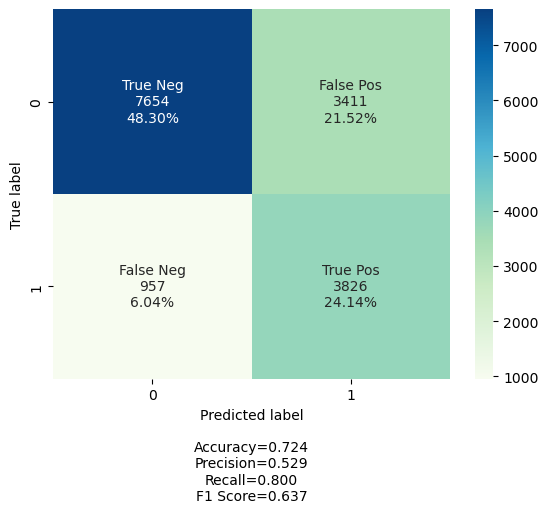

In [274]:
# showing the confusion matrix for the validation test that was defined above when plotting the ROC curve

cf = confusion_matrix(y_val, y_pred_et)
labels = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
categories = ['0', '1']
make_confusion_matrix(cf, group_names = labels, categories = categories, cmap = 'GnBu')

# plt.savefig('matrix.svg')

### SHAP values

SHAP (SHapley Additive exPlanations) values are a method for interpreting the results of machine learning models. They can give insights into the contribution of each feature used for training the model to the final prediction made. SHAP values are based on cooperative game theory and assign a value to each feature, indicating its impact on the prediction compared to the average prediction. SHAP values can be applied to any type of model and provide a way of quantifying the importance of individual features for a specific data point. However, these values have an additive property, so the sum of the SHAP values of all features equals the difference between the model's prediction for a specific data point and the average prediction across all data points. Therefore, the feature's importance is consistent and meaningful.

In [276]:
# using TreeExplainer since our model is a Extra Trees

explainer = shap.TreeExplainer(et_fitted)

We can start by explaing the prediction for the 20th data point in the dataset. We pass the model that contains the data to the `TreeExplainer` and then we can pass to `explainer.shap_values` the samples we want to explain, which can be training instances or valiadtion instances.

In [280]:
data_for_prediction = x_val.iloc[20]

shap_values = explainer.shap_values(data_for_prediction)

The `shap_values` is a list with two arrays. `shap_values[0]` are explanations with respect to the negative class, in this case reservations that were not cancelled, while `shap_values[1]` are explanations with respect to the positive class, reservations that were cancelled. In this case, since we have a binary model, it is sufficient to visualize only one of them. The shap package has a nice way to visualize the results

In [281]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], data_for_prediction)

We can think about these values as forces, meaning that each feature value is a force that either increases or decreases the prediction. The prediction starts from the baseline. In the plot, each SHAP value is an arrow that pushes to increase (positive value) or decrease (negative value) the prediction, and these forces balance each other out at the actual prediction of the data point. The output prediction is 0, which means that the model classifies the reservation as not cancelled. The base value is 0.3016, so feature values that push towards a not cancelled reservation are in blue, and the length of the region shows how much the feature contributes to this effect. Features increasing the prediction and making the reservation to be cancelled are in pink. If we subtract the length of the blue bars from the length of the pink bars, it equals the distance from the base value to the output.

In [282]:
print(explainer.expected_value[1])

0.30164403937689316


To get an overview of which features are most important for a model on a global level, we can plot the SHAP values of every feature for every sample. The idea behind SHAP feature importance is simple: Features with large absolute Shapley values are important.